In [1]:
from imblearn.metrics import geometric_mean_score
import numpy as np
import keras
import gc
from keras.constraints import max_norm
import tensorflow as tf
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense,Dropout,BatchNormalization,LeakyReLU
from keras import optimizers,regularizers
from keras.callbacks import ReduceLROnPlateau,EarlyStopping
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from imblearn.over_sampling import SMOTE, ADASYN
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn import metrics
import time
from datetime import datetime, timedelta
np.random.seed(13)
from sklearn import svm
import pandas as pd
import matplotlib.pyplot as plt
import math
from __future__ import division
from sklearn.model_selection import KFold
from sklearn.preprocessing import normalize


files=['AAPL','AMZN','PEP','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','BKNG','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
#files=['AAPL','AMZN','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
dates=list()
prices=list()
sentiment=list()
for file in files:
    param = {
        'q': file, # Stock symbol (ex: "AAPL")
        'i': "900", # Interval size in seconds ("86400" = 1 day intervals)
        'x': "NASD", # INDEXNASDAQStock exchange symbol on which stock is traded (ex: "NASD")
        'p': "2Y" # Period (Ex: "1Y" = 1 year)
        }
    sentimentVector =  pd.read_csv('/home/andrea/Desktop/NLFF/intrinioDatasetUpdated/Sentiment/'+file+'.csv')
    price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDatasetUpdated/'+file+'.csv')
    #sentimentVector =  pd.read_csv('/home/andrea/Desktop/NLFF/intrinioDataset/SentimentFul/'+file+'.csv')
    #price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDataset/indexes'+file+'.csv')
    #alignment of data
    maxdata=max(sentimentVector['initTime'])
    mindata=min(sentimentVector['initTime'])
    price['Unnamed: 0'] = [datetime.strptime(row, '%Y-%m-%d %H:%M:%S') for row in price['Unnamed: 0']]
    price['Unnamed: 0'] = [row-timedelta(hours=8) for row in price['Unnamed: 0']]
    price=price[price['Unnamed: 0']>=mindata]
    price=price[price['Unnamed: 0']<=maxdata]
    print(file)
    dates.append(price['Unnamed: 0'])
    sentimentVector=sentimentVector.drop(['Unnamed: 0', 'initTime' ], axis=1)
    meanvector=np.concatenate((sentimentVector,sentimentVector.rolling(5).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(10).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(15).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(20).mean()),axis=1)
    price=price.drop(['Unnamed: 0'],axis=1)
    #['macd','macds', 'boll_ub', 'boll_lb','rsi_6','rsi_12','vr_6_sma','wr_10','wr_6''close_10_sma''tr''middle_{}_sma'
    #df['dma'] = df['close_10_sma'] - df['close_50_sma'] pdi'] = cls._get_pdi(df, 14)df['mdi'] = cls._get_mdi(df, 14)
    #df['dx'] = cls._get_dx(df, 14) df['adx'] = df['dx_6_ema'] df['adxr'] = df['adx_6_ema']]
    #
    sentiment.append(meanvector)
    prices.append(price)

/home/andrea/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


AAPL
AMZN
PEP
GOOGL
MSFT
FB
INTC
CSCO
CMCSA
NVDA
NFLX
BKNG
ADBE
AMGN
TXN
AVGO
PYPL
GILD
COST
QCOM


In [2]:
def smote(x,y):
    X_resampled, y_resampled = SMOTE().fit_sample(x, y)
    #print('check',sum(y_resampled)/len(y_resampled))
    return X_resampled,y_resampled
def balance(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    nindex=min(len(posindex[0]),len(negindex[0]))

    #for i in range(1,nindex):
    yt=np.concatenate((y[posindex[0][0:nindex]],y[negindex[0][0:nindex]]))
    xt=np.concatenate((x[posindex[0][0:nindex]],x[negindex[0][0:nindex]]))
    
    return xt,yt

def balanceup(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    
    if(len(posindex[0])!=0 and len(negindex[0])!=0):
       
        nindex=max(len(posindex[0]),len(negindex[0]))
        mini=min(len(posindex[0]),len(negindex[0]))
        diff=nindex-mini
        u=0
        for i in range(0,mini):
            yt.append(y[posindex[0][i]])
            yt.append(y[negindex[0][i]])
            xt.append(x[posindex[0][i]])
            xt.append(x[negindex[0][i]])
        #print('first',sum(yt)/len(yt)) 
        if(len(posindex[0])>len(negindex[0])):
            toextract=negindex
            enter=posindex
        else:
            toextract=posindex
            enter=negindex
        if(diff!=0 and len(toextract[0])!=0):
            for i in range(0,diff):
                r=np.random.randint(0,len(toextract))
                yt.append(y[toextract[0][r]])
                xt.append(x[toextract[0][r]])
                yt.append(y[enter[0][mini+i]])
                xt.append(x[enter[0][mini+i]])
    else:
        #print('Unbalance')
        u=1
        xt=x
        yt=y
    #print(sum(yt)/len(yt))              
    return xt,yt,u
                    

In [3]:
def buildModel(l,n,d,le):
    opt=optimizers.Adam(lr=le)
    model = Sequential()  
    model.add(Dense(n, input_dim=40,kernel_constraint=max_norm(1),activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/2),kernel_constraint=max_norm(1), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU())
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/4),kernel_constraint=max_norm(1), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dense(1, activation='sigmoid')) 
    
    model.compile(optimizer=opt,loss='binary_crossentropy', metrics=['accuracy'])
    #o
    return model
def reset_weights(model):
    session=K.get_session()
    for layer in model.layers:
        if(hasattr(layer,'kernel_initializer')):
            layer.kernel.initializer.run(session=session)
           


Working on... AAPL
15.571701720841297
0.005338458253266777
working on d,u and l,le 0.5 64 0.01 0.001


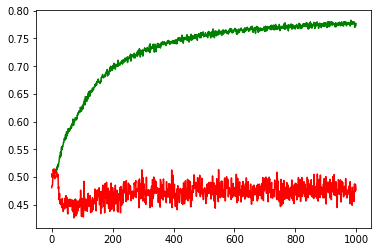

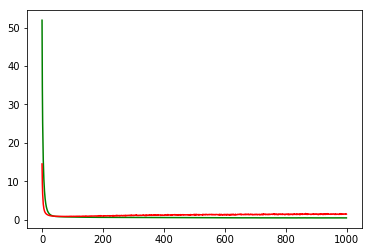

working on d,u and l,le 0.5 64 0.01 0.0001


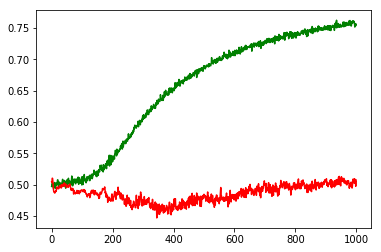

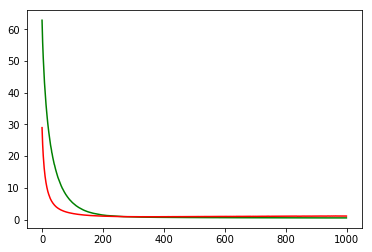

working on d,u and l,le 0.5 64 0.01 1e-05


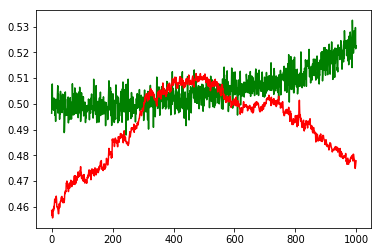

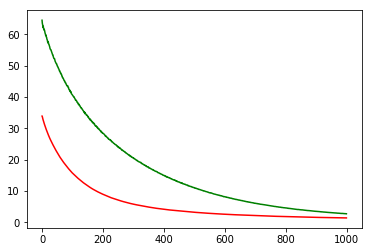

working on d,u and l,le 0.5 64 0.05 0.001


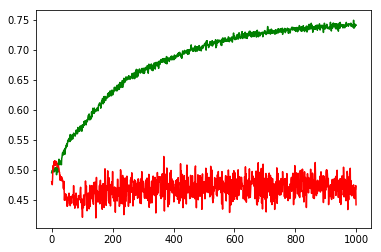

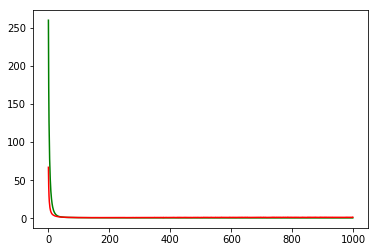

working on d,u and l,le 0.5 64 0.05 0.0001


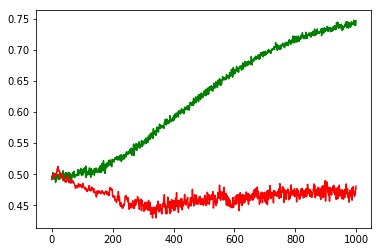

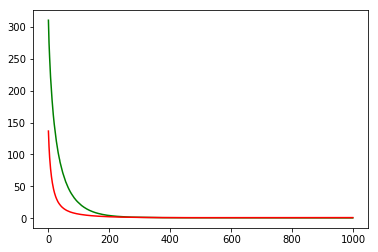

working on d,u and l,le 0.5 64 0.05 1e-05


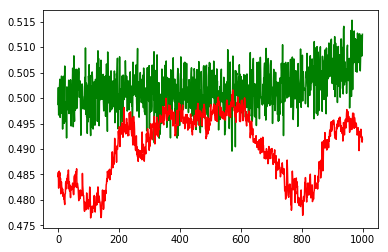

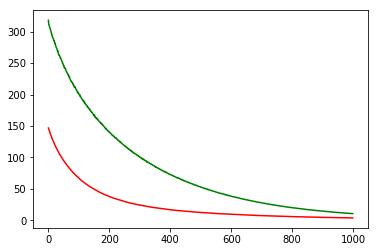

working on d,u and l,le 0.5 128 0.01 0.001


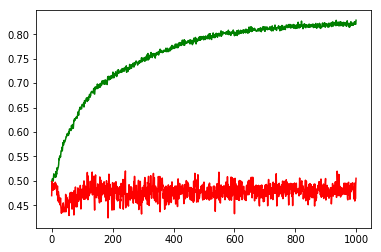

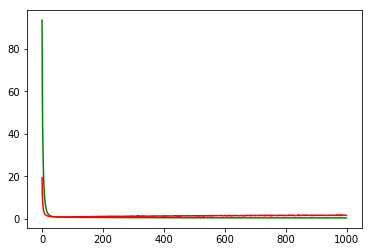

working on d,u and l,le 0.5 128 0.01 0.0001


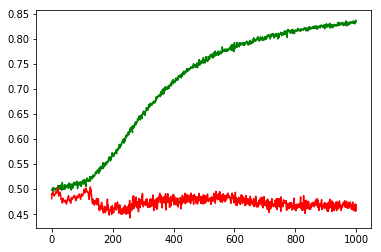

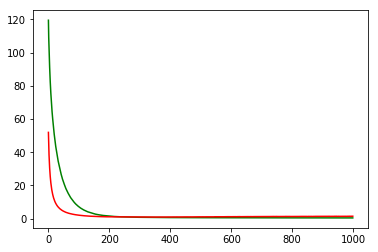

working on d,u and l,le 0.5 128 0.01 1e-05


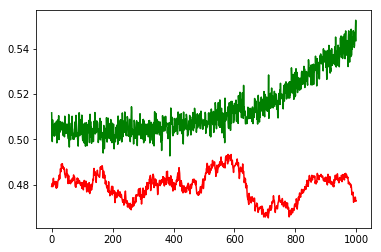

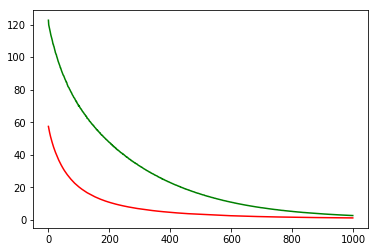

working on d,u and l,le 0.5 128 0.05 0.001


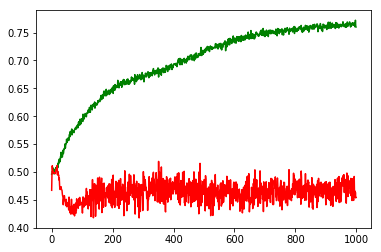

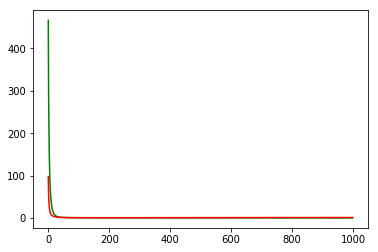

working on d,u and l,le 0.5 128 0.05 0.0001


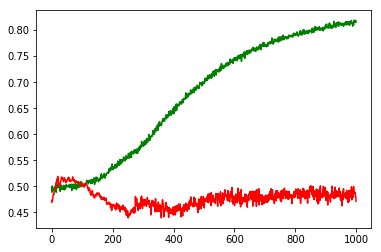

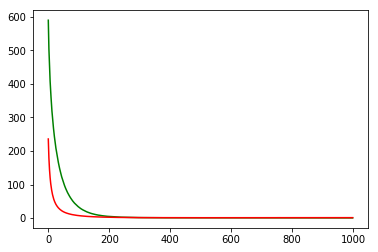

working on d,u and l,le 0.5 128 0.05 1e-05


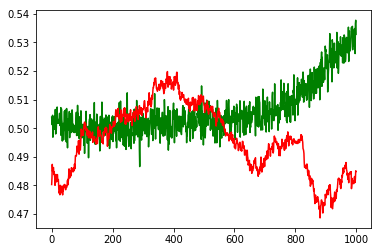

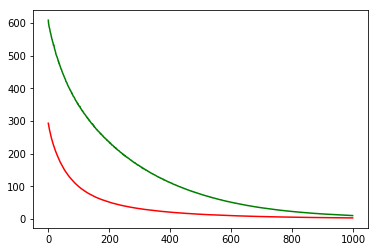

working on d,u and l,le 0.5 256 0.01 0.001


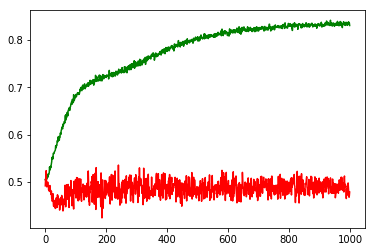

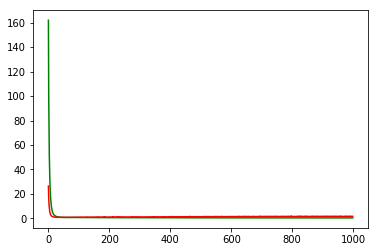

working on d,u and l,le 0.5 256 0.01 0.0001


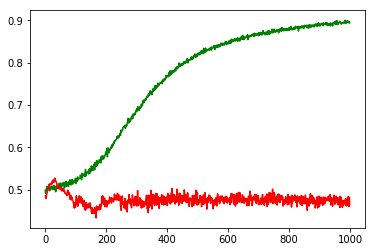

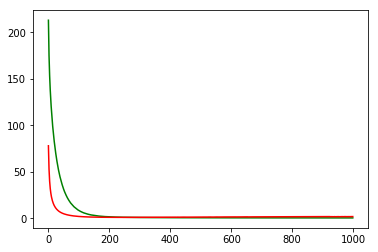

working on d,u and l,le 0.5 256 0.01 1e-05


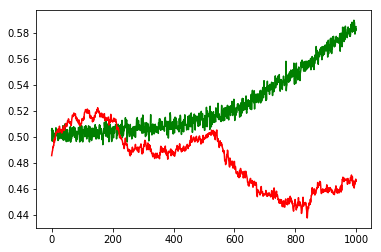

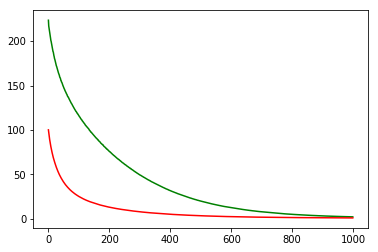

working on d,u and l,le 0.5 256 0.05 0.001


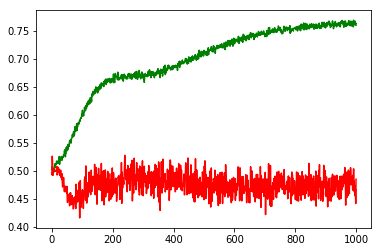

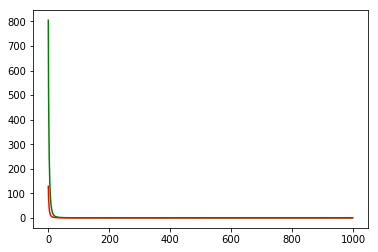

working on d,u and l,le 0.5 256 0.05 0.0001


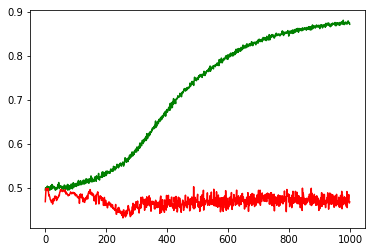

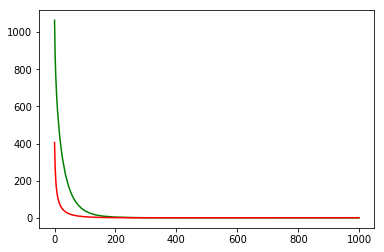

working on d,u and l,le 0.5 256 0.05 1e-05


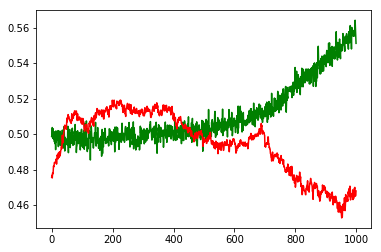

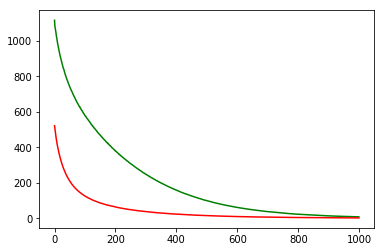

maxd,maxu,maxl,maxle: 0.5 64 0.01 0.0001
Chart for BEST MODEL FOR: AAPL


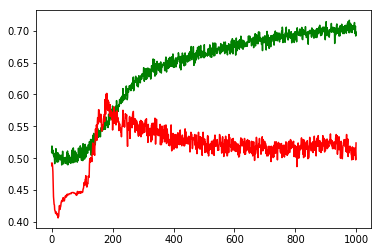

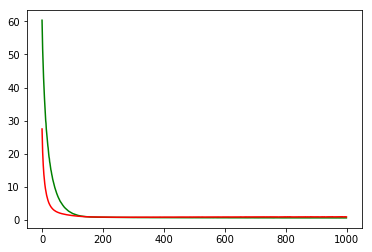

F1,score 0.5385934819897085
G-score: 0.5257988945893991
Accuracy 0.5238938046767648
Window: 140
[[278 228]
 [310 314]]
Vol pos 2.7204560414567207
Vol neg 3.67328707353102
Real Percentage of gain: 26.485987683809803
Percentage of gain: -0.3236446628471773
Total gain: -365.7184690173103
000000000000000000000000000000000000000000000000
Percentile:  0
[[224 154]
 [169 206]]
753/753 [==============================] - 0s 27us/step
[0.7404921785452134, 0.5710491374194384]
Percentile:  1
[[21 47]
 [44 40]]
152/152 [==============================] - 0s 30us/step
[1.2171161049290706, 0.4013157910422275]
Percentile:  2
[[33 27]
 [33 46]]
139/139 [==============================] - 0s 37us/step
[0.9812429894646295, 0.5683453258850591]
Percentile:  3
[[ 0  0]
 [41  8]]
49/49 [==============================] - 0s 47us/step
[0.9129252202656805, 0.16326531037992362]
Percentile:  4
[[ 0  0]
 [23 12]]
35/35 [==============================] - 0s 75us/step
[1.043342845780509, 0.34285714285714286]
000000000

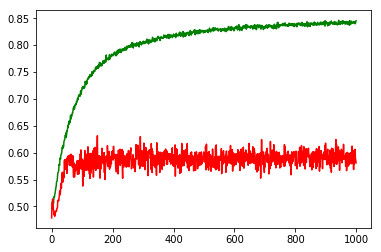

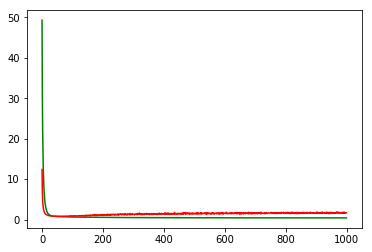

working on d,u and l,le 0.5 64 0.01 0.0001


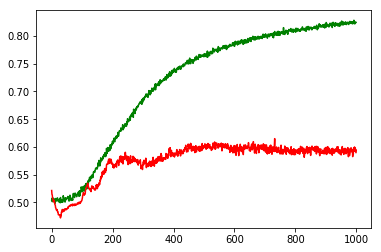

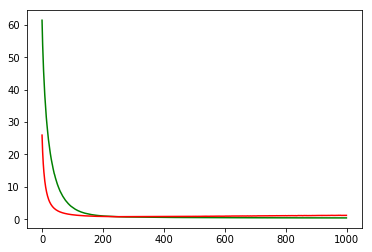

working on d,u and l,le 0.5 64 0.01 1e-05


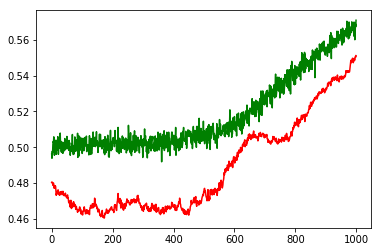

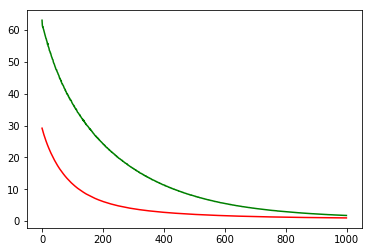

working on d,u and l,le 0.5 64 0.05 0.001


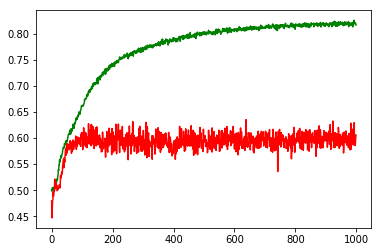

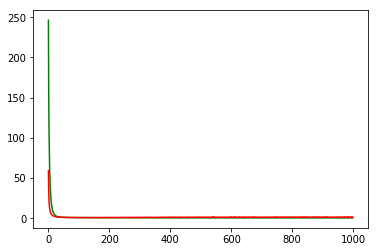

working on d,u and l,le 0.5 64 0.05 0.0001


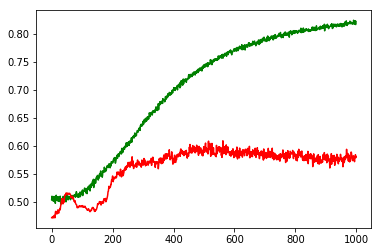

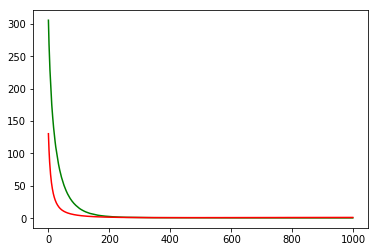

working on d,u and l,le 0.5 64 0.05 1e-05


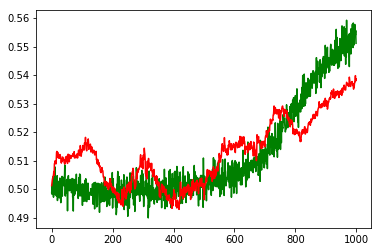

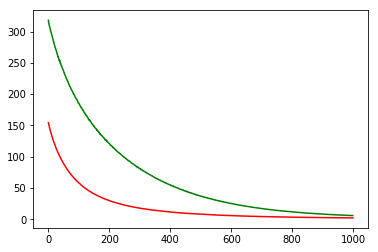

working on d,u and l,le 0.5 128 0.01 0.001


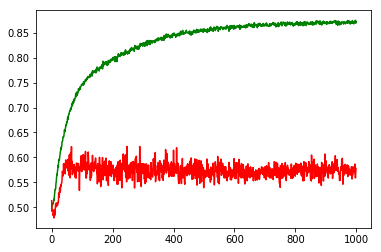

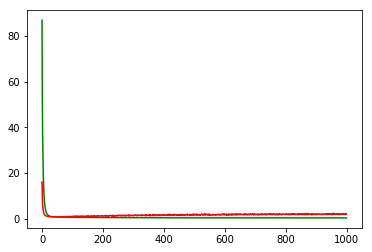

working on d,u and l,le 0.5 128 0.01 0.0001


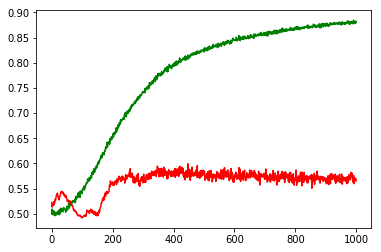

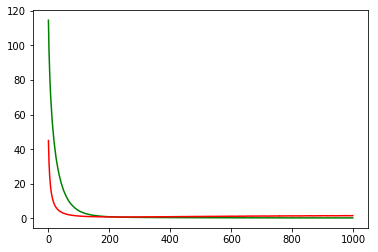

working on d,u and l,le 0.5 128 0.01 1e-05


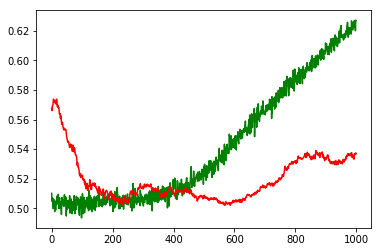

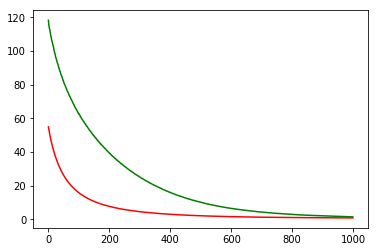

working on d,u and l,le 0.5 128 0.05 0.001


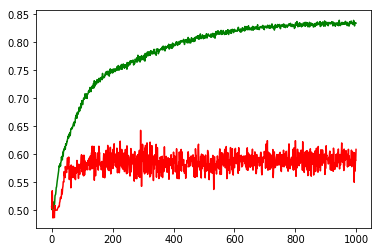

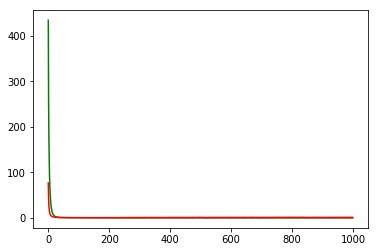

working on d,u and l,le 0.5 128 0.05 0.0001


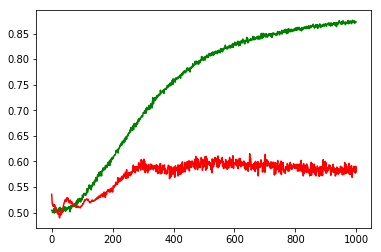

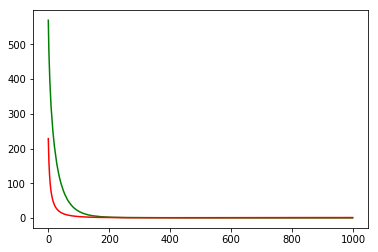

working on d,u and l,le 0.5 128 0.05 1e-05


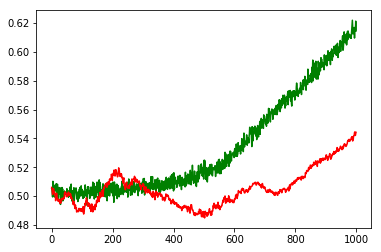

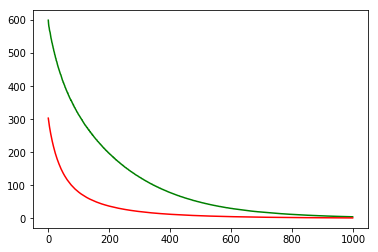

working on d,u and l,le 0.5 256 0.01 0.001


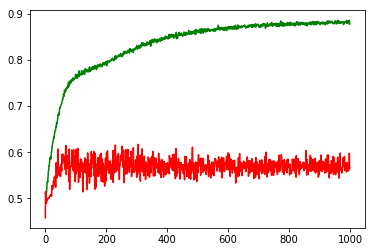

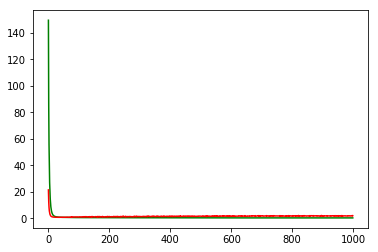

working on d,u and l,le 0.5 256 0.01 0.0001


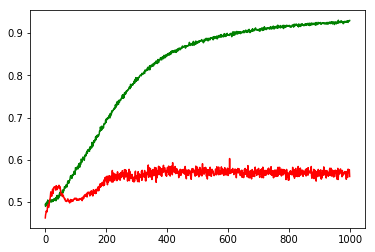

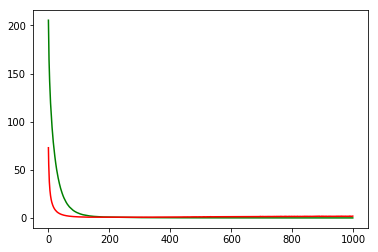

working on d,u and l,le 0.5 256 0.01 1e-05


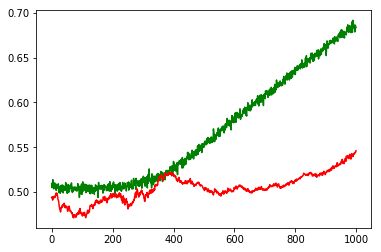

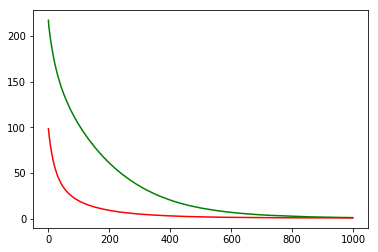

working on d,u and l,le 0.5 256 0.05 0.001


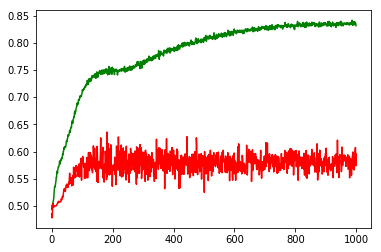

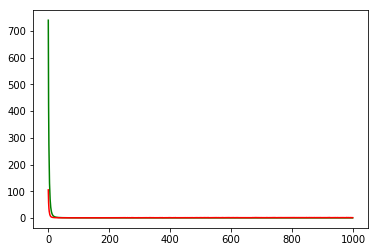

working on d,u and l,le 0.5 256 0.05 0.0001


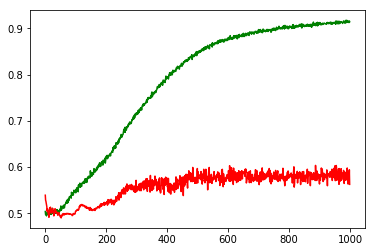

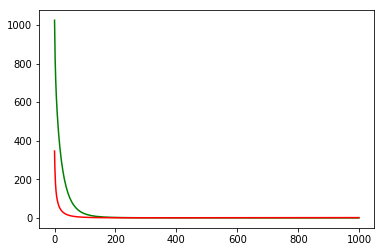

working on d,u and l,le 0.5 256 0.05 1e-05


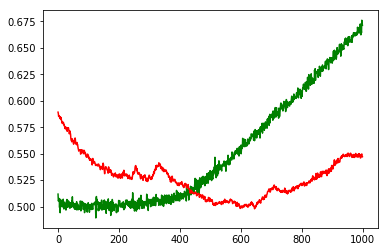

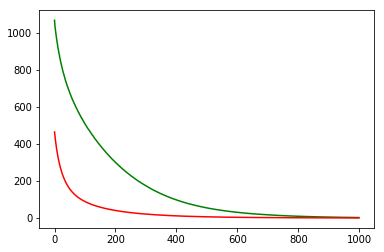

maxd,maxu,maxl,maxle: 0.5 128 0.05 0.001
Chart for BEST MODEL FOR: AMZN


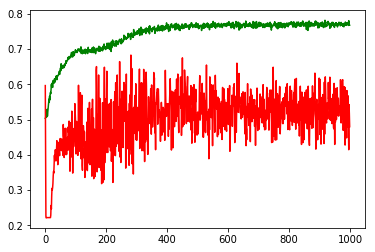

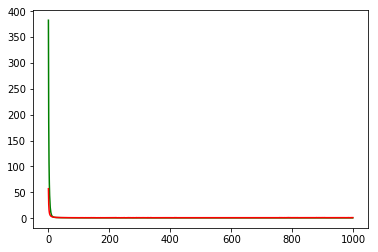

F1,score 0.5765636232925954
G-score: 0.5074479981173743
Accuracy 0.47968197669241536
Window: 140
[[142 109]
 [480 401]]
Vol pos 2.1724450045552848
Vol neg 2.538562090876683
Real Percentage of gain: 15.379036107678072
Percentage of gain: -0.27877688520569477
Total gain: -315.5754340528465
000000000000000000000000000000000000000000000000
Percentile:  0
[[126  73]
 [233 198]]
630/630 [==============================] - 0s 28us/step
[1.0475657686354622, 0.5142857133396088]
Percentile:  1
[[  7  29]
 [195 154]]
385/385 [==============================] - 0s 29us/step
[1.0915444810669144, 0.41818181818181815]
Percentile:  2
[[ 9  7]
 [16 44]]
76/76 [==============================] - 0s 44us/step
[0.5766897515246743, 0.6973684218369032]
Percentile:  3
[[ 0  0]
 [29  4]]
33/33 [==============================] - 0s 86us/step
[1.4247212446097173, 0.12121212121212122]
Percentile:  4
[[0 0]
 [6 0]]
6/6 [==============================] - 0s 109us/step
[1.6038662195205688, 0.0]
00000000000000000000000

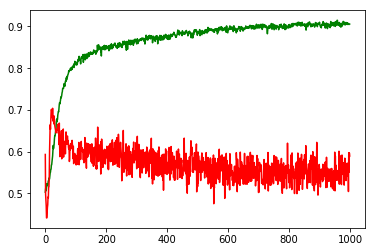

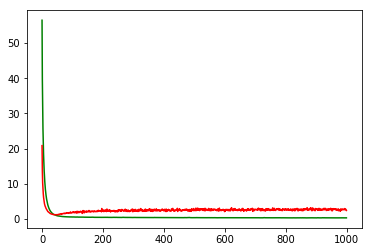

working on d,u and l,le 0.5 64 0.01 0.0001


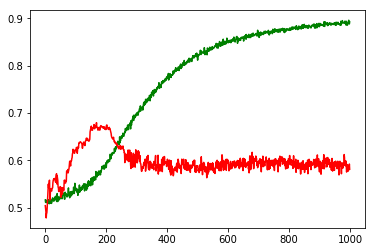

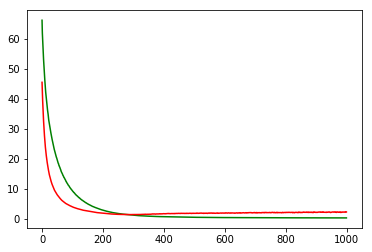

working on d,u and l,le 0.5 64 0.01 1e-05


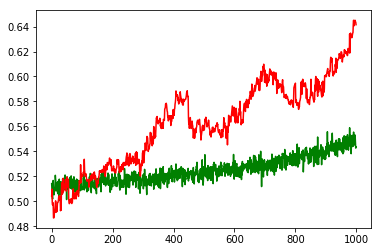

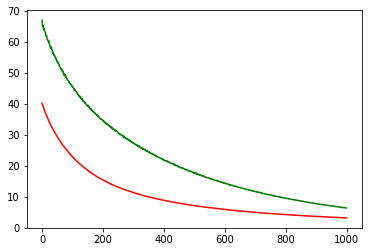

working on d,u and l,le 0.5 64 0.05 0.001


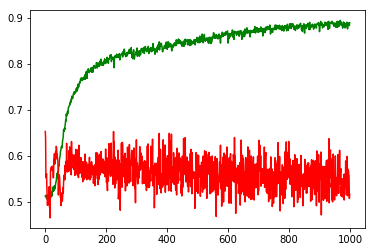

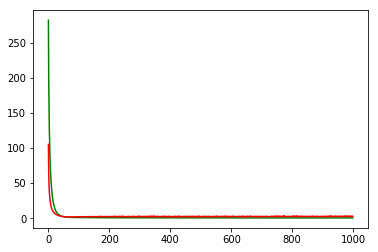

working on d,u and l,le 0.5 64 0.05 0.0001


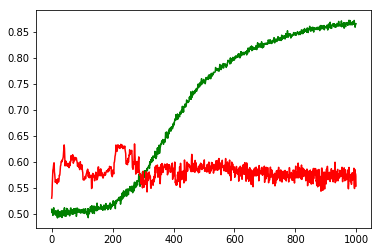

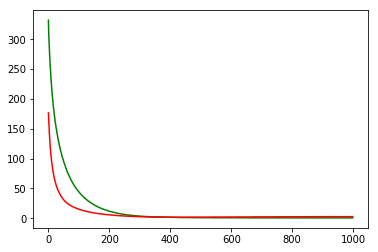

working on d,u and l,le 0.5 64 0.05 1e-05


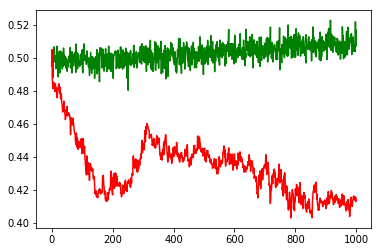

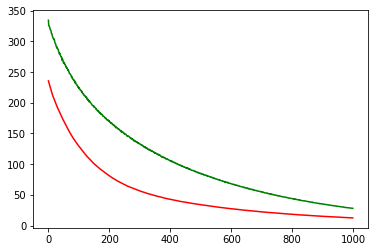

working on d,u and l,le 0.5 128 0.01 0.001


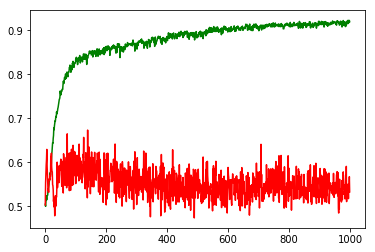

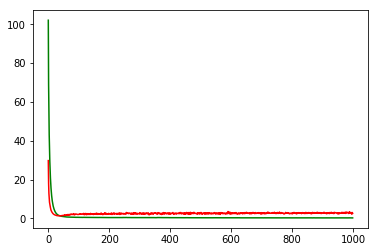

working on d,u and l,le 0.5 128 0.01 0.0001


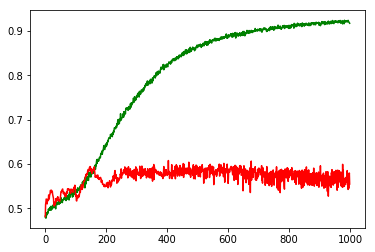

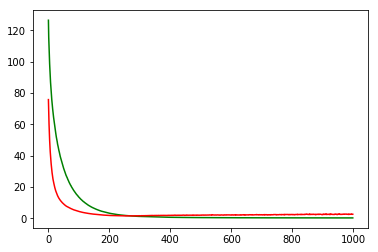

working on d,u and l,le 0.5 128 0.01 1e-05


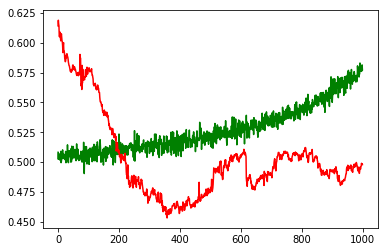

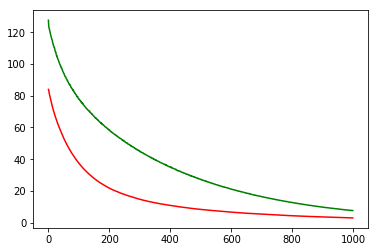

working on d,u and l,le 0.5 128 0.05 0.001


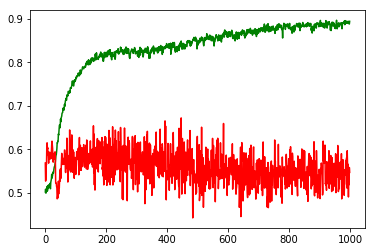

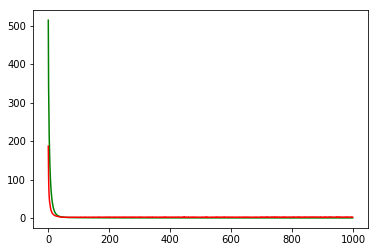

working on d,u and l,le 0.5 128 0.05 0.0001


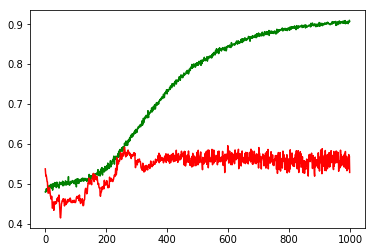

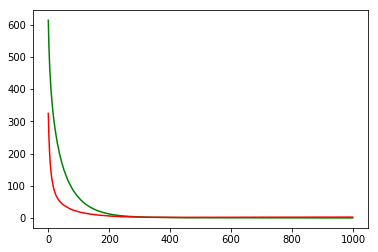

working on d,u and l,le 0.5 128 0.05 1e-05


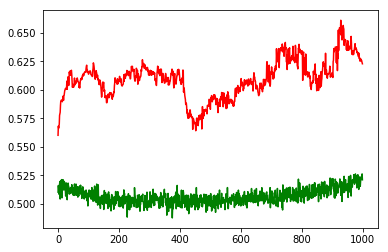

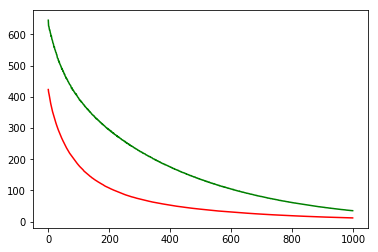

working on d,u and l,le 0.5 256 0.01 0.001


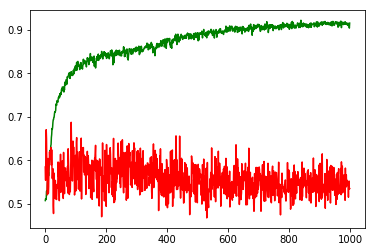

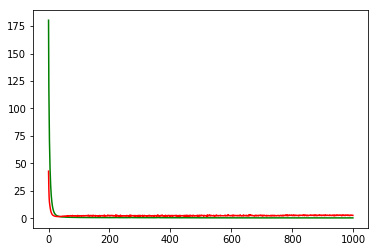

working on d,u and l,le 0.5 256 0.01 0.0001


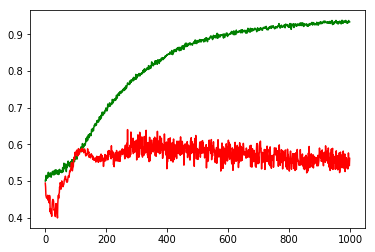

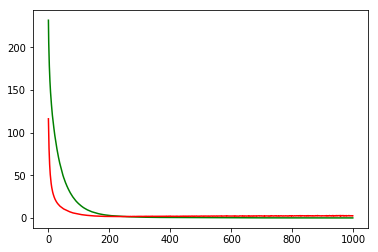

working on d,u and l,le 0.5 256 0.01 1e-05


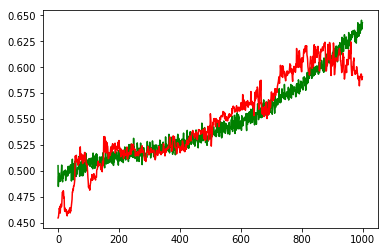

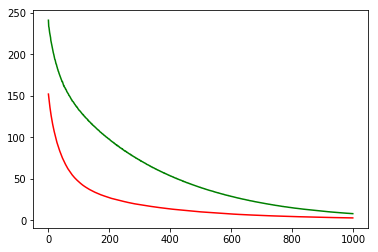

working on d,u and l,le 0.5 256 0.05 0.001


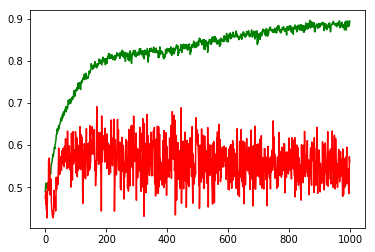

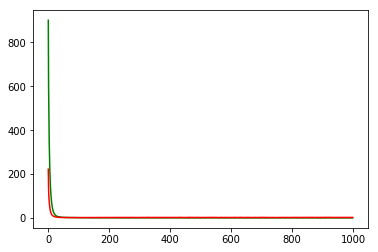

working on d,u and l,le 0.5 256 0.05 0.0001


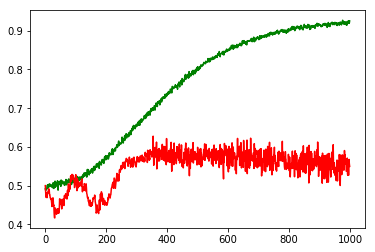

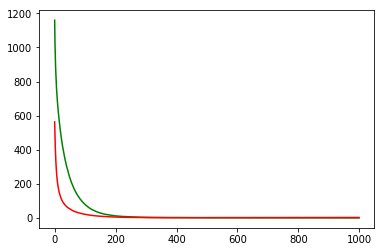

working on d,u and l,le 0.5 256 0.05 1e-05


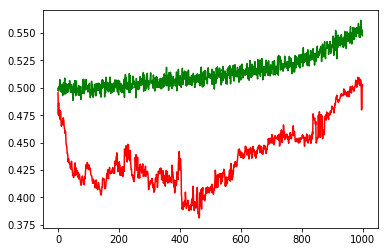

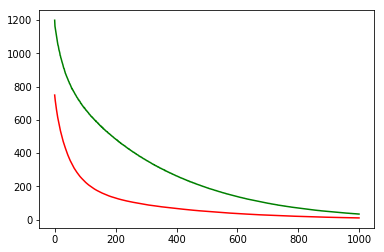

maxd,maxu,maxl,maxle: 0.5 64 0.01 1e-05
Chart for BEST MODEL FOR: PEP


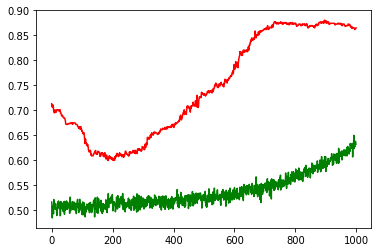

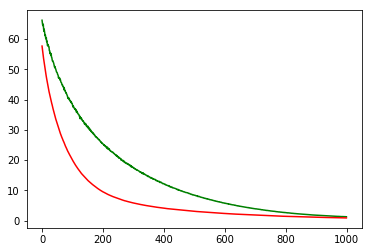

F1,score 0.9233449477351916
G-score: 0.58584158359364
Accuracy 0.8648233486943164
Window: 140
[[ 33  58]
 [ 30 530]]
Vol pos 2.2677811774774845
Vol neg 0.8962622676246483
Real Percentage of gain: 119.19096734921642
Percentage of gain: 1.84007637998288
Total gain: 1197.889723368855
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 22  50]
 [  5 105]]
182/182 [==============================] - 0s 27us/step
[0.6858815806252616, 0.69780219911219]
Percentile:  1
[[ 11   8]
 [ 16 126]]
161/161 [==============================] - 0s 37us/step
[0.6325034154868274, 0.8509316770186336]
Percentile:  2
[[  0   0]
 [  9 177]]
186/186 [==============================] - 0s 31us/step
[0.5898468289324033, 0.9516128993803455]
Percentile:  3
[[ 0  0]
 [ 0 76]]
76/76 [==============================] - 0s 58us/step
[0.44715428666064616, 1.0]
Percentile:  4
[[ 0  0]
 [ 0 45]]
45/45 [==============================] - 0s 67us/step
[0.37365943524572587, 1.0]
000000000000000000000000000000000000

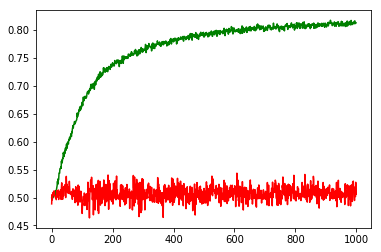

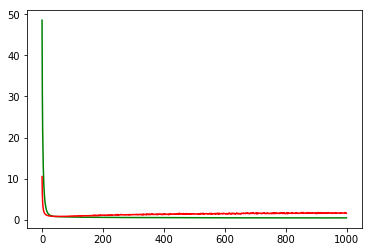

working on d,u and l,le 0.5 64 0.01 0.0001


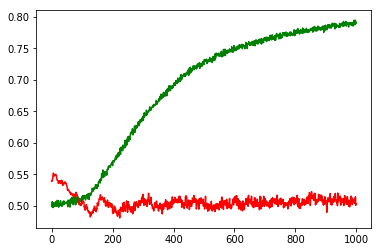

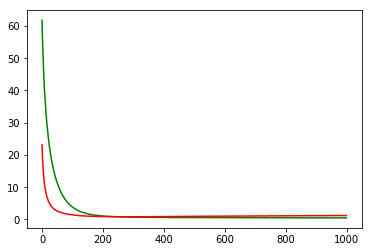

working on d,u and l,le 0.5 64 0.01 1e-05


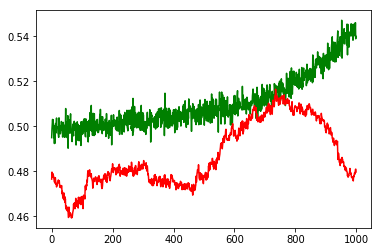

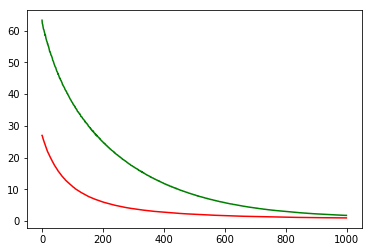

working on d,u and l,le 0.5 64 0.05 0.001


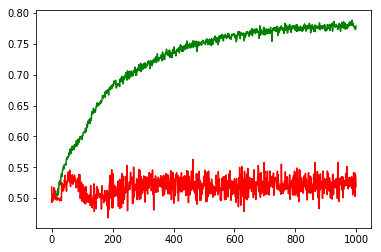

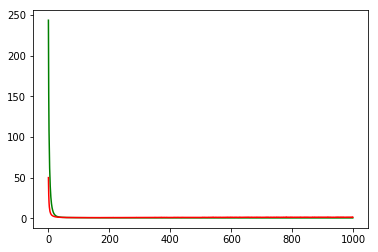

working on d,u and l,le 0.5 64 0.05 0.0001


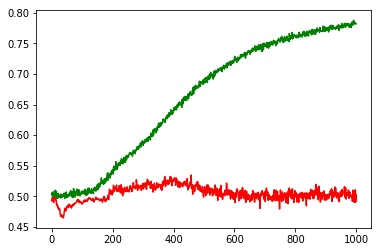

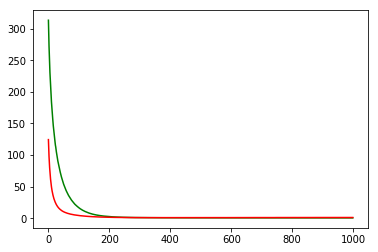

working on d,u and l,le 0.5 64 0.05 1e-05


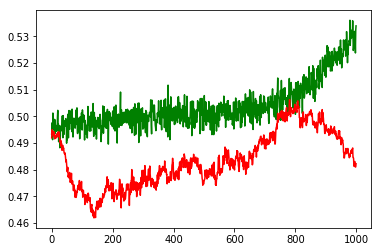

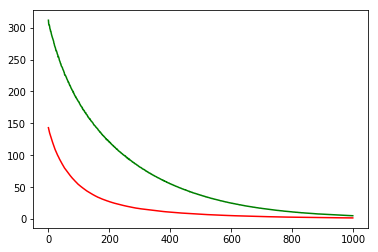

working on d,u and l,le 0.5 128 0.01 0.001


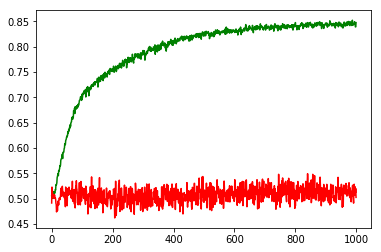

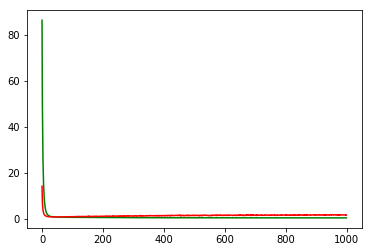

working on d,u and l,le 0.5 128 0.01 0.0001


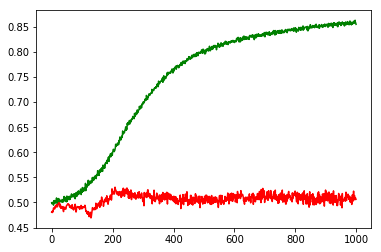

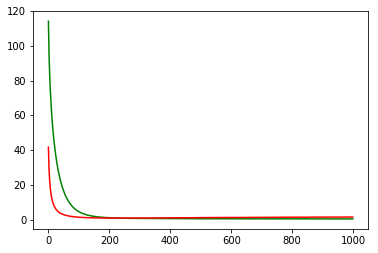

working on d,u and l,le 0.5 128 0.01 1e-05


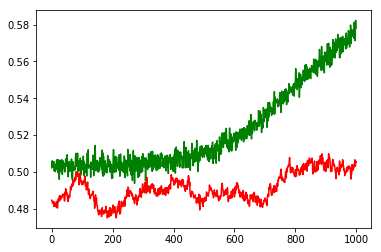

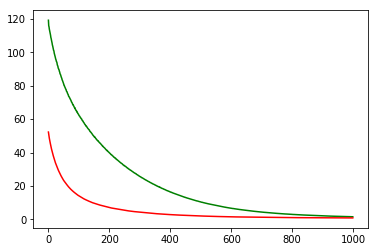

working on d,u and l,le 0.5 128 0.05 0.001


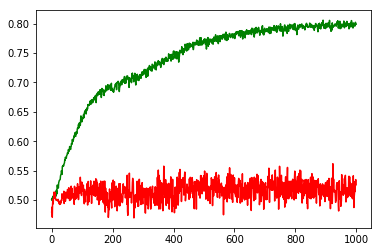

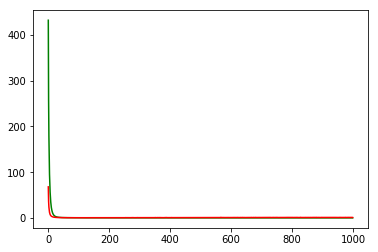

working on d,u and l,le 0.5 128 0.05 0.0001


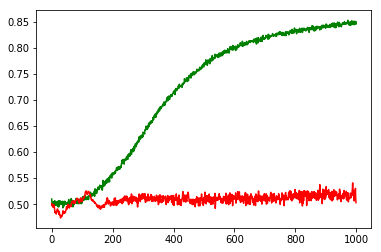

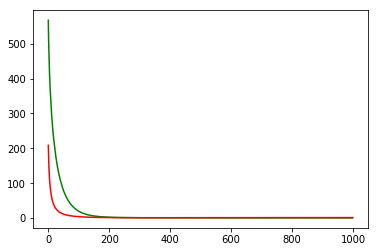

working on d,u and l,le 0.5 128 0.05 1e-05


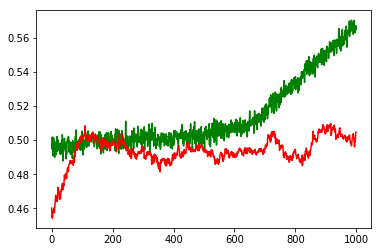

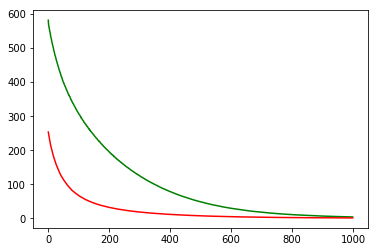

working on d,u and l,le 0.5 256 0.01 0.001


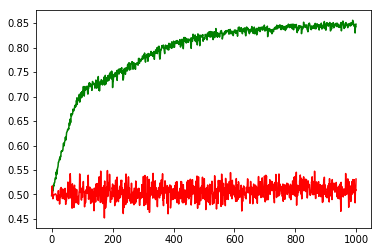

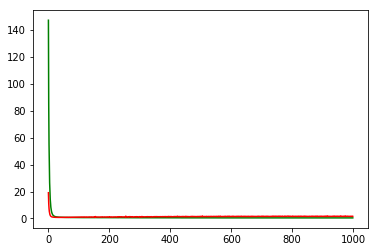

working on d,u and l,le 0.5 256 0.01 0.0001


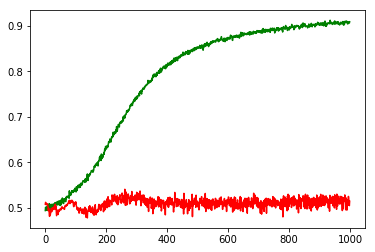

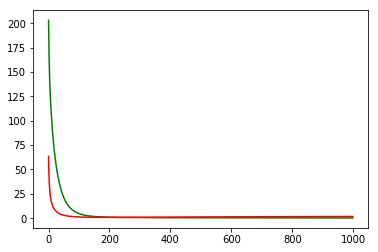

working on d,u and l,le 0.5 256 0.01 1e-05


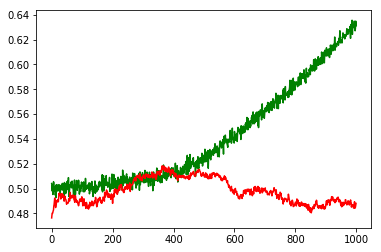

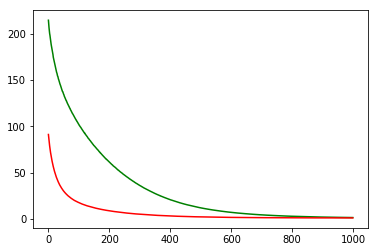

working on d,u and l,le 0.5 256 0.05 0.001


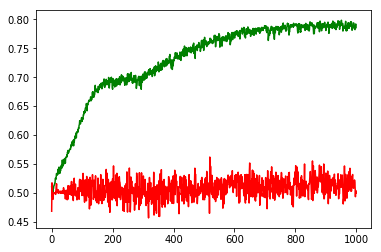

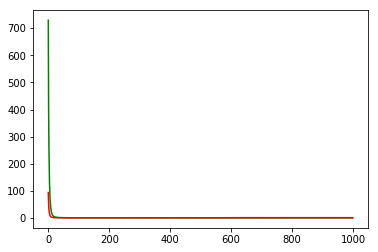

working on d,u and l,le 0.5 256 0.05 0.0001


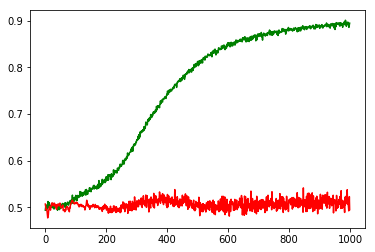

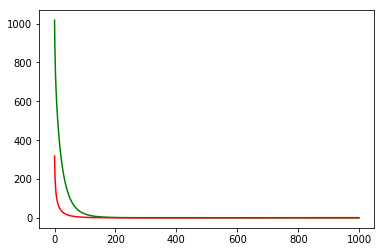

working on d,u and l,le 0.5 256 0.05 1e-05


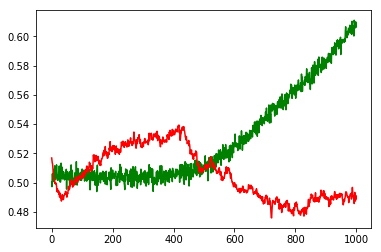

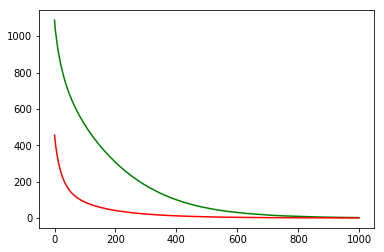

maxd,maxu,maxl,maxle: 0.5 128 0.05 0.001
Chart for BEST MODEL FOR: GOOGL


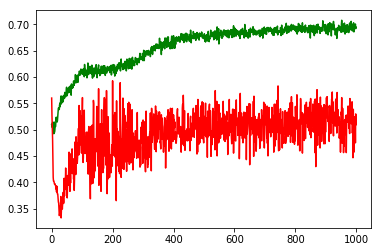

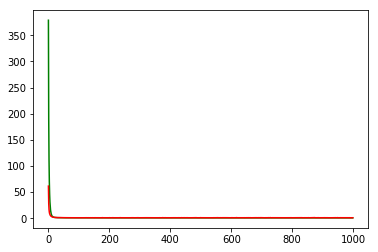

F1,score 0.5336700336700336
G-score: 0.5170373635702118
Accuracy 0.5097345127468615
Window: 140
[[259 196]
 [358 317]]
Vol pos 3.1116614209367537
Vol neg 2.792713554185685
Real Percentage of gain: 11.905551584312613
Percentage of gain: 0.21695014994752293
Total gain: 245.15366944070092
000000000000000000000000000000000000000000000000
Percentile:  0
[[112 120]
 [115  64]]
411/411 [==============================] - 0s 27us/step
[0.9697593923322766, 0.42822384558744964]
Percentile:  1
[[ 71  40]
 [101 151]]
363/363 [==============================] - 0s 37us/step
[0.71667736062662, 0.6115702480980845]
Percentile:  2
[[65 32]
 [75 34]]
206/206 [==============================] - 0s 34us/step
[1.0013398412361885, 0.4805825260079023]
Percentile:  3
[[10  4]
 [51 36]]
101/101 [==============================] - 0s 40us/step
[0.9484716323342653, 0.45544554455445546]
Percentile:  4
[[ 0  0]
 [15 32]]
47/47 [==============================] - 0s 72us/step
[0.5447938981208396, 0.6808510638297872]
000

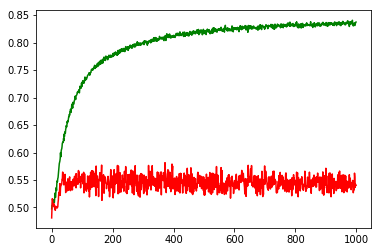

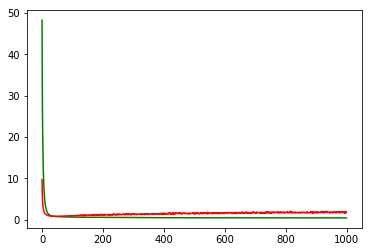

working on d,u and l,le 0.5 64 0.01 0.0001


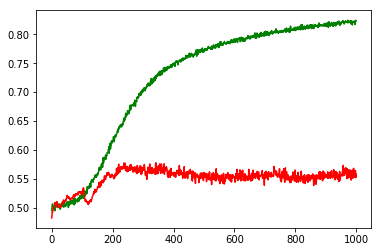

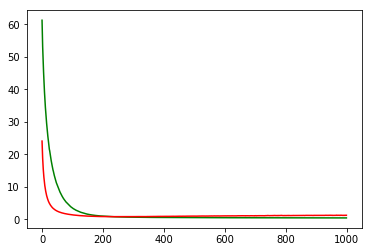

working on d,u and l,le 0.5 64 0.01 1e-05


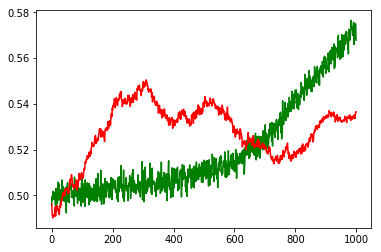

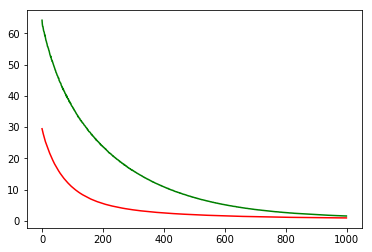

working on d,u and l,le 0.5 64 0.05 0.001


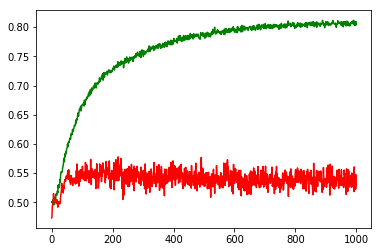

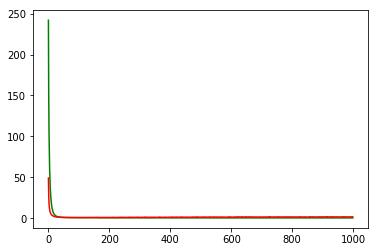

working on d,u and l,le 0.5 64 0.05 0.0001


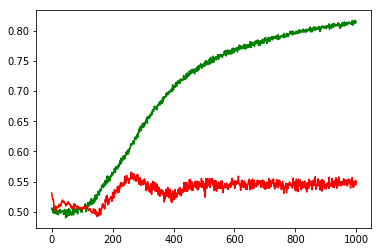

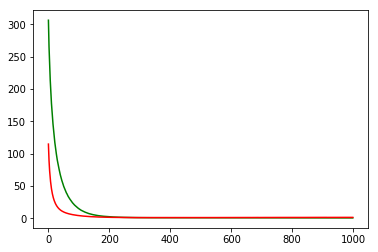

working on d,u and l,le 0.5 64 0.05 1e-05


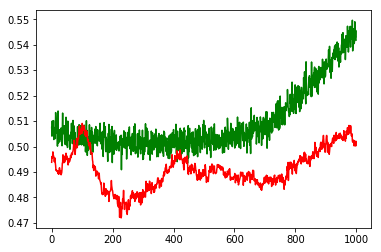

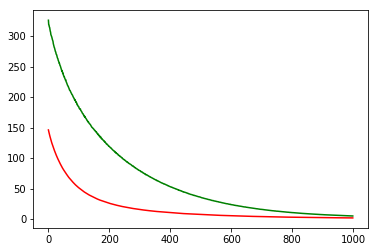

working on d,u and l,le 0.5 128 0.01 0.001


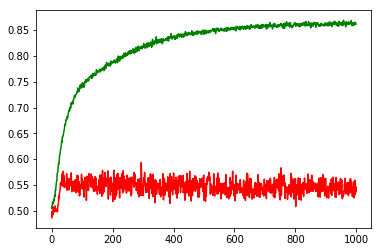

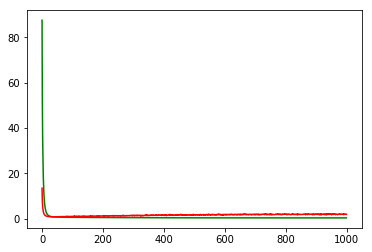

working on d,u and l,le 0.5 128 0.01 0.0001


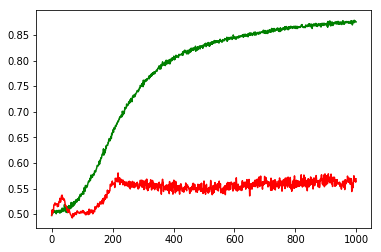

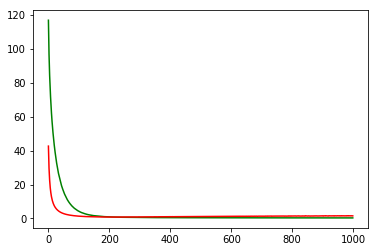

working on d,u and l,le 0.5 128 0.01 1e-05


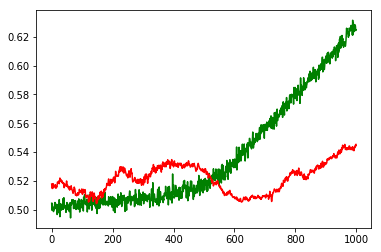

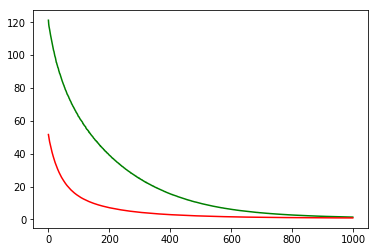

working on d,u and l,le 0.5 128 0.05 0.001


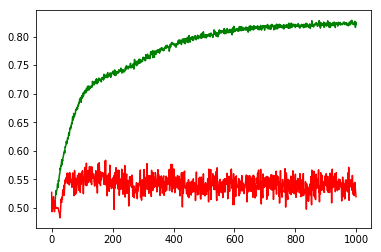

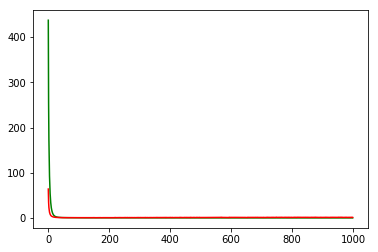

working on d,u and l,le 0.5 128 0.05 0.0001


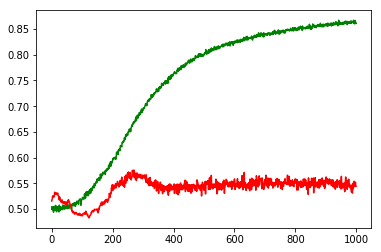

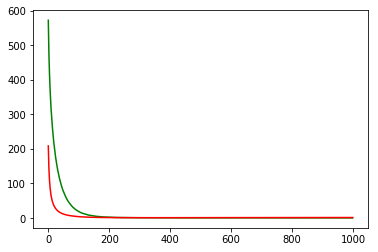

working on d,u and l,le 0.5 128 0.05 1e-05


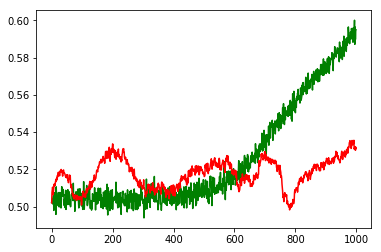

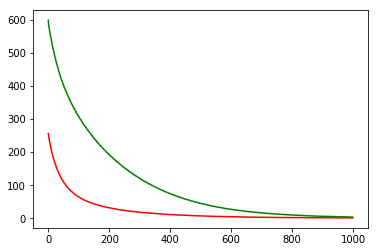

working on d,u and l,le 0.5 256 0.01 0.001


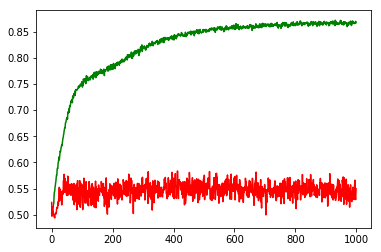

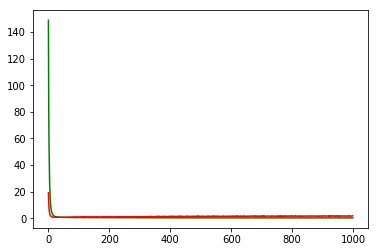

working on d,u and l,le 0.5 256 0.01 0.0001


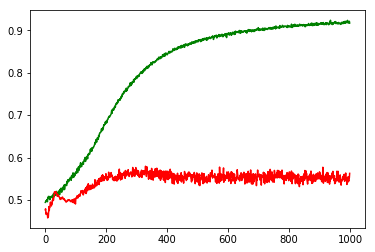

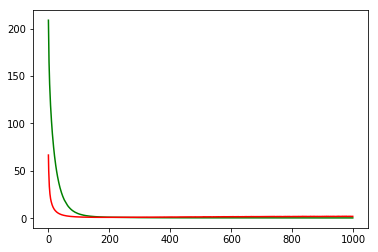

working on d,u and l,le 0.5 256 0.01 1e-05


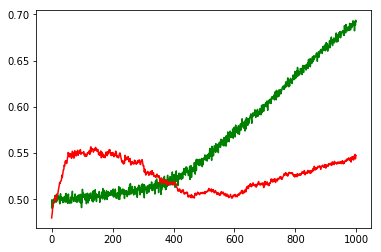

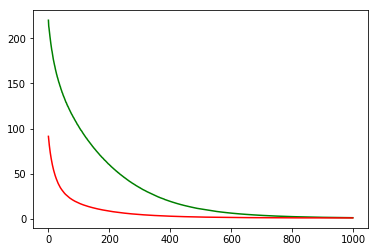

working on d,u and l,le 0.5 256 0.05 0.001


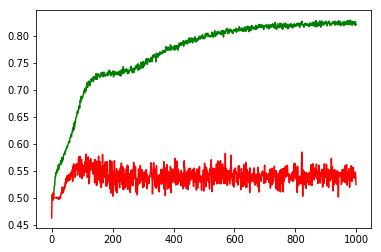

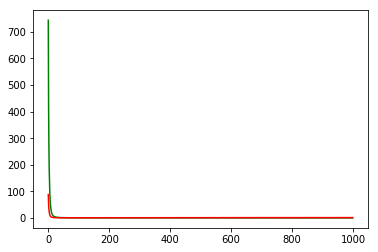

working on d,u and l,le 0.5 256 0.05 0.0001


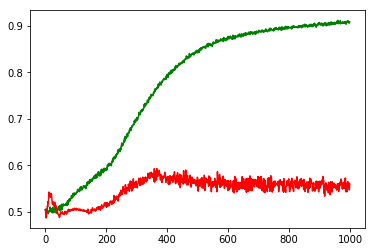

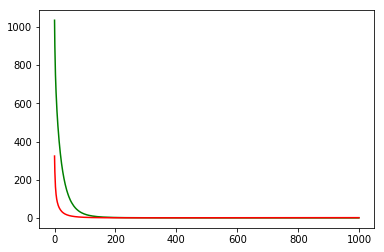

working on d,u and l,le 0.5 256 0.05 1e-05


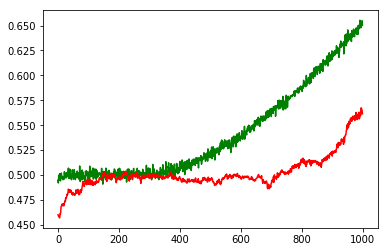

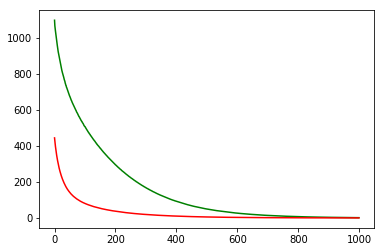

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.0001
Chart for BEST MODEL FOR: MSFT


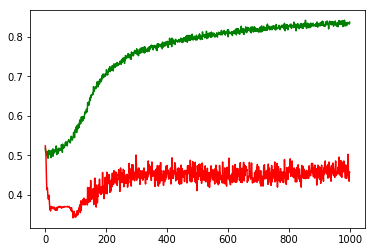

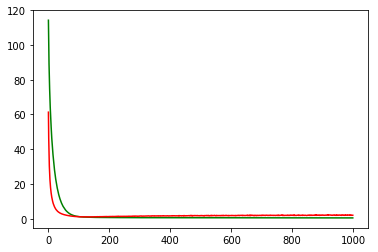

F1,score 0.5435591958302308
G-score: 0.43154532317478883
Accuracy 0.4575221233663306
Window: 140
[[152 267]
 [346 365]]
Vol pos 1.4704055047647795
Vol neg 1.6634173043045104
Real Percentage of gain: 5.217261053692306
Percentage of gain: -0.22962403679227777
Total gain: -259.4751615752739
000000000000000000000000000000000000000000000000
Percentile:  0
[[115 177]
 [106 146]]
544/544 [==============================] - 0s 28us/step
[1.8698993956341463, 0.4797794117647059]
Percentile:  1
[[ 25  49]
 [111 128]]
313/313 [==============================] - 0s 33us/step
[1.4176149703443242, 0.48881789051686614]
Percentile:  2
[[ 8 15]
 [85 55]]
163/163 [==============================] - 0s 38us/step
[1.6256944328729361, 0.38650306748466257]
Percentile:  3
[[ 3 17]
 [38 23]]
81/81 [==============================] - 0s 49us/step
[3.757879404374111, 0.32098765432098764]
Percentile:  4
[[ 1  9]
 [ 6 12]]
28/28 [==============================] - 0s 31us/step
[4.374042510986328, 0.4642857015132904]
00

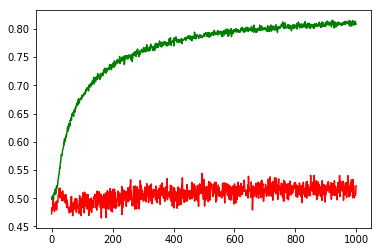

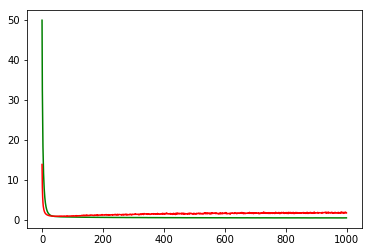

working on d,u and l,le 0.5 64 0.01 0.0001


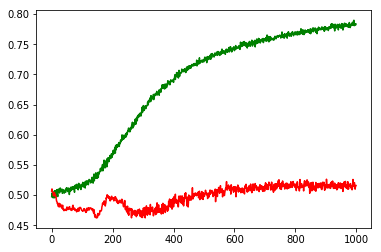

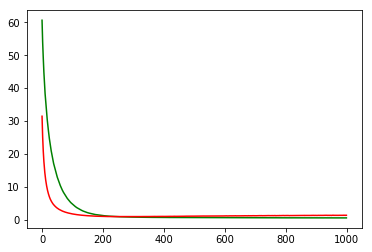

working on d,u and l,le 0.5 64 0.01 1e-05


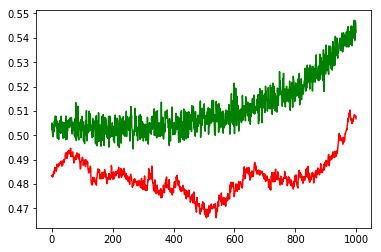

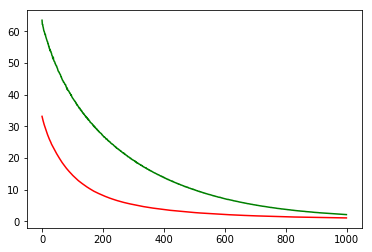

working on d,u and l,le 0.5 64 0.05 0.001


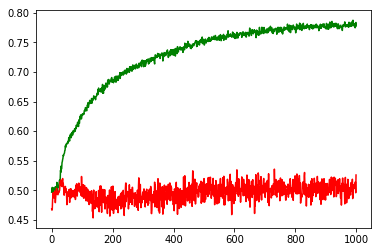

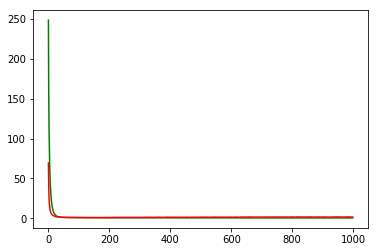

working on d,u and l,le 0.5 64 0.05 0.0001


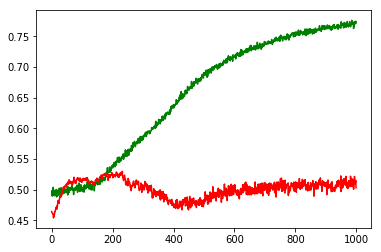

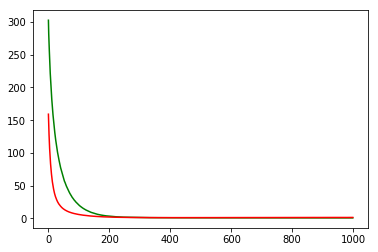

working on d,u and l,le 0.5 64 0.05 1e-05


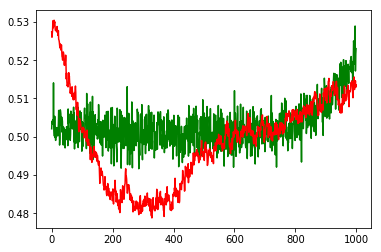

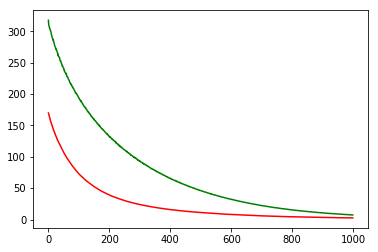

working on d,u and l,le 0.5 128 0.01 0.001


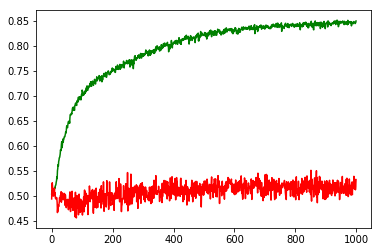

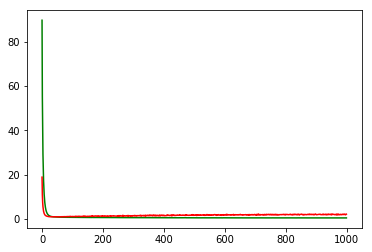

working on d,u and l,le 0.5 128 0.01 0.0001


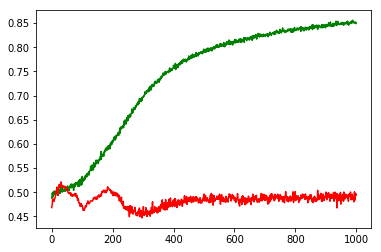

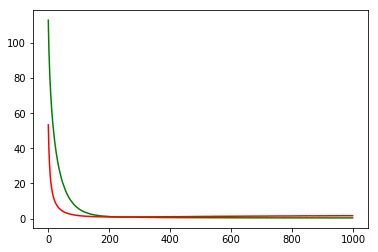

working on d,u and l,le 0.5 128 0.01 1e-05


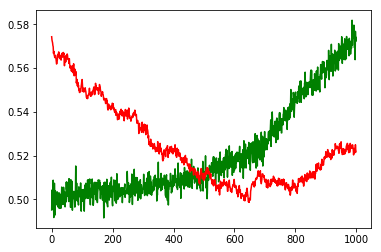

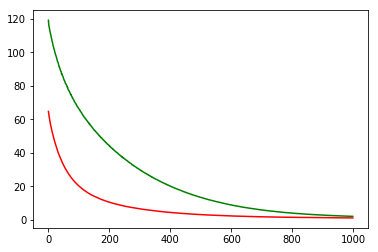

working on d,u and l,le 0.5 128 0.05 0.001


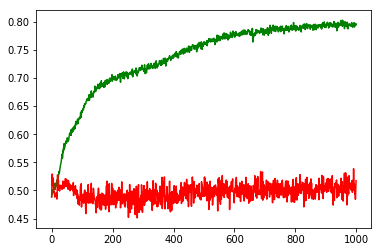

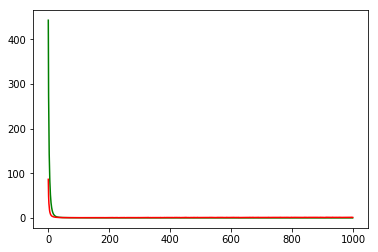

working on d,u and l,le 0.5 128 0.05 0.0001


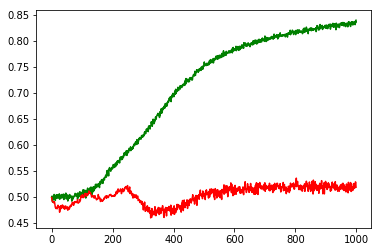

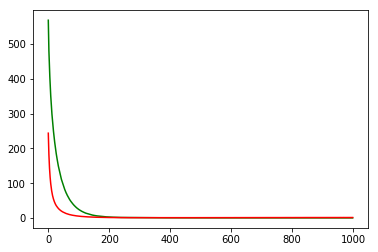

working on d,u and l,le 0.5 128 0.05 1e-05


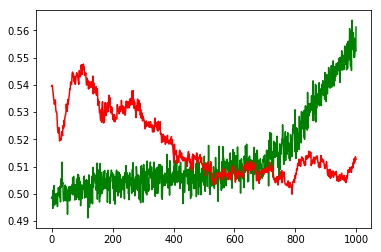

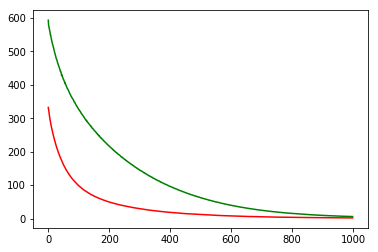

working on d,u and l,le 0.5 256 0.01 0.001


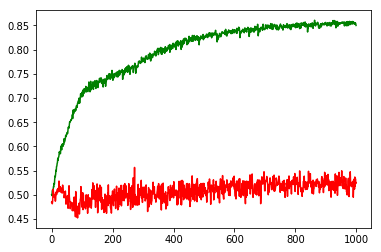

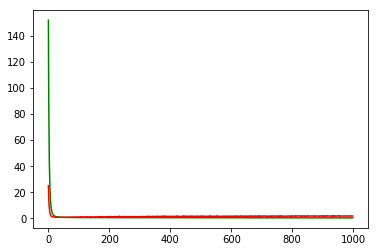

working on d,u and l,le 0.5 256 0.01 0.0001


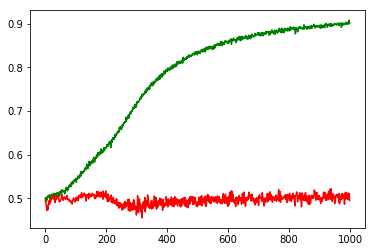

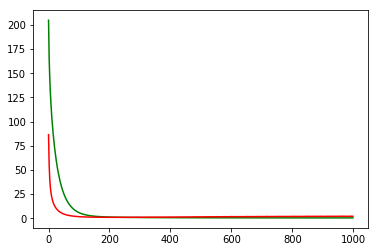

working on d,u and l,le 0.5 256 0.01 1e-05


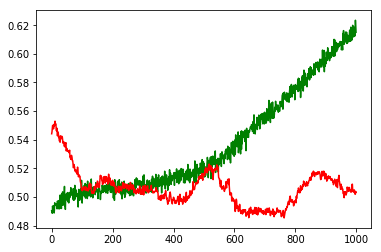

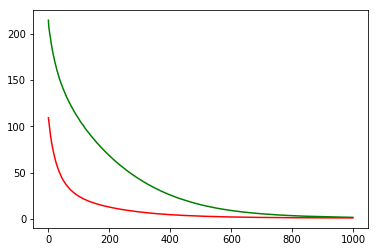

working on d,u and l,le 0.5 256 0.05 0.001


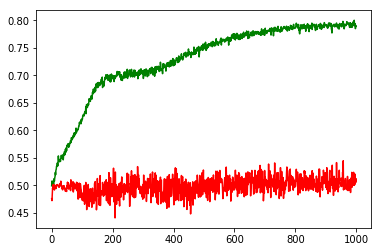

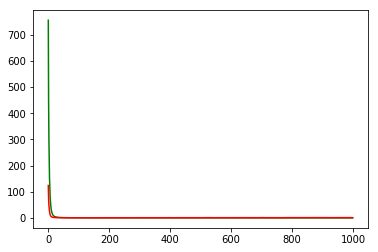

working on d,u and l,le 0.5 256 0.05 0.0001


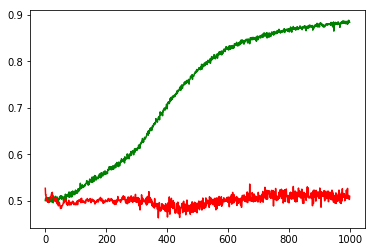

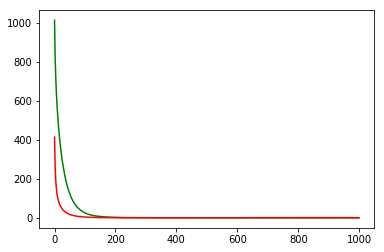

working on d,u and l,le 0.5 256 0.05 1e-05


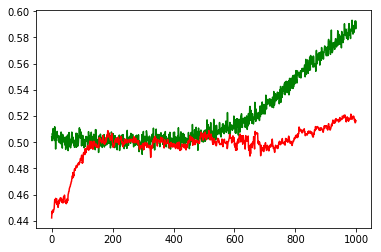

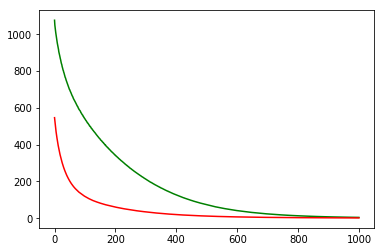

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: FB


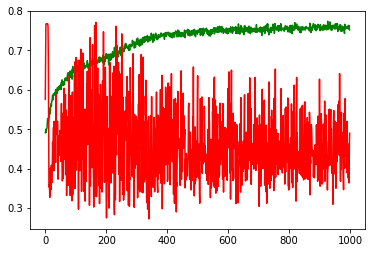

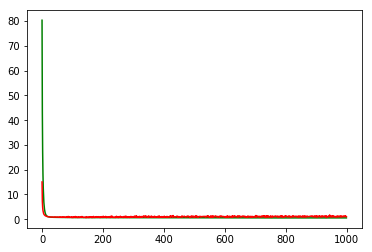

F1,score 0.5833935018050542
G-score: 0.5166440043054602
Accuracy 0.4902826861442188
Window: 140
[[151 112]
 [465 404]]
Vol pos 2.960037547057433
Vol neg 3.190816916745321
Real Percentage of gain: 7.373089591157625
Percentage of gain: -0.17515947203637355
Total gain: -198.28052234517486
000000000000000000000000000000000000000000000000
Percentile:  0
[[116  96]
 [167 143]]
522/522 [==============================] - 0s 55us/step
[1.0788808289158847, 0.49616858248966406]
Percentile:  1
[[ 25  12]
 [211 220]]
468/468 [==============================] - 0s 27us/step
[0.7981789866064348, 0.5235042740137149]
Percentile:  2
[[ 9  4]
 [62 30]]
105/105 [==============================] - 0s 67us/step
[1.003511217094603, 0.37142857171240307]
Percentile:  3
[[0 0]
 [8 6]]
14/14 [==============================] - 0s 88us/step
[0.7872604131698608, 0.4285714328289032]
Percentile:  4
[[ 0  0]
 [16  5]]
21/21 [==============================] - 0s 39us/step
[1.044836401939392, 0.2380952388048172]
000000000

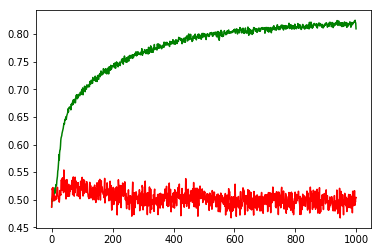

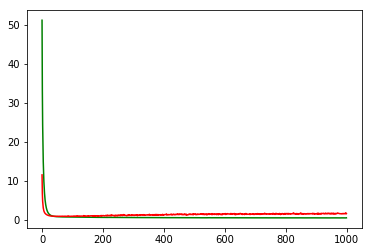

working on d,u and l,le 0.5 64 0.01 0.0001


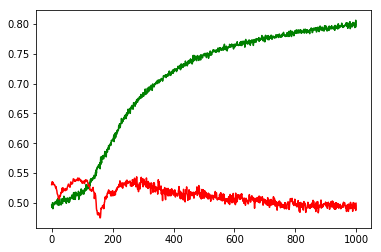

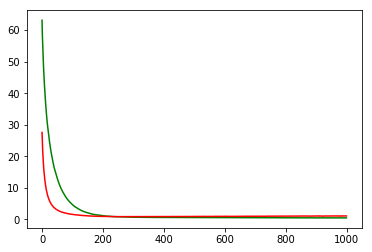

working on d,u and l,le 0.5 64 0.01 1e-05


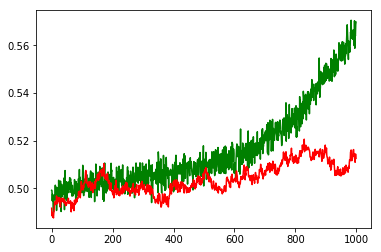

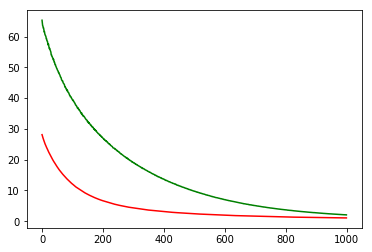

working on d,u and l,le 0.5 64 0.05 0.001


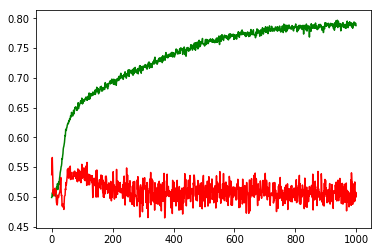

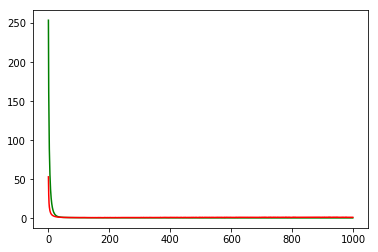

working on d,u and l,le 0.5 64 0.05 0.0001


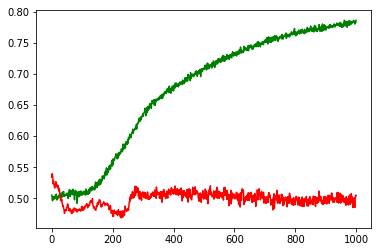

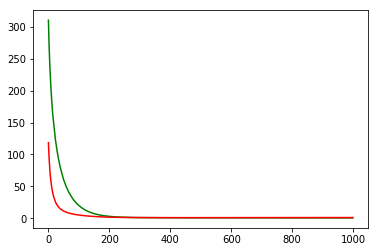

working on d,u and l,le 0.5 64 0.05 1e-05


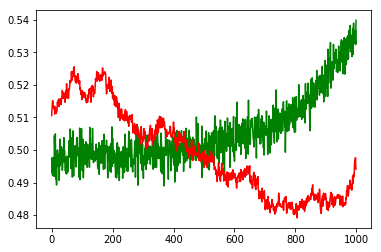

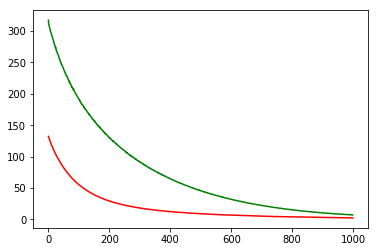

working on d,u and l,le 0.5 128 0.01 0.001


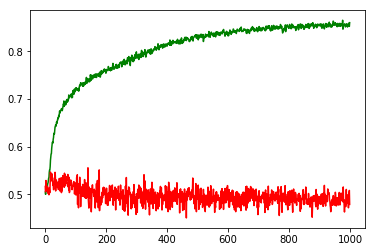

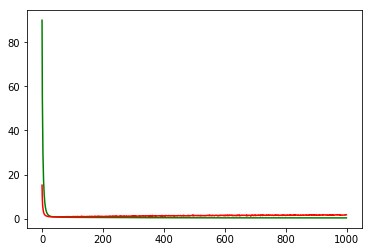

working on d,u and l,le 0.5 128 0.01 0.0001


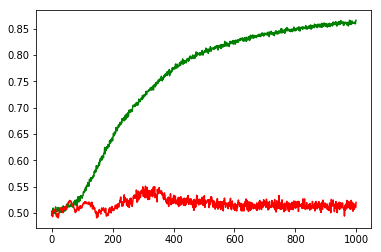

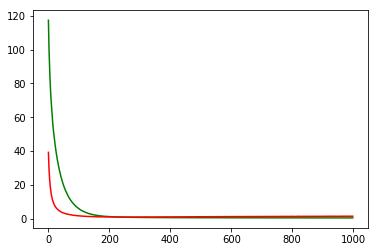

working on d,u and l,le 0.5 128 0.01 1e-05


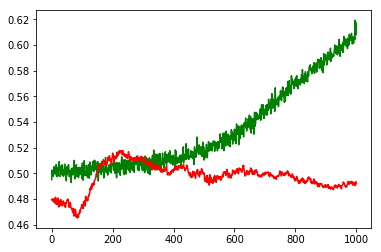

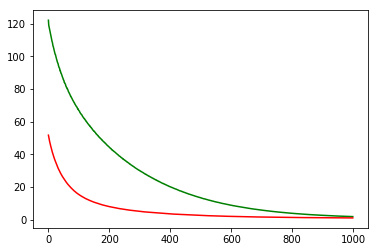

working on d,u and l,le 0.5 128 0.05 0.001


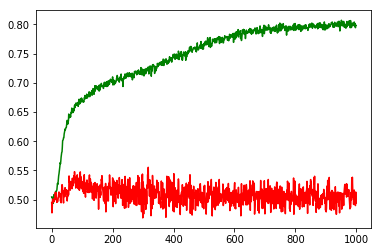

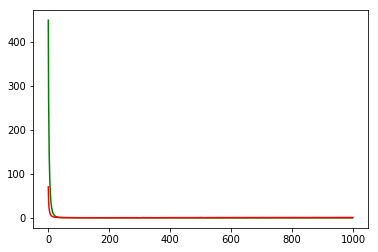

working on d,u and l,le 0.5 128 0.05 0.0001


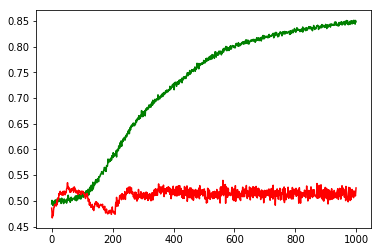

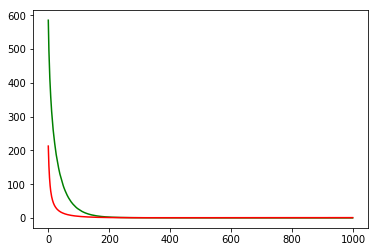

working on d,u and l,le 0.5 128 0.05 1e-05


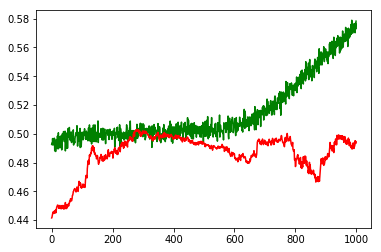

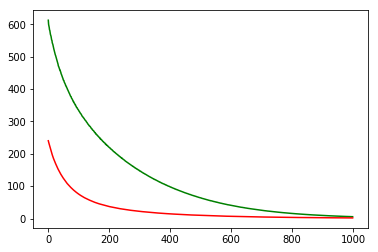

working on d,u and l,le 0.5 256 0.01 0.001


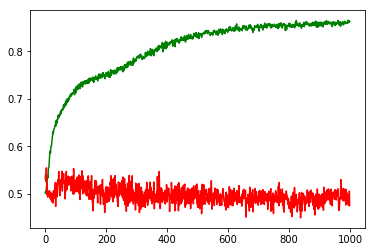

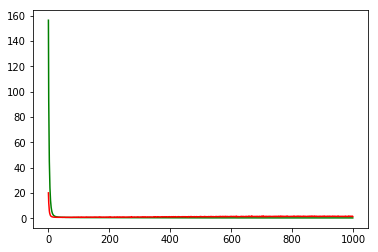

working on d,u and l,le 0.5 256 0.01 0.0001


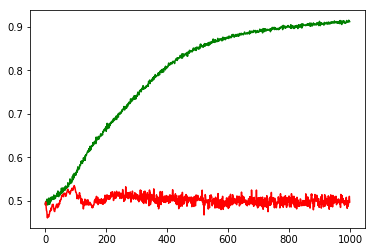

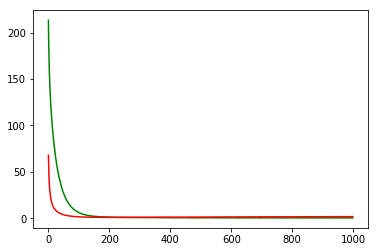

working on d,u and l,le 0.5 256 0.01 1e-05


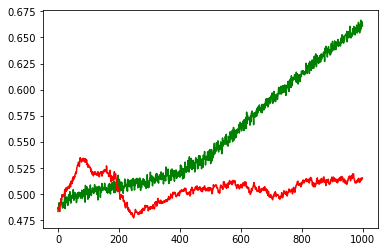

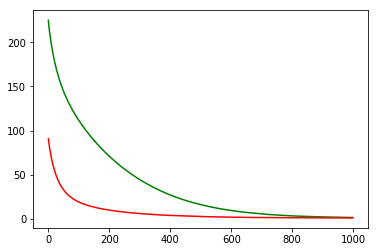

working on d,u and l,le 0.5 256 0.05 0.001


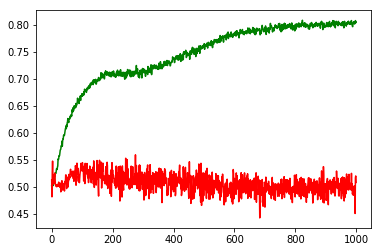

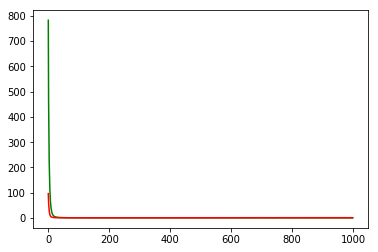

working on d,u and l,le 0.5 256 0.05 0.0001


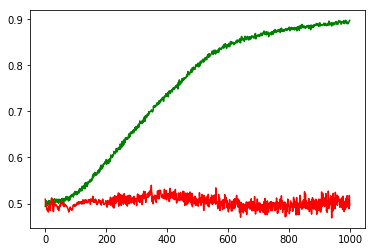

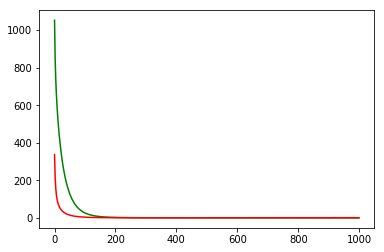

working on d,u and l,le 0.5 256 0.05 1e-05


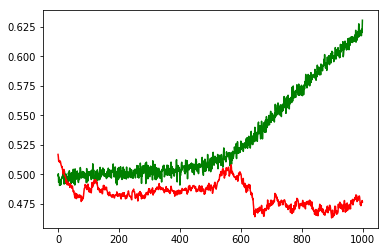

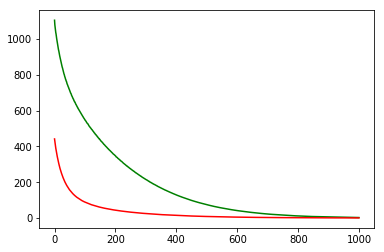

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.0001
Chart for BEST MODEL FOR: INTC


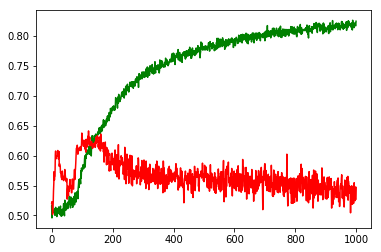

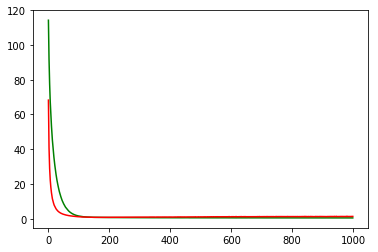

F1,score 0.5974416854778029
G-score: 0.5090297829858123
Accuracy 0.5273851590106007
Window: 140
[[200 248]
 [287 397]]
Vol pos 2.3937760909289
Vol neg 2.259631448764366
Real Percentage of gain: 19.65767025313067
Percentage of gain: 0.19450662649789538
Total gain: 220.18150119561756
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 58  58]
 [117 121]]
354/354 [==============================] - 0s 28us/step
[1.5174640976103013, 0.5056497175141242]
Percentile:  1
[[ 47  67]
 [ 87 141]]
342/342 [==============================] - 0s 29us/step
[1.0380307962322792, 0.5497076023391813]
Percentile:  2
[[49 78]
 [60 91]]
278/278 [==============================] - 0s 25us/step
[1.1361765878663646, 0.5035971231597791]
Percentile:  3
[[25 38]
 [15 36]]
114/114 [==============================] - 0s 50us/step
[1.2765570920810365, 0.5350877234810277]
Percentile:  4
[[21  7]
 [ 8  6]]
42/42 [==============================] - 0s 94us/step
[1.3894351522127788, 0.6428571485337757]
0000000

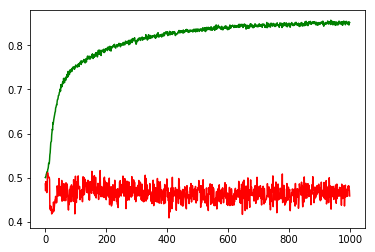

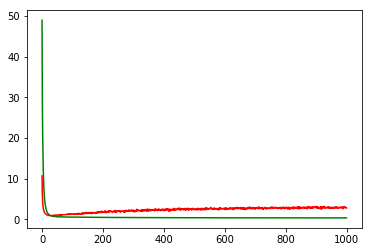

working on d,u and l,le 0.5 64 0.01 0.0001


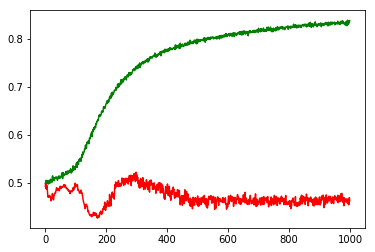

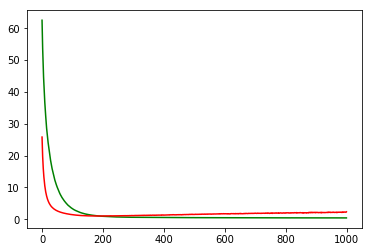

working on d,u and l,le 0.5 64 0.01 1e-05


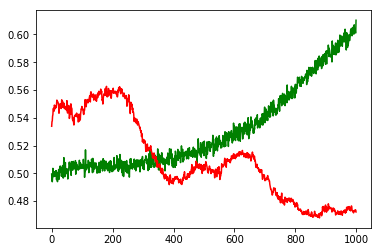

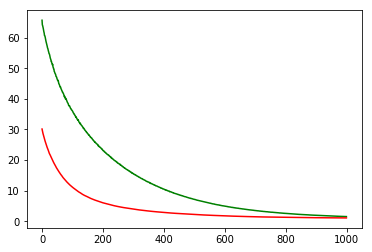

working on d,u and l,le 0.5 64 0.05 0.001


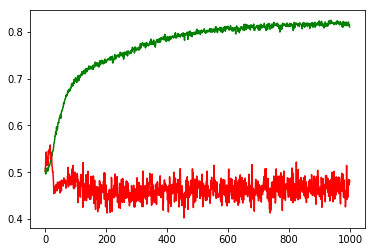

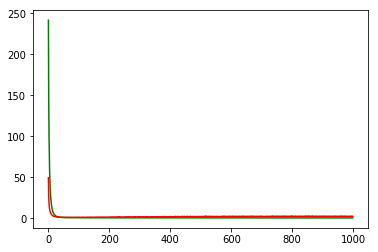

working on d,u and l,le 0.5 64 0.05 0.0001


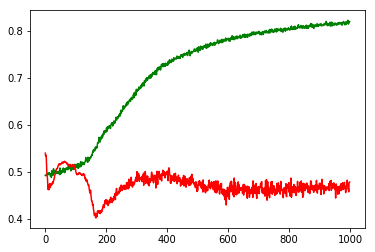

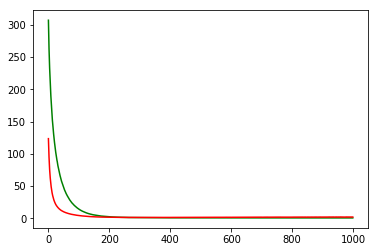

working on d,u and l,le 0.5 64 0.05 1e-05


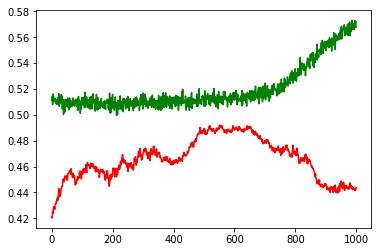

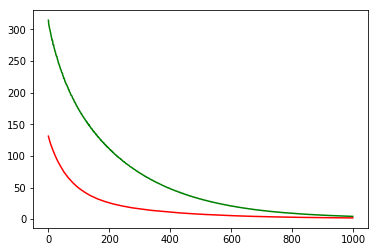

working on d,u and l,le 0.5 128 0.01 0.001


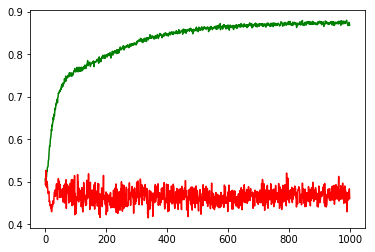

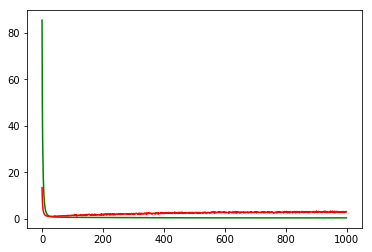

working on d,u and l,le 0.5 128 0.01 0.0001


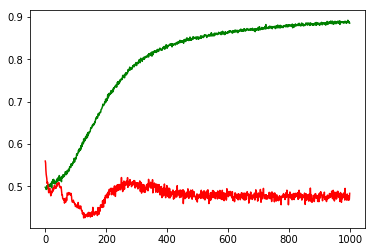

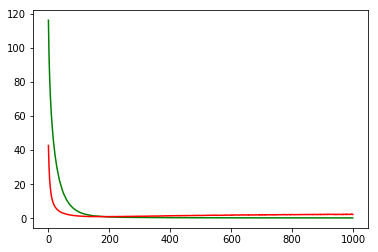

working on d,u and l,le 0.5 128 0.01 1e-05


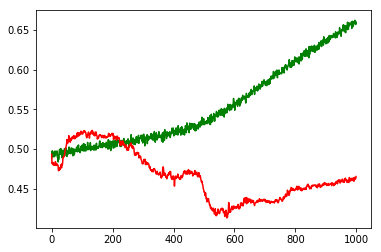

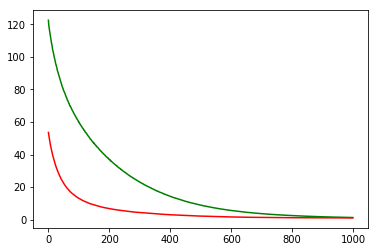

working on d,u and l,le 0.5 128 0.05 0.001


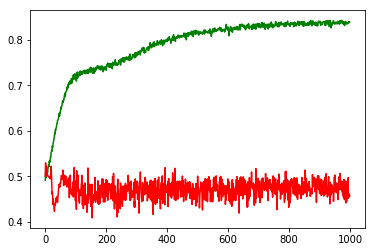

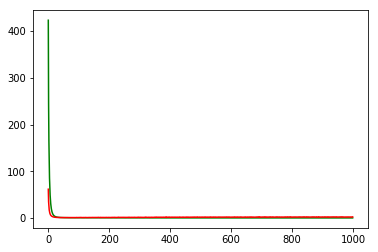

working on d,u and l,le 0.5 128 0.05 0.0001


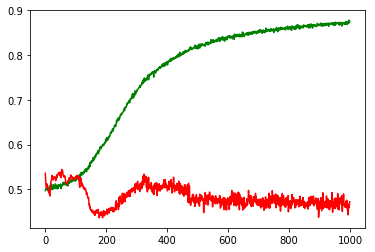

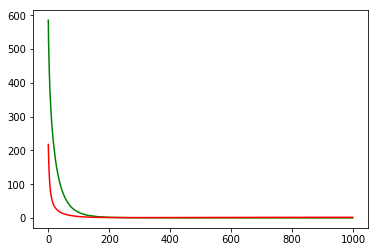

working on d,u and l,le 0.5 128 0.05 1e-05


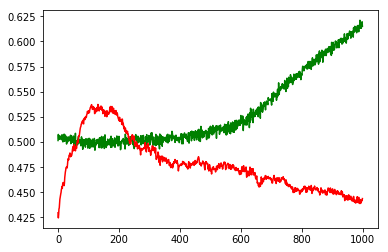

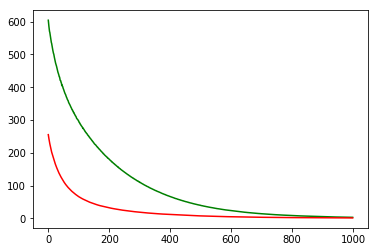

working on d,u and l,le 0.5 256 0.01 0.001


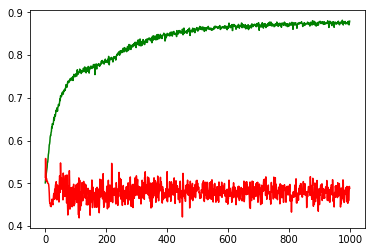

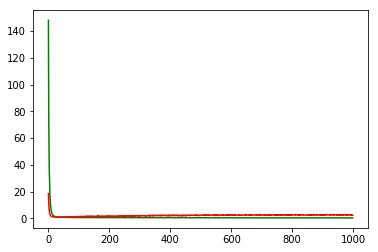

working on d,u and l,le 0.5 256 0.01 0.0001


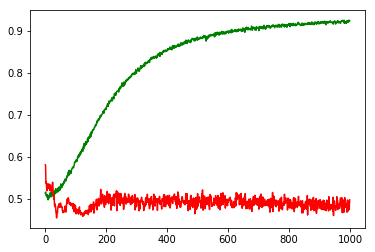

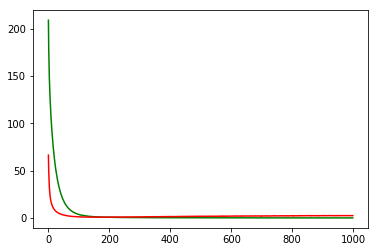

working on d,u and l,le 0.5 256 0.01 1e-05


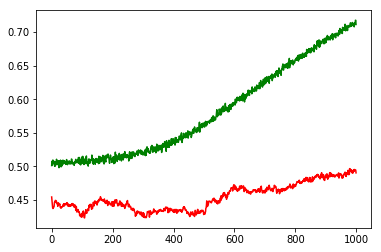

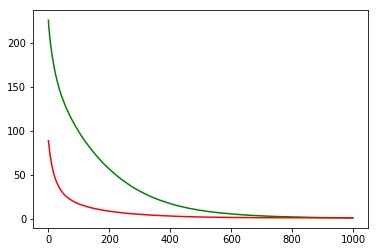

working on d,u and l,le 0.5 256 0.05 0.001


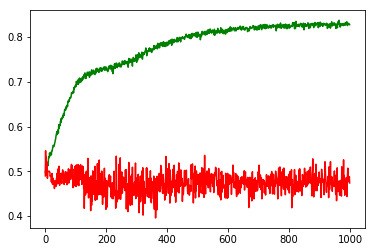

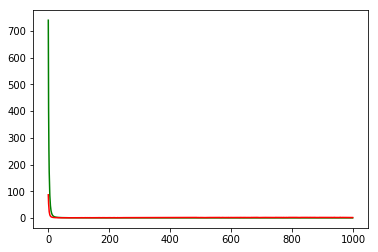

working on d,u and l,le 0.5 256 0.05 0.0001


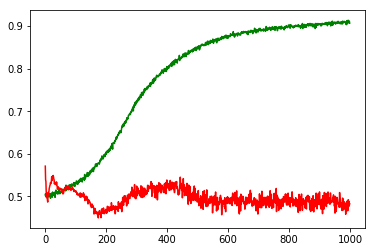

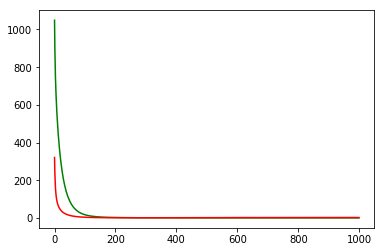

working on d,u and l,le 0.5 256 0.05 1e-05


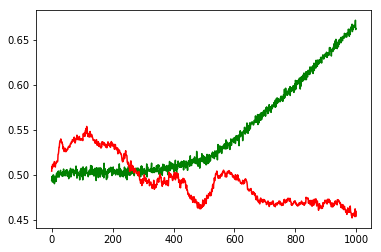

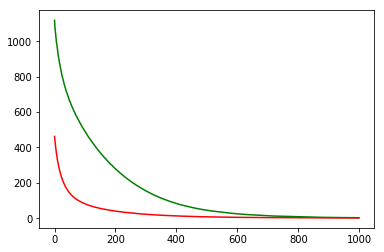

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.0001
Chart for BEST MODEL FOR: CSCO


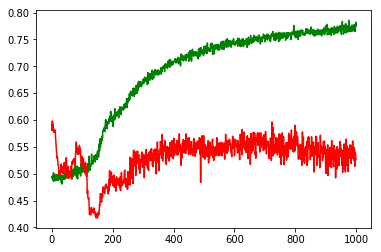

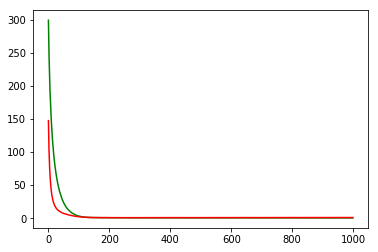

F1,score 0.5786561264822134
G-score: 0.5173066601195891
Accuracy 0.5262222237057156
Window: 140
[[226 251]
 [282 366]]
Vol pos 1.9130675254617768
Vol neg 1.762251484235407
Real Percentage of gain: 24.63366025399214
Percentage of gain: 0.17178305242302222
Total gain: 193.2559339759
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 92 128]
 [144 152]]
516/516 [==============================] - 0s 26us/step
[1.322599730750387, 0.4728682170542636]
Percentile:  1
[[ 49  47]
 [ 89 138]]
323/323 [==============================] - 0s 26us/step
[0.7927409266539771, 0.5789473684210527]
Percentile:  2
[[25 25]
 [29 59]]
138/138 [==============================] - 0s 47us/step
[0.6551416749539583, 0.6086956526058308]
Percentile:  3
[[46 12]
 [12 16]]
86/86 [==============================] - 0s 31us/step
[0.5452007450336633, 0.7209302325581395]
Percentile:  4
[[14 38]
 [ 6  0]]
58/58 [==============================] - 0s 49us/step
[1.452283814035613, 0.24137931240016017]
00000000000

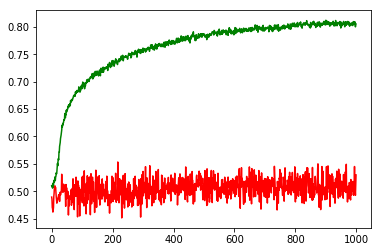

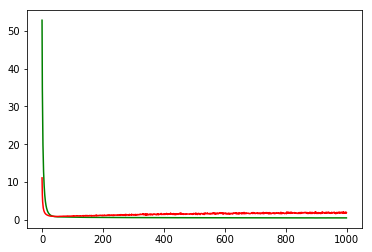

working on d,u and l,le 0.5 64 0.01 0.0001


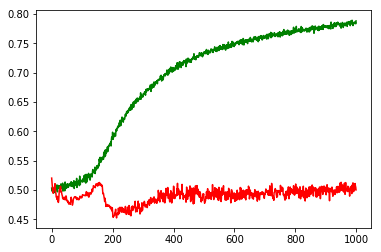

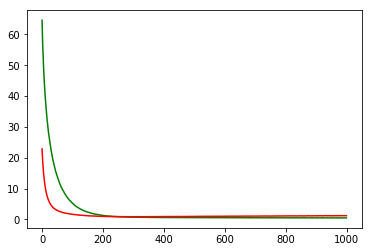

working on d,u and l,le 0.5 64 0.01 1e-05


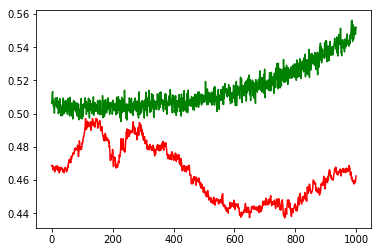

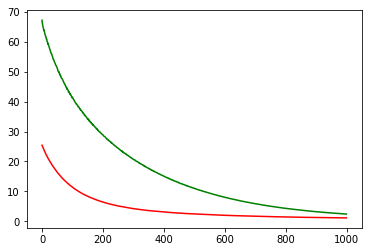

working on d,u and l,le 0.5 64 0.05 0.001


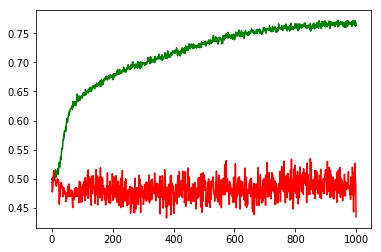

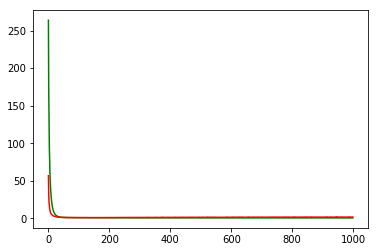

working on d,u and l,le 0.5 64 0.05 0.0001


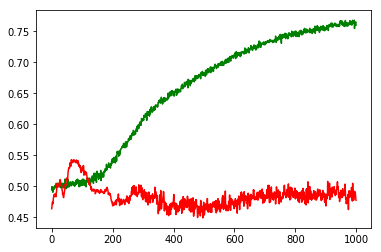

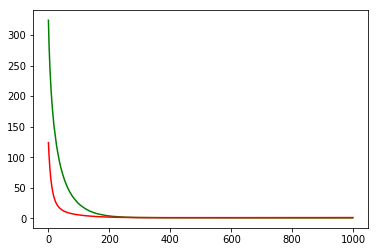

working on d,u and l,le 0.5 64 0.05 1e-05


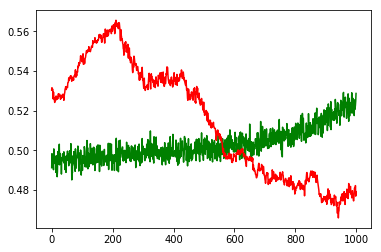

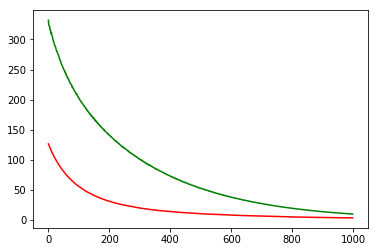

working on d,u and l,le 0.5 128 0.01 0.001


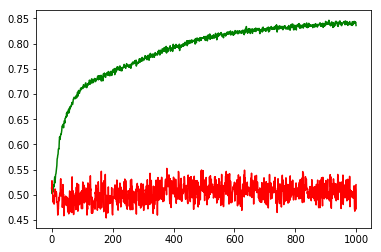

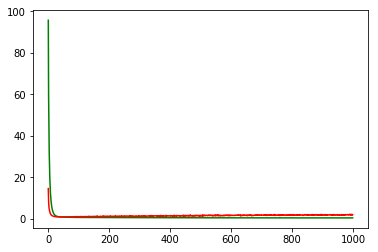

working on d,u and l,le 0.5 128 0.01 0.0001


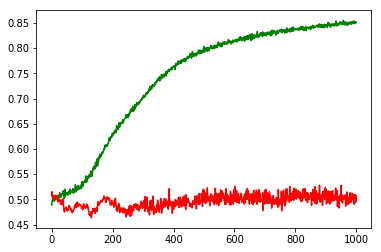

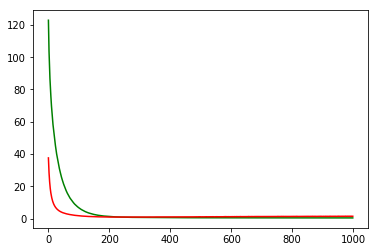

working on d,u and l,le 0.5 128 0.01 1e-05


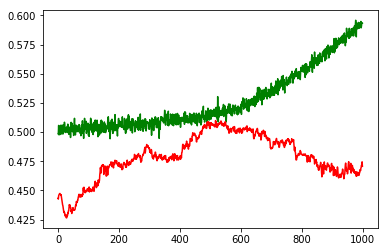

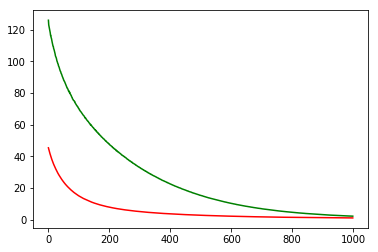

working on d,u and l,le 0.5 128 0.05 0.001


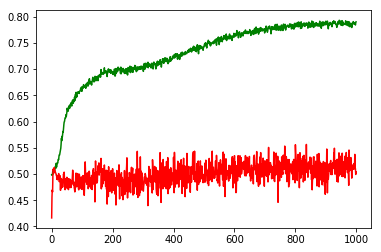

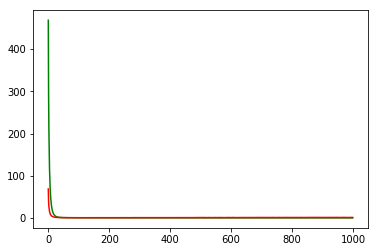

working on d,u and l,le 0.5 128 0.05 0.0001


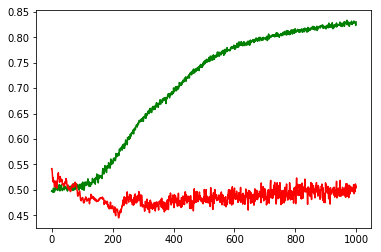

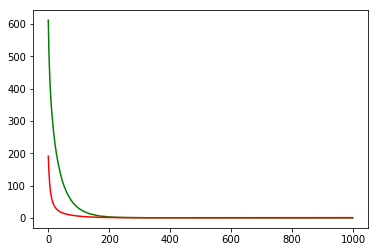

working on d,u and l,le 0.5 128 0.05 1e-05


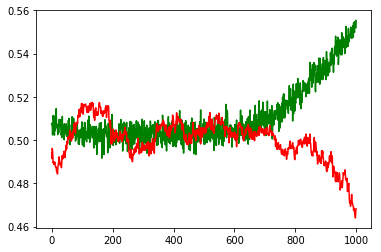

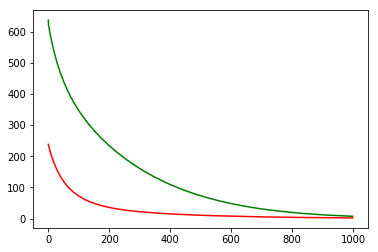

working on d,u and l,le 0.5 256 0.01 0.001


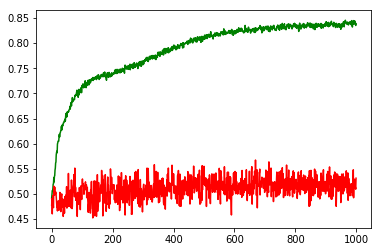

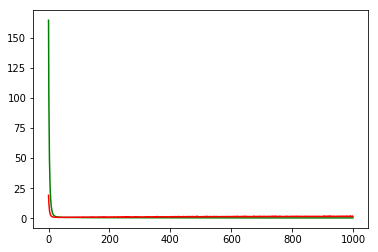

working on d,u and l,le 0.5 256 0.01 0.0001


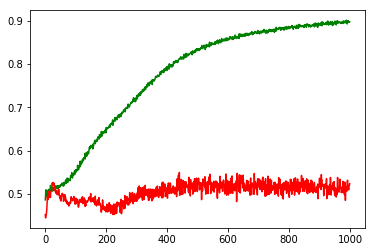

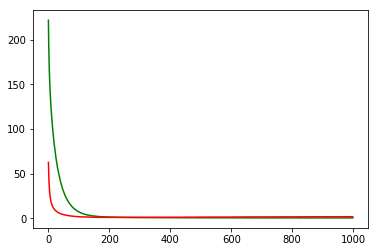

working on d,u and l,le 0.5 256 0.01 1e-05


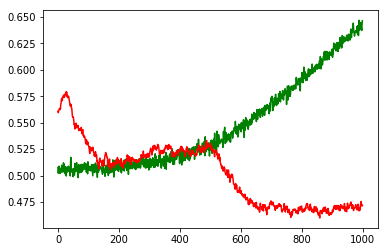

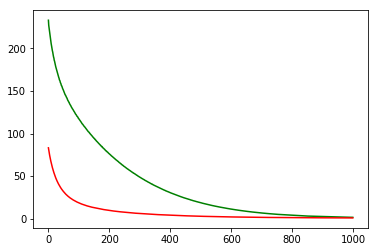

working on d,u and l,le 0.5 256 0.05 0.001


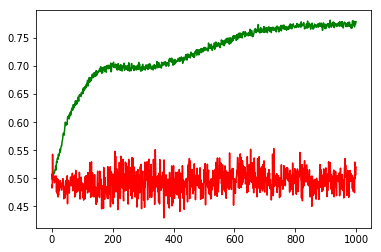

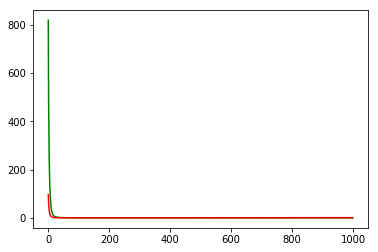

working on d,u and l,le 0.5 256 0.05 0.0001


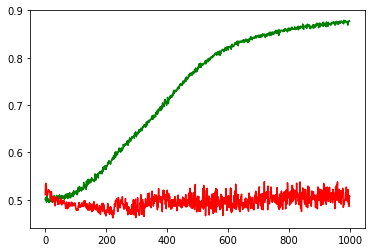

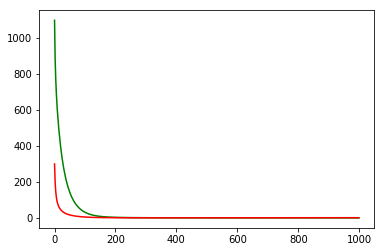

working on d,u and l,le 0.5 256 0.05 1e-05


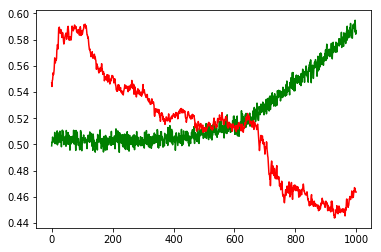

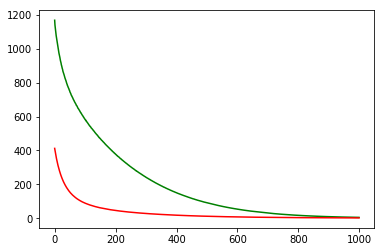

maxd,maxu,maxl,maxle: 0.5 256 0.01 0.001
Chart for BEST MODEL FOR: CMCSA


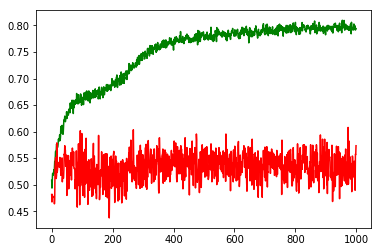

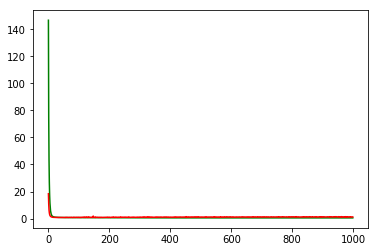

F1,score 0.5439093484419263
G-score: 0.570285213928281
Accuracy 0.5733215528747639
Window: 140
[[361 179]
 [304 288]]
Vol pos 2.7835237894509235
Vol neg 2.9556008133814373
Real Percentage of gain: 38.55069754062987
Percentage of gain: 0.33476302693499577
Total gain: 378.9517464904152
000000000000000000000000000000000000000000000000
Percentile:  0
[[160  67]
 [102  99]]
428/428 [==============================] - 0s 34us/step
[0.9291718228955135, 0.605140186358835]
Percentile:  1
[[124  73]
 [143 161]]
501/501 [==============================] - 0s 25us/step
[1.2631019898755347, 0.5688622765198439]
Percentile:  2
[[23 19]
 [51 23]]
116/116 [==============================] - 0s 33us/step
[1.6686482922784214, 0.39655172413793105]
Percentile:  3
[[41 19]
 [ 7  5]]
72/72 [==============================] - 0s 44us/step
[0.6802723540200127, 0.6388888888888888]
Percentile:  4
[[12  1]
 [ 0  0]]
13/13 [==============================] - 0s 48us/step
[0.15683503448963165, 0.9230769276618958]
000000

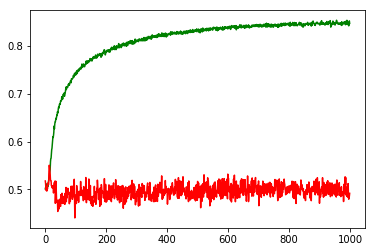

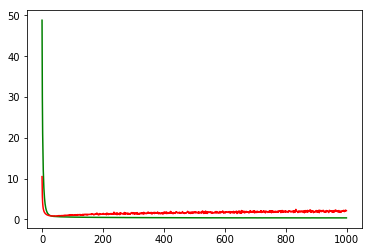

working on d,u and l,le 0.5 64 0.01 0.0001


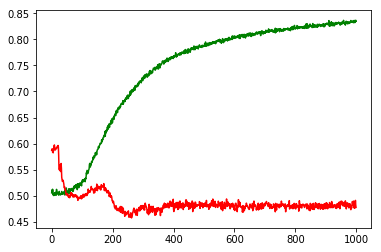

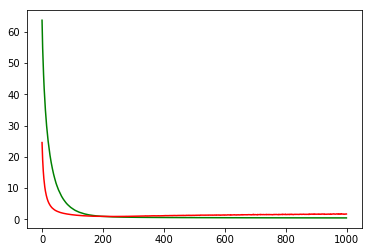

working on d,u and l,le 0.5 64 0.01 1e-05


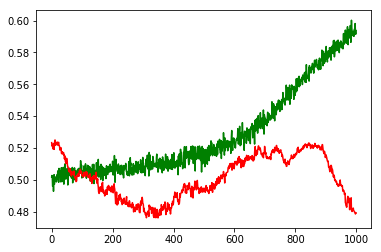

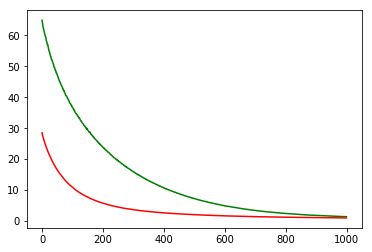

working on d,u and l,le 0.5 64 0.05 0.001


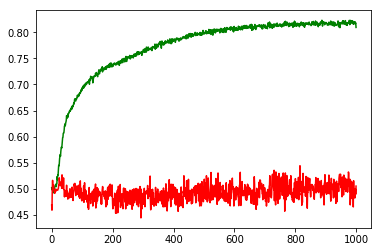

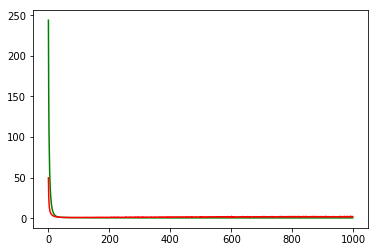

working on d,u and l,le 0.5 64 0.05 0.0001


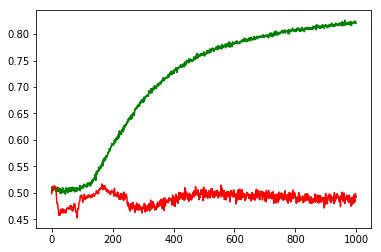

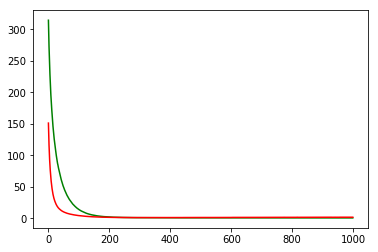

working on d,u and l,le 0.5 64 0.05 1e-05


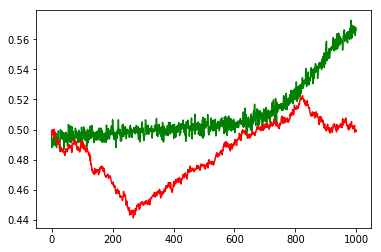

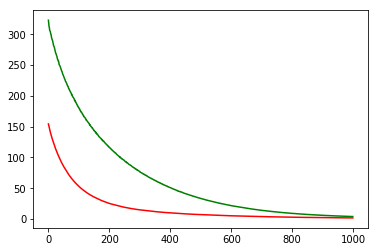

working on d,u and l,le 0.5 128 0.01 0.001


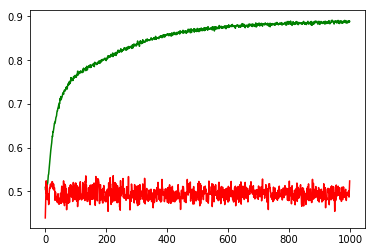

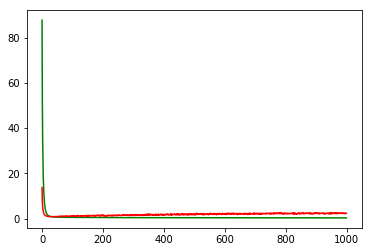

working on d,u and l,le 0.5 128 0.01 0.0001


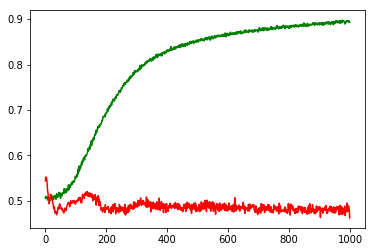

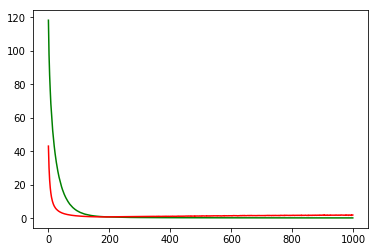

working on d,u and l,le 0.5 128 0.01 1e-05


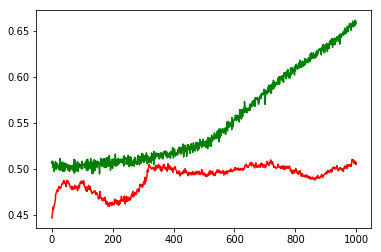

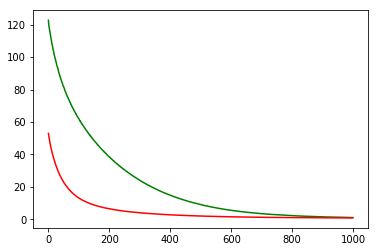

working on d,u and l,le 0.5 128 0.05 0.001


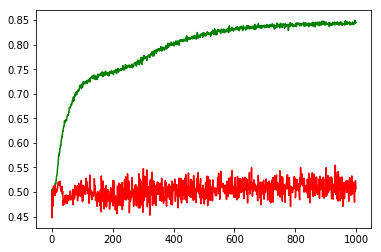

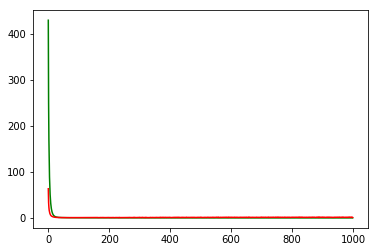

working on d,u and l,le 0.5 128 0.05 0.0001


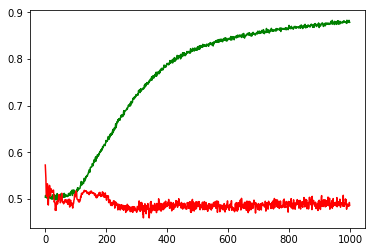

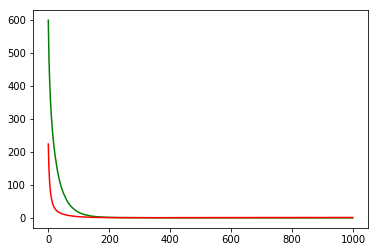

working on d,u and l,le 0.5 128 0.05 1e-05


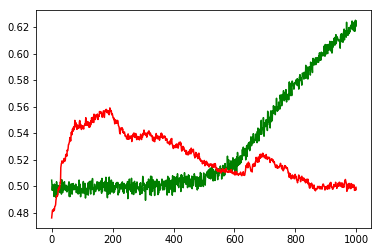

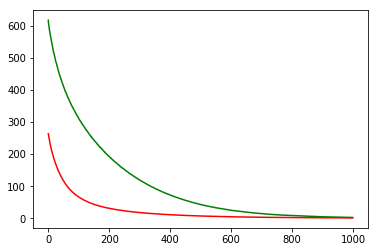

working on d,u and l,le 0.5 256 0.01 0.001


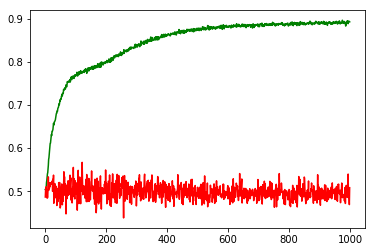

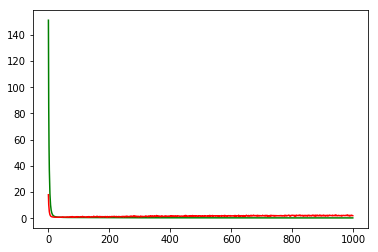

working on d,u and l,le 0.5 256 0.01 0.0001


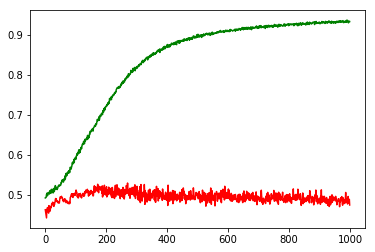

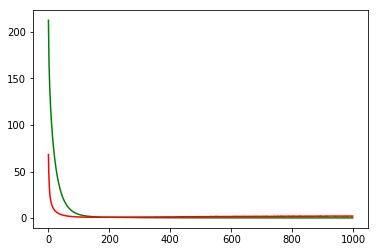

working on d,u and l,le 0.5 256 0.01 1e-05


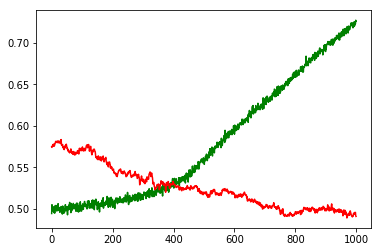

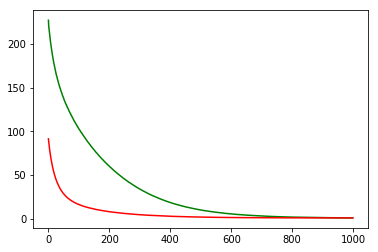

working on d,u and l,le 0.5 256 0.05 0.001


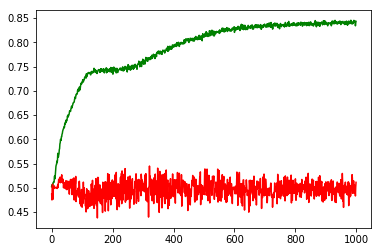

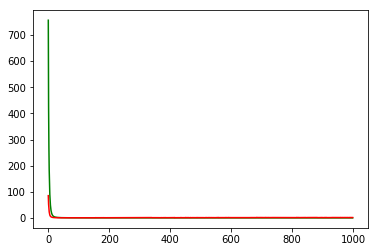

working on d,u and l,le 0.5 256 0.05 0.0001


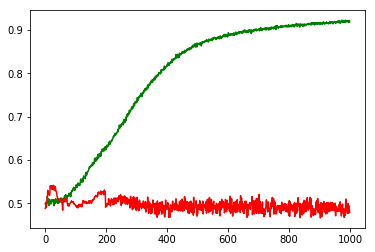

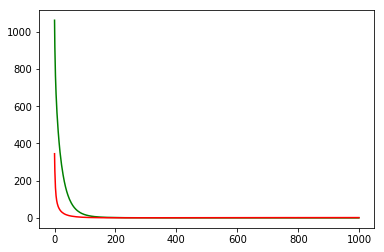

working on d,u and l,le 0.5 256 0.05 1e-05


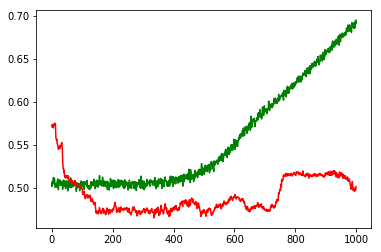

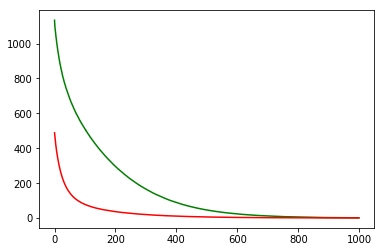

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: NVDA


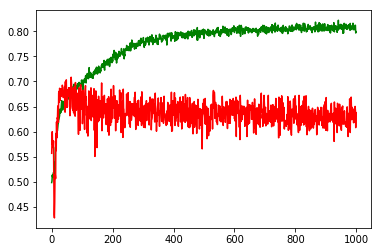

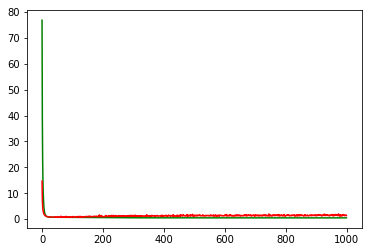

F1,score 0.6921921921921922
G-score: 0.6207479876346683
Accuracy 0.6378091883322375
Window: 140
[[261 215]
 [195 461]]
Vol pos 4.183450233699803
Vol neg 3.041266441892106
Real Percentage of gain: 300.25427210295146
Percentage of gain: 1.5667242292893064
Total gain: 1773.5318275554948
000000000000000000000000000000000000000000000000
Percentile:  0
[[157 156]
 [ 83 163]]
559/559 [==============================] - 0s 26us/step
[1.6466666752195955, 0.572450805088915]
Percentile:  1
[[ 77  40]
 [ 73 147]]
337/337 [==============================] - 0s 30us/step
[1.1373822703205867, 0.6646884275650058]
Percentile:  2
[[18 13]
 [11 61]]
103/103 [==============================] - 0s 46us/step
[0.5840026784001044, 0.7669902912621359]
Percentile:  3
[[ 9  6]
 [20 45]]
80/80 [==============================] - 0s 42us/step
[0.8122071504592896, 0.675]
Percentile:  4
[[ 0  0]
 [ 8 43]]
51/51 [==============================] - 0s 49us/step
[0.3071950118915707, 0.8431372549019608]
000000000000000000000

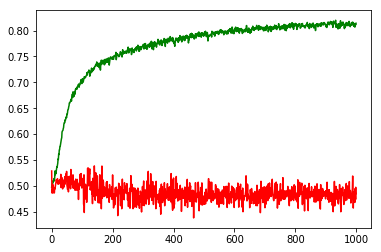

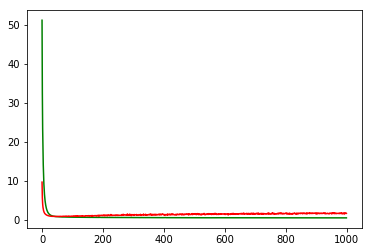

working on d,u and l,le 0.5 64 0.01 0.0001


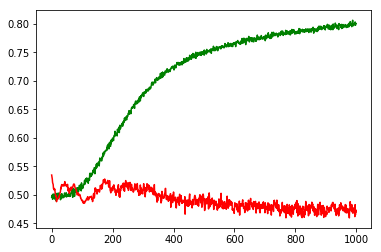

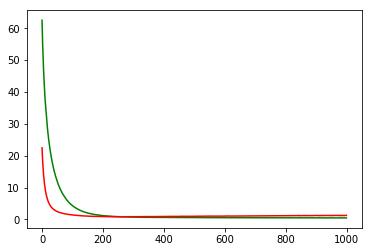

working on d,u and l,le 0.5 64 0.01 1e-05


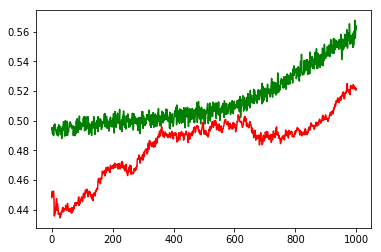

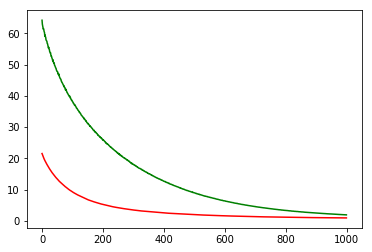

working on d,u and l,le 0.5 64 0.05 0.001


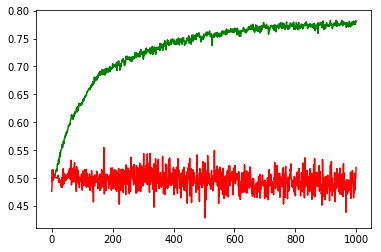

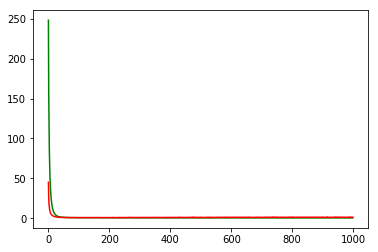

working on d,u and l,le 0.5 64 0.05 0.0001


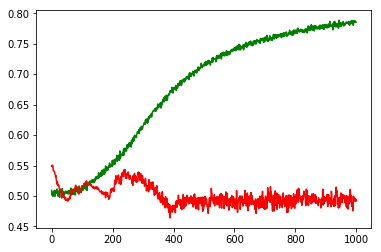

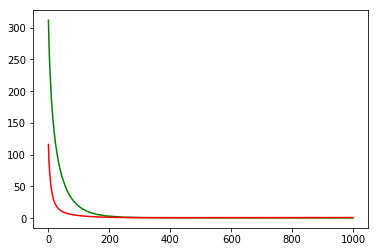

working on d,u and l,le 0.5 64 0.05 1e-05


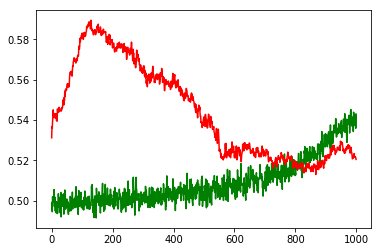

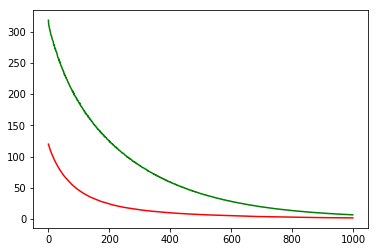

working on d,u and l,le 0.5 128 0.01 0.001


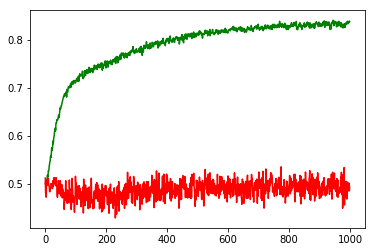

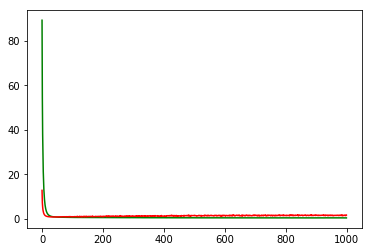

working on d,u and l,le 0.5 128 0.01 0.0001


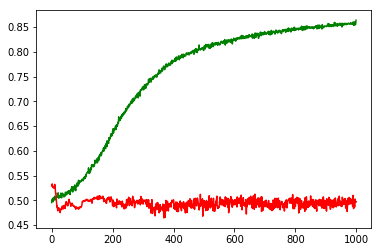

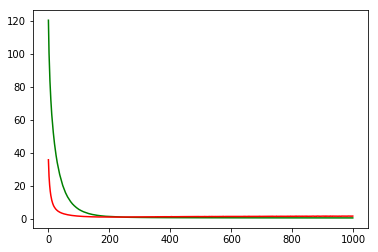

working on d,u and l,le 0.5 128 0.01 1e-05


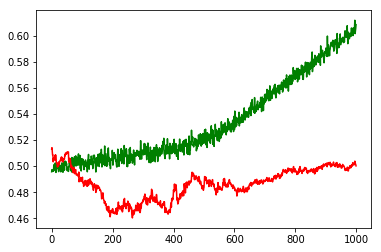

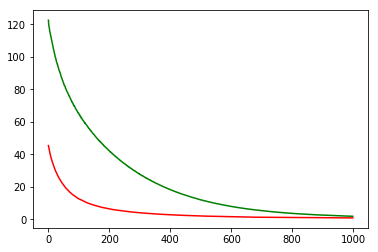

working on d,u and l,le 0.5 128 0.05 0.001


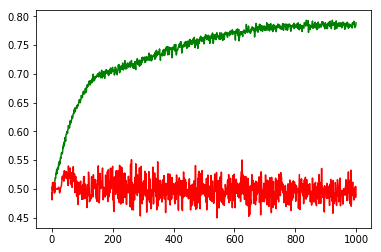

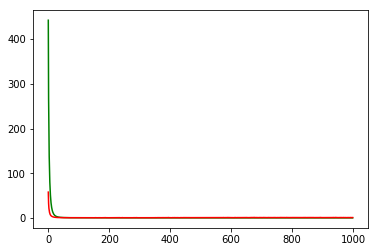

working on d,u and l,le 0.5 128 0.05 0.0001


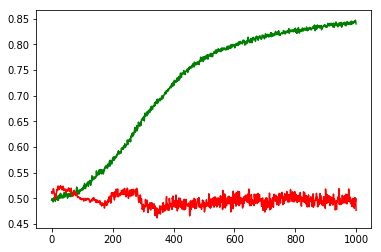

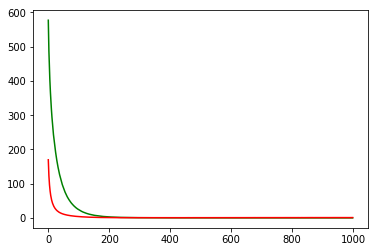

working on d,u and l,le 0.5 128 0.05 1e-05


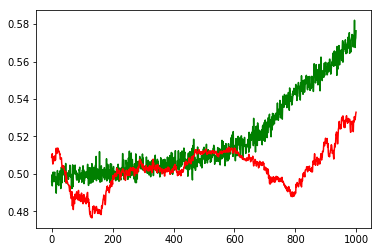

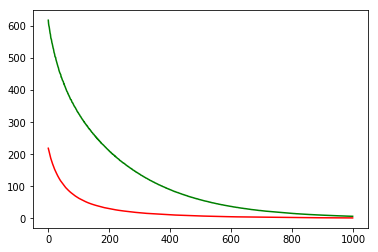

working on d,u and l,le 0.5 256 0.01 0.001


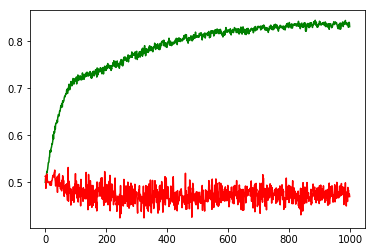

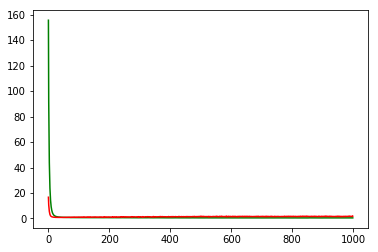

working on d,u and l,le 0.5 256 0.01 0.0001


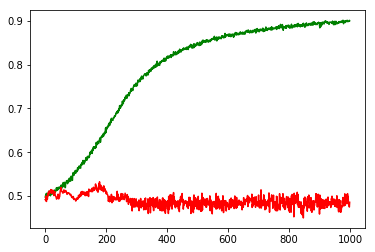

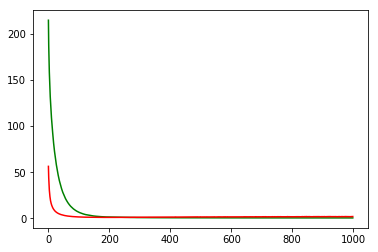

working on d,u and l,le 0.5 256 0.01 1e-05


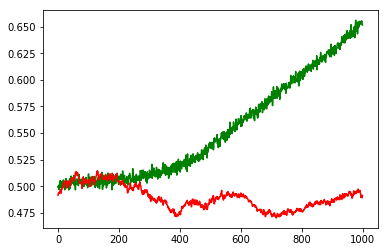

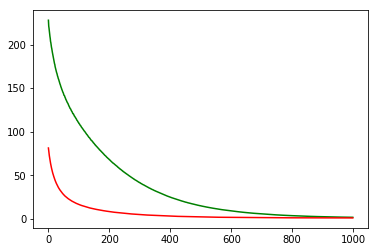

working on d,u and l,le 0.5 256 0.05 0.001


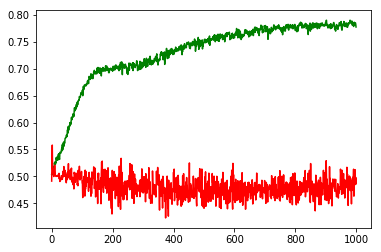

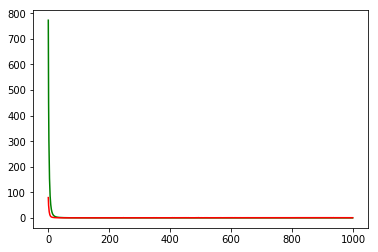

working on d,u and l,le 0.5 256 0.05 0.0001


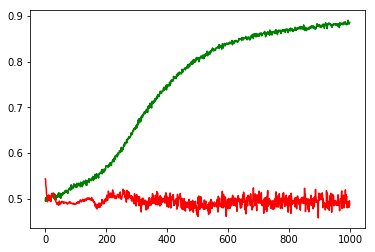

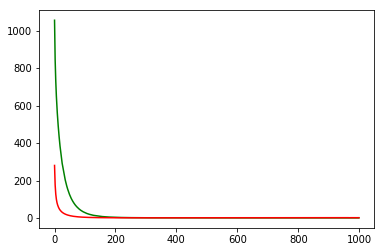

working on d,u and l,le 0.5 256 0.05 1e-05


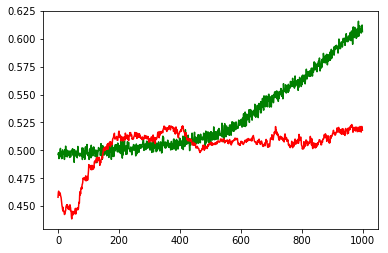

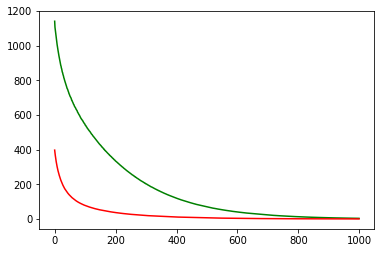

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.001
Chart for BEST MODEL FOR: NFLX


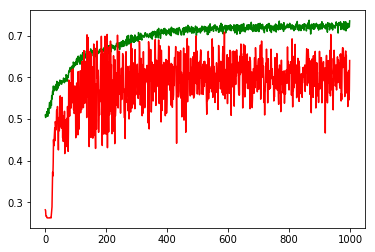

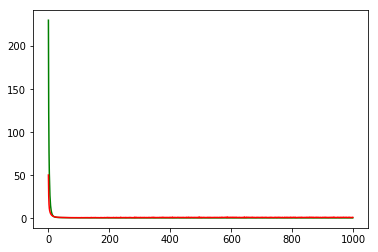

F1,score 0.7640579710144928
G-score: 0.41878702009128627
Accuracy 0.6404593648000656
Window: 140
[[ 66 231]
 [176 659]]
Vol pos 4.651561835250685
Vol neg 3.7757325877361767
Real Percentage of gain: 258.44627474222375
Percentage of gain: 1.6216070382933943
Total gain: 1835.6591673481223
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 41 129]
 [ 55 235]]
460/460 [==============================] - 0s 35us/step
[1.2626535035993742, 0.6000000005183013]
Percentile:  1
[[  0  60]
 [ 70 198]]
328/328 [==============================] - 0s 29us/step
[1.4804156466228207, 0.6036585365853658]
Percentile:  2
[[ 10  28]
 [ 36 159]]
233/233 [==============================] - 0s 29us/step
[0.9651441391829257, 0.7253218884120172]
Percentile:  3
[[14 13]
 [15 55]]
97/97 [==============================] - 0s 92us/step
[0.5784920563359659, 0.711340206185567]
Percentile:  4
[[ 1  0]
 [ 0 11]]
12/12 [==============================] - 0s 53us/step
[0.07085107266902924, 1.0]
0000000000000000

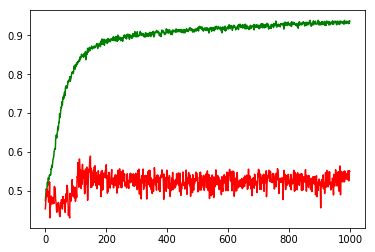

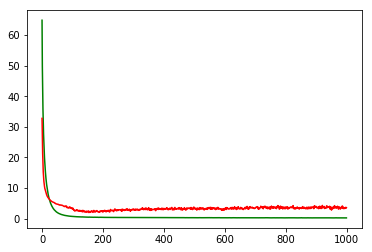

working on d,u and l,le 0.5 64 0.01 0.0001


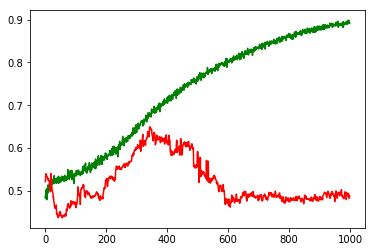

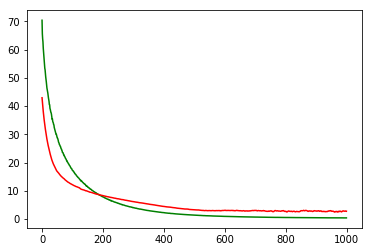

working on d,u and l,le 0.5 64 0.01 1e-05


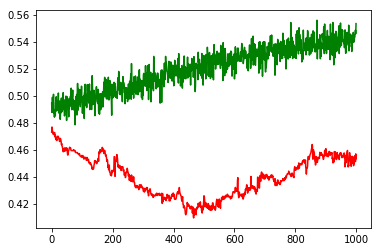

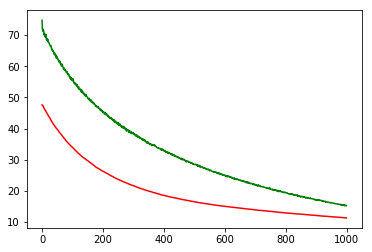

working on d,u and l,le 0.5 64 0.05 0.001


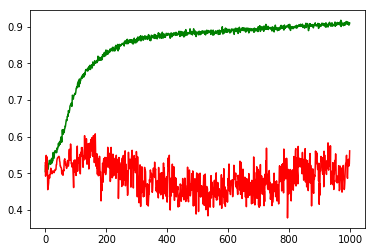

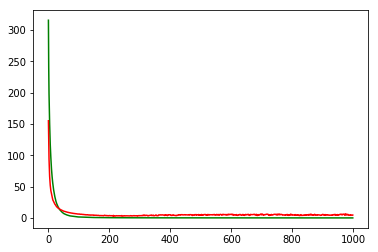

working on d,u and l,le 0.5 64 0.05 0.0001


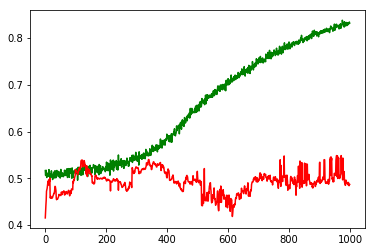

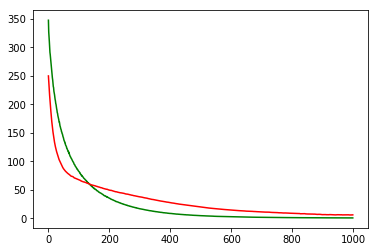

working on d,u and l,le 0.5 64 0.05 1e-05


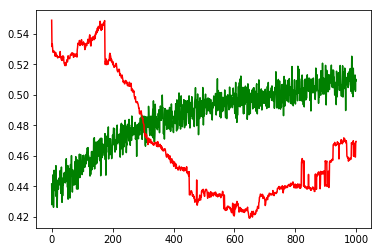

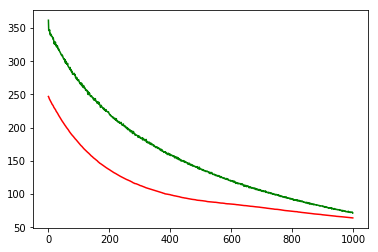

working on d,u and l,le 0.5 128 0.01 0.001


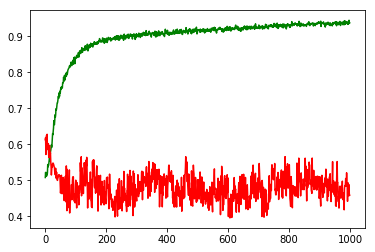

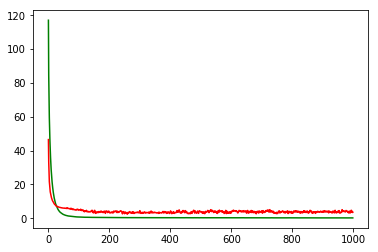

working on d,u and l,le 0.5 128 0.01 0.0001


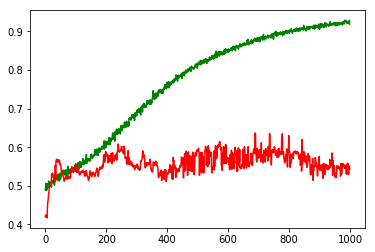

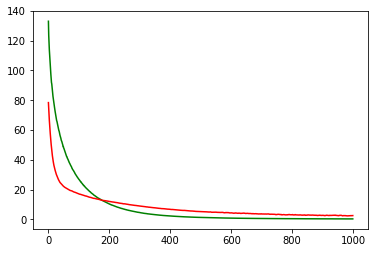

working on d,u and l,le 0.5 128 0.01 1e-05


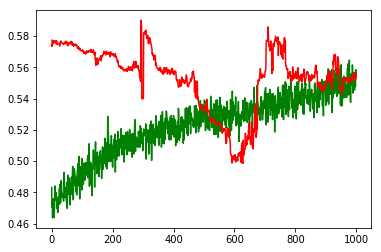

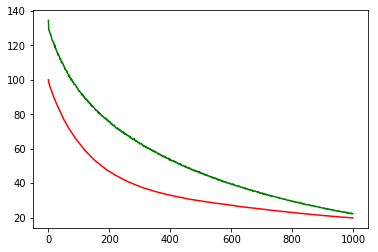

working on d,u and l,le 0.5 128 0.05 0.001


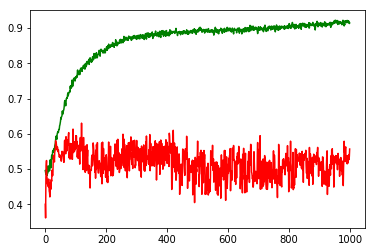

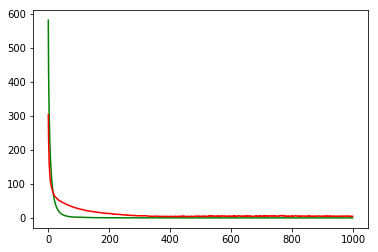

working on d,u and l,le 0.5 128 0.05 0.0001


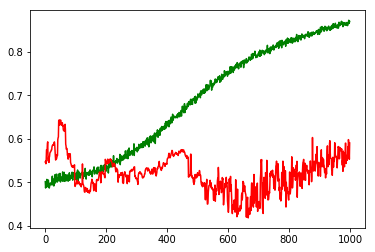

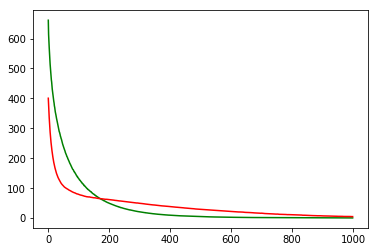

working on d,u and l,le 0.5 128 0.05 1e-05


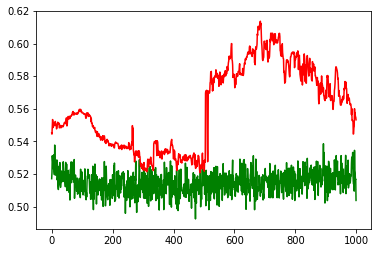

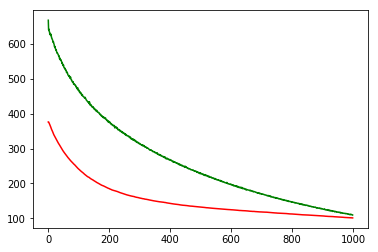

working on d,u and l,le 0.5 256 0.01 0.001


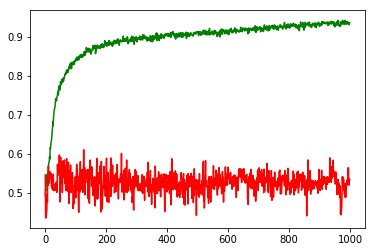

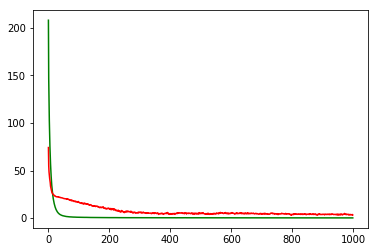

working on d,u and l,le 0.5 256 0.01 0.0001


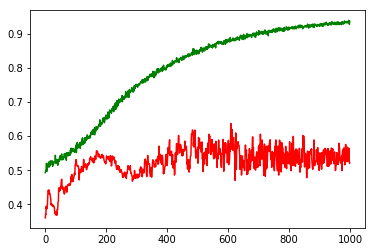

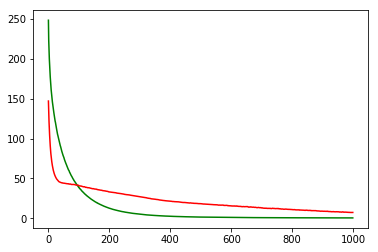

working on d,u and l,le 0.5 256 0.01 1e-05


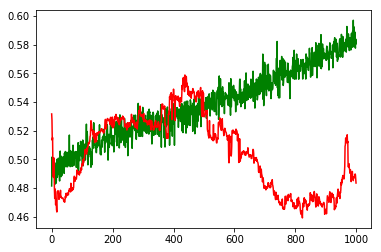

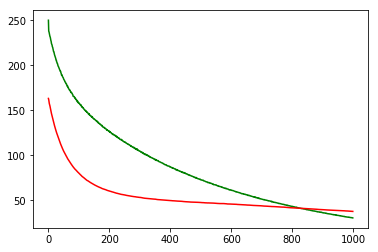

working on d,u and l,le 0.5 256 0.05 0.001


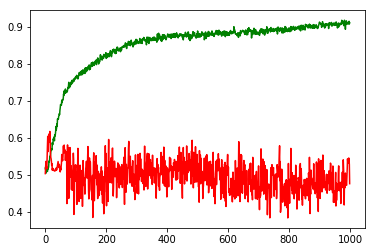

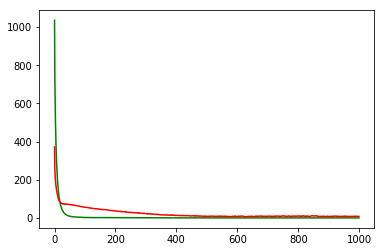

working on d,u and l,le 0.5 256 0.05 0.0001


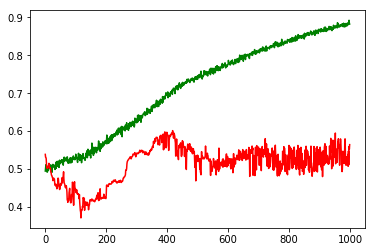

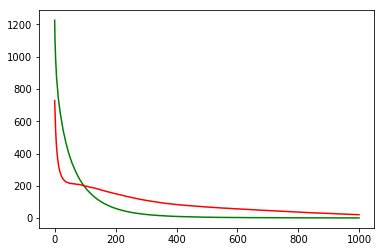

working on d,u and l,le 0.5 256 0.05 1e-05


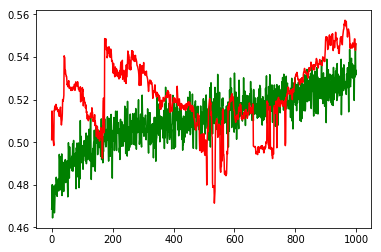

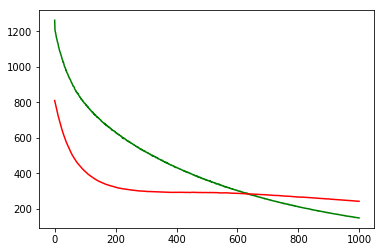

maxd,maxu,maxl,maxle: 0.5 128 0.05 1e-05
Chart for BEST MODEL FOR: BKNG


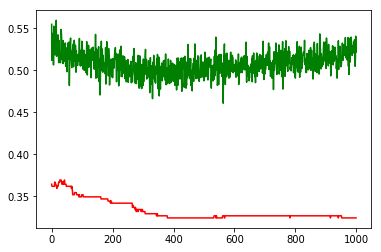

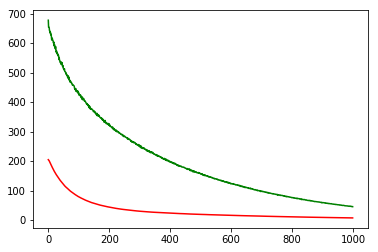

F1,score 0.007380073800738007
G-score: 0.06049419561227432
Accuracy 0.3241206031273957
Window: 140
[[128   3]
 [266   1]]
Vol pos 0.6301588992286803
Vol neg 1.4451687864333704
Real Percentage of gain: -225.9787709892731
Percentage of gain: -0.7725123255027058
Total gain: -307.4599055500769
000000000000000000000000000000000000000000000000
Percentile:  0
[[94  3]
 [75  0]]
172/172 [==============================] - 0s 62us/step
[2.4997485183006107, 0.5465116279069767]
Percentile:  1
[[26  0]
 [73  1]]
100/100 [==============================] - 0s 39us/step
[2.206246671676636, 0.27]
Percentile:  2
[[ 7  0]
 [82  0]]
89/89 [==============================] - 0s 35us/step
[2.5679502540759827, 0.07865168572811598]
Percentile:  3
[[ 0  0]
 [23  0]]
23/23 [==============================] - 0s 34us/step
[2.1917176246643066, 0.0]
Percentile:  4
[[ 0  0]
 [12  0]]
12/12 [==============================] - 0s 57us/step
[1.2229013442993164, 0.0]
000000000000000000000000000000000000000000000000
Workin

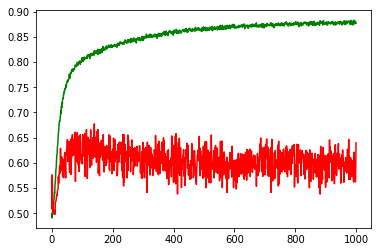

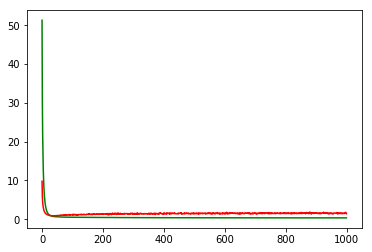

working on d,u and l,le 0.5 64 0.01 0.0001


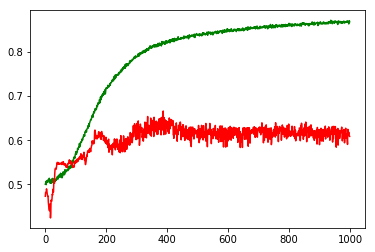

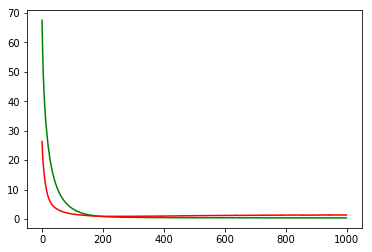

working on d,u and l,le 0.5 64 0.01 1e-05


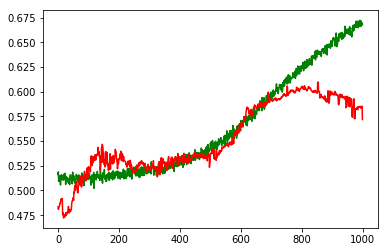

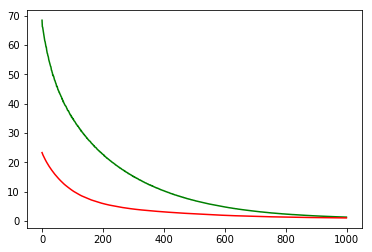

working on d,u and l,le 0.5 64 0.05 0.001


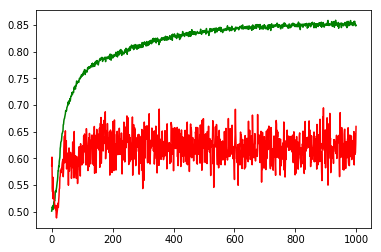

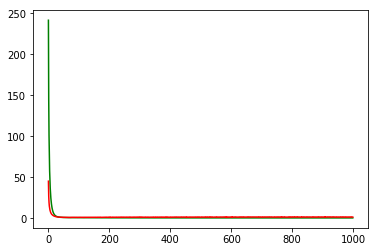

working on d,u and l,le 0.5 64 0.05 0.0001


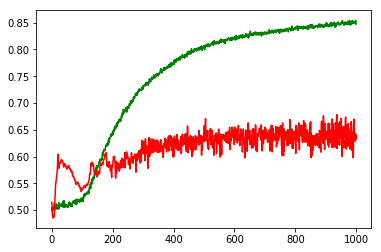

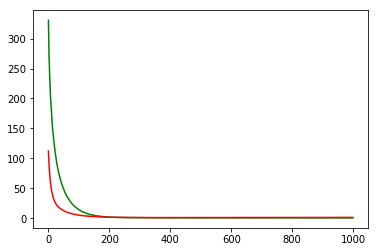

working on d,u and l,le 0.5 64 0.05 1e-05


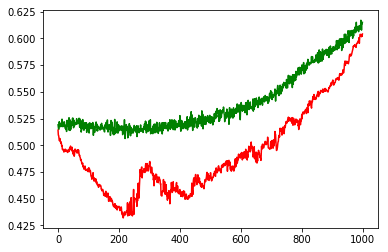

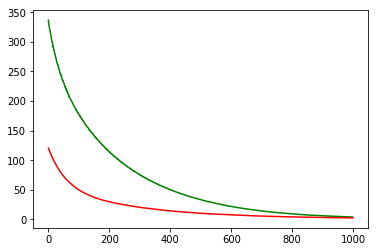

working on d,u and l,le 0.5 128 0.01 0.001


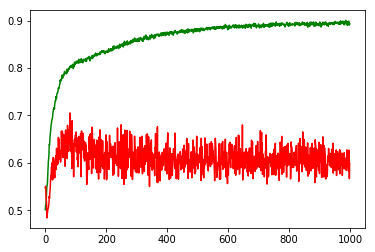

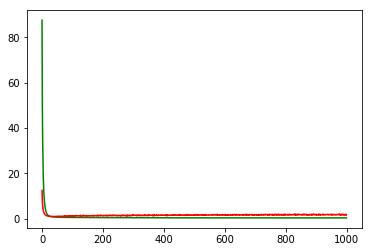

working on d,u and l,le 0.5 128 0.01 0.0001


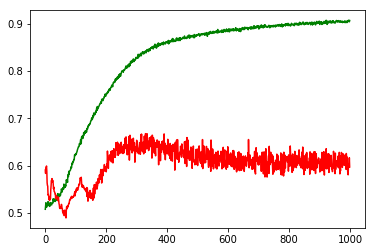

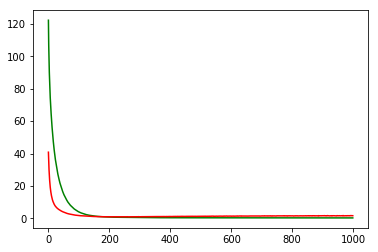

working on d,u and l,le 0.5 128 0.01 1e-05


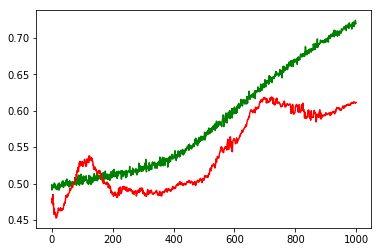

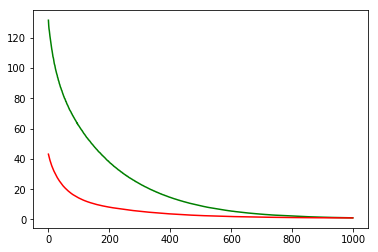

working on d,u and l,le 0.5 128 0.05 0.001


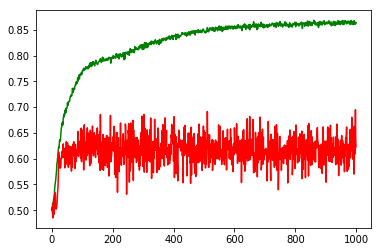

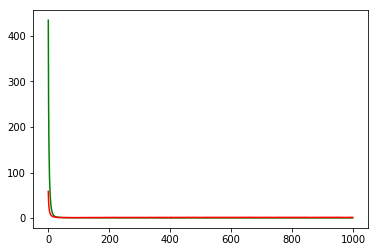

working on d,u and l,le 0.5 128 0.05 0.0001


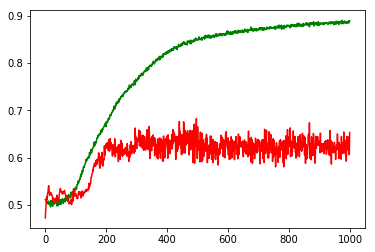

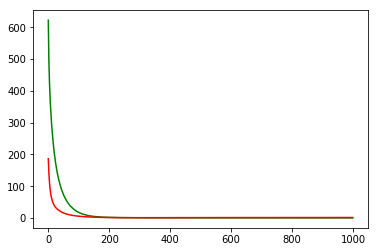

working on d,u and l,le 0.5 128 0.05 1e-05


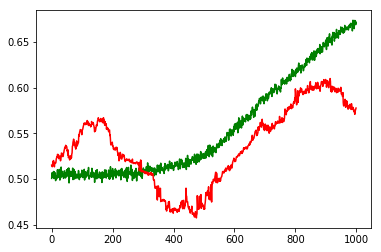

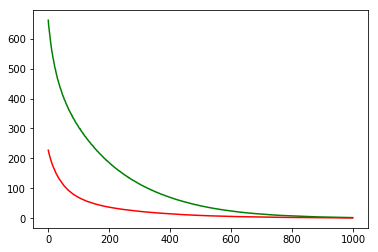

working on d,u and l,le 0.5 256 0.01 0.001


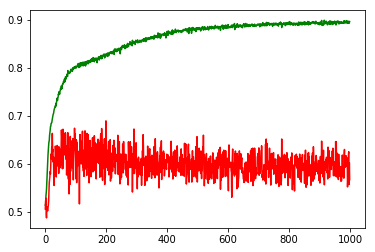

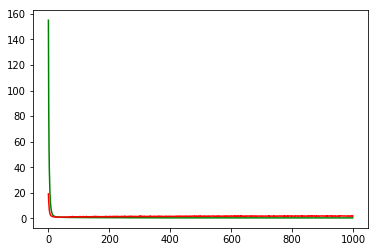

working on d,u and l,le 0.5 256 0.01 0.0001


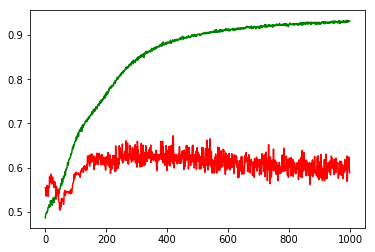

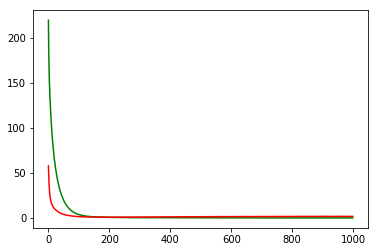

working on d,u and l,le 0.5 256 0.01 1e-05


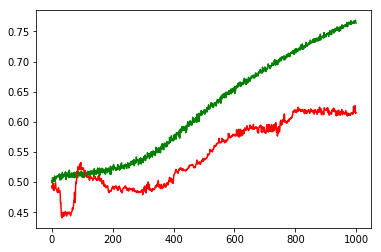

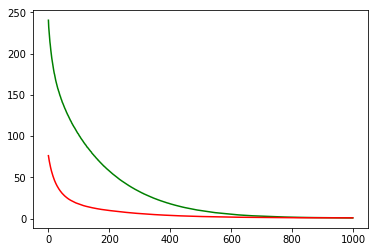

working on d,u and l,le 0.5 256 0.05 0.001


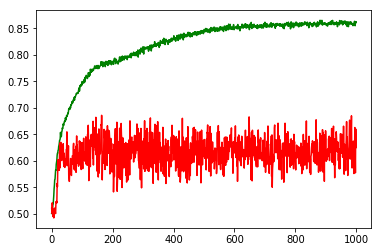

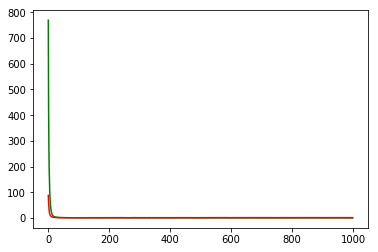

working on d,u and l,le 0.5 256 0.05 0.0001


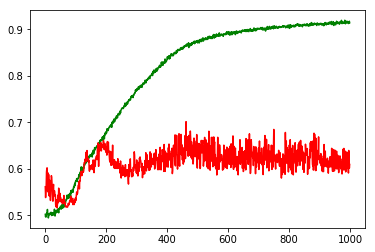

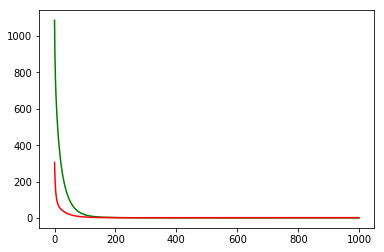

working on d,u and l,le 0.5 256 0.05 1e-05


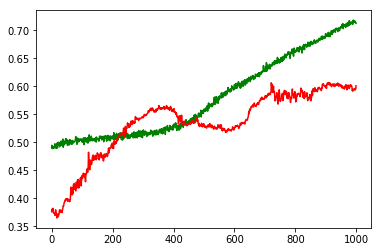

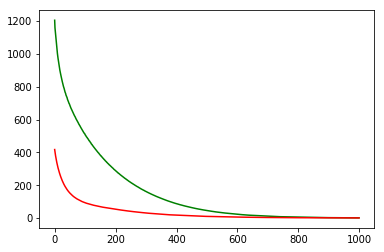

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.001
Chart for BEST MODEL FOR: ADBE


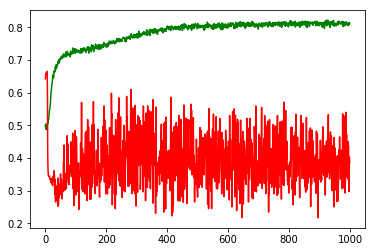

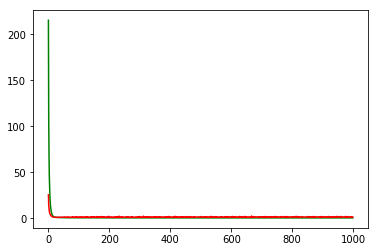

F1,score 0.4930707512764405
G-score: 0.3359456328906131
Accuracy 0.38441098393646356
Window: 140
[[ 96 292]
 [403 338]]
Vol pos 2.122861244193729
Vol neg 2.903470880219501
Real Percentage of gain: -96.04584891899442
Percentage of gain: -0.9712936065300928
Total gain: -1096.5904817724747
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 94 183]
 [137 147]]
561/561 [==============================] - 0s 24us/step
[1.3650547799367105, 0.4295900178253119]
Percentile:  1
[[  2  61]
 [130 131]]
324/324 [==============================] - 0s 25us/step
[1.464113665951623, 0.4104938271604938]
Percentile:  2
[[ 0 25]
 [78 55]]
158/158 [==============================] - 0s 28us/step
[1.3762917518615723, 0.3481012695952307]
Percentile:  3
[[ 0 23]
 [42  1]]
66/66 [==============================] - 0s 67us/step
[2.2029384049502285, 0.015151515151515152]
Percentile:  4
[[ 0  0]
 [14  4]]
18/18 [==============================] - 0s 50us/step
[1.777355432510376, 0.2222222238779068]
0000

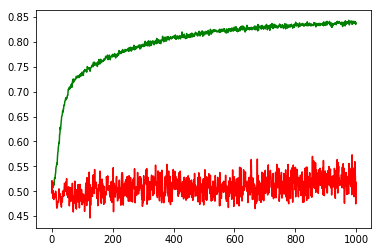

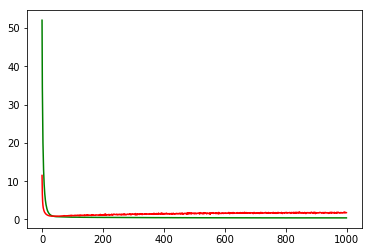

working on d,u and l,le 0.5 64 0.01 0.0001


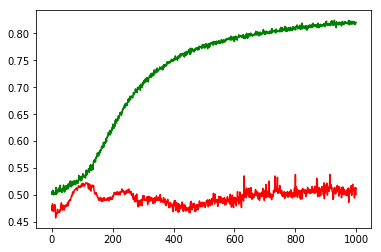

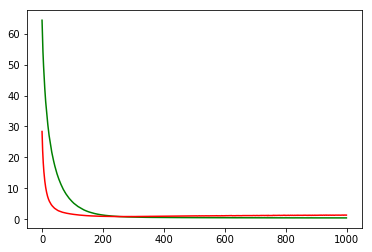

working on d,u and l,le 0.5 64 0.01 1e-05


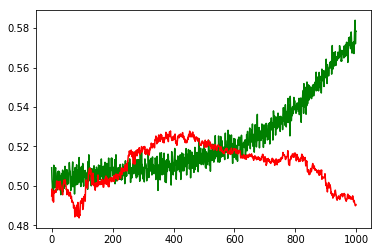

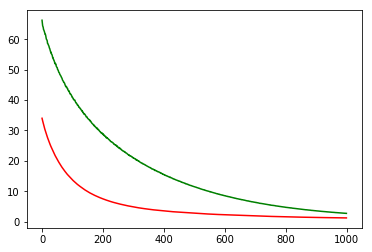

working on d,u and l,le 0.5 64 0.05 0.001


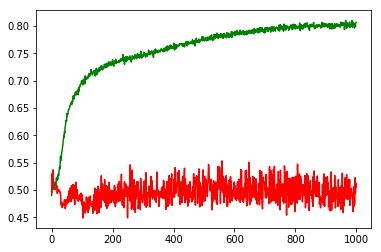

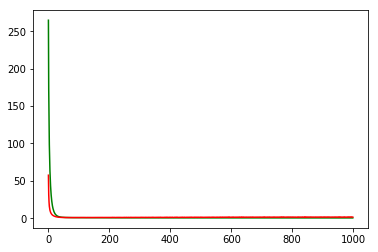

working on d,u and l,le 0.5 64 0.05 0.0001


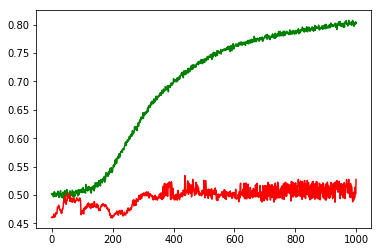

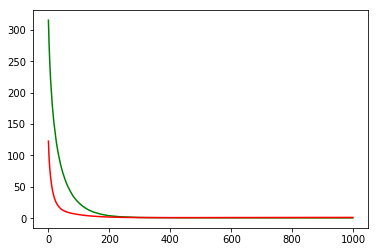

working on d,u and l,le 0.5 64 0.05 1e-05


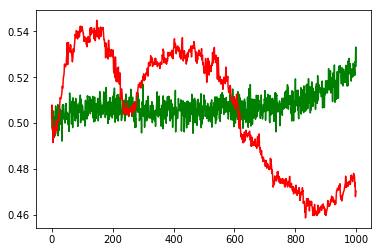

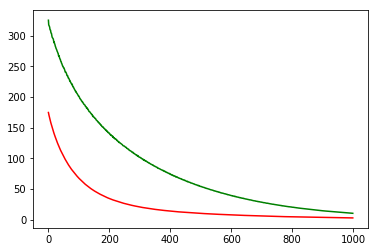

working on d,u and l,le 0.5 128 0.01 0.001


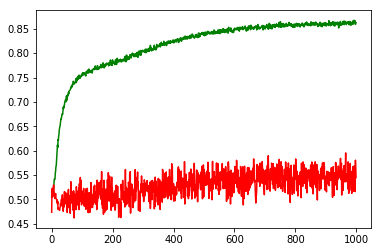

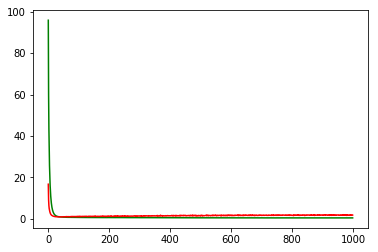

working on d,u and l,le 0.5 128 0.01 0.0001


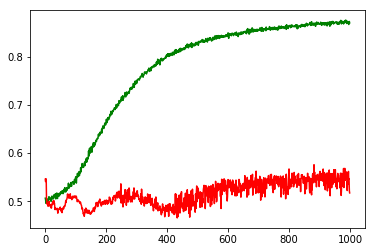

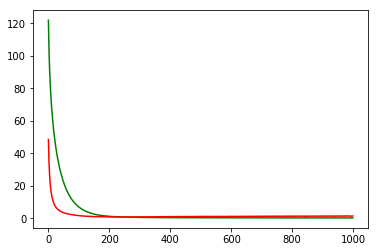

working on d,u and l,le 0.5 128 0.01 1e-05


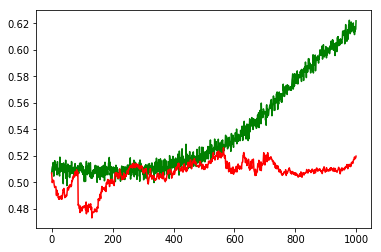

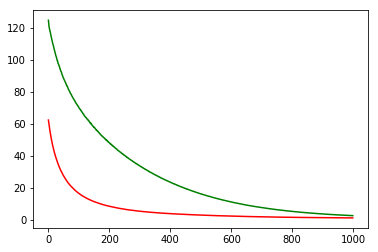

working on d,u and l,le 0.5 128 0.05 0.001


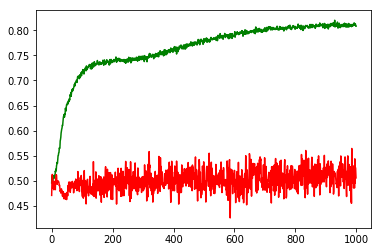

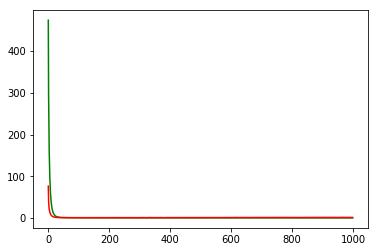

working on d,u and l,le 0.5 128 0.05 0.0001


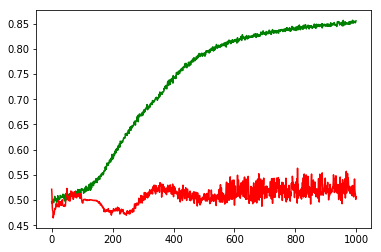

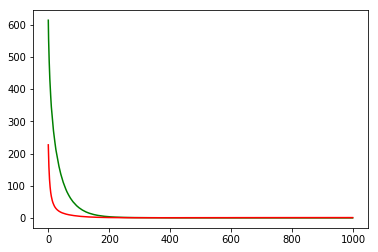

working on d,u and l,le 0.5 128 0.05 1e-05


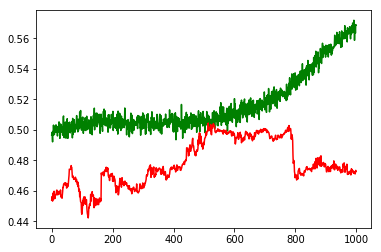

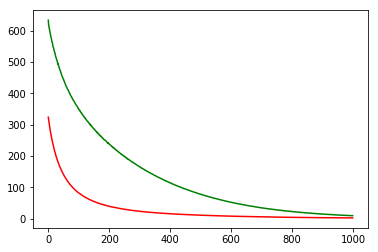

working on d,u and l,le 0.5 256 0.01 0.001


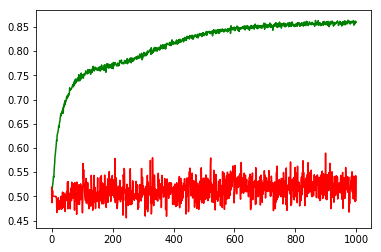

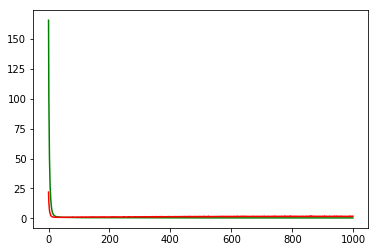

working on d,u and l,le 0.5 256 0.01 0.0001


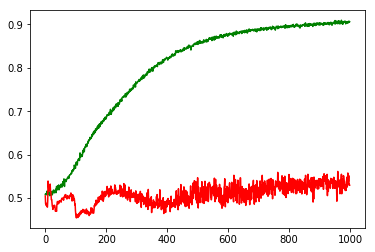

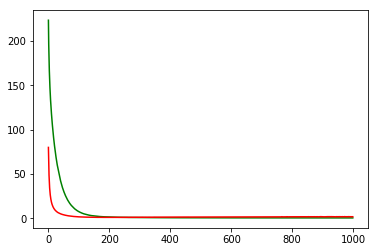

working on d,u and l,le 0.5 256 0.01 1e-05


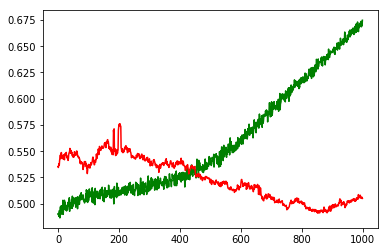

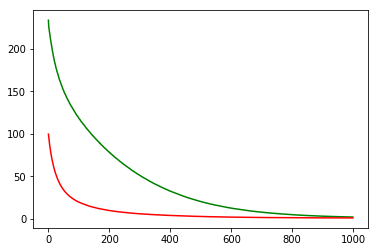

working on d,u and l,le 0.5 256 0.05 0.001


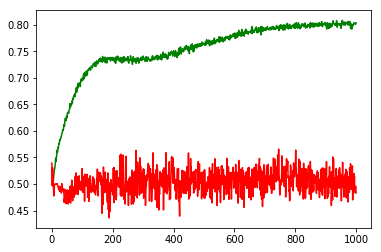

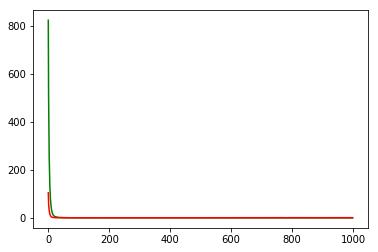

working on d,u and l,le 0.5 256 0.05 0.0001


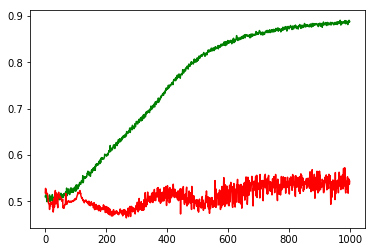

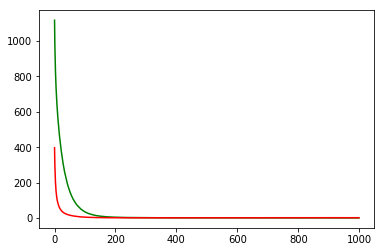

working on d,u and l,le 0.5 256 0.05 1e-05


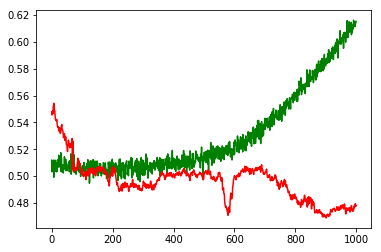

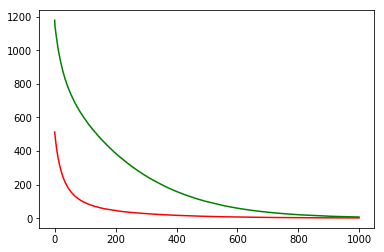

maxd,maxu,maxl,maxle: 0.5 256 0.05 0.0001
Chart for BEST MODEL FOR: AMGN


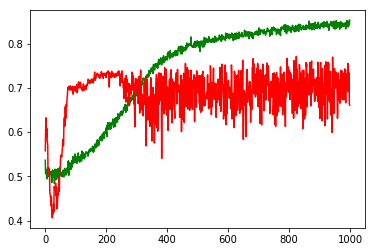

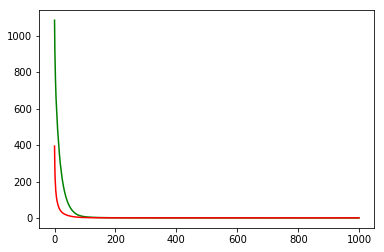

F1,score 0.7395762132604237
G-score: 0.6505248623327751
Accuracy 0.6607301849822115
Window: 140
[[201 119]
 [262 541]]
Vol pos 2.0376292400454408
Vol neg 1.7240649854543117
Real Percentage of gain: 195.4117138610627
Percentage of gain: 0.7613999435936101
Total gain: 855.0521366556242
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 91  74]
 [115 166]]
446/446 [==============================] - 0s 27us/step
[0.8424870511475165, 0.5762331838565022]
Percentile:  1
[[ 39  16]
 [ 74 187]]
316/316 [==============================] - 0s 27us/step
[0.5767196594159815, 0.7151898749266998]
Percentile:  2
[[ 20   6]
 [ 53 135]]
214/214 [==============================] - 0s 64us/step
[0.6219030497508629, 0.7242990654205608]
Percentile:  3
[[40 16]
 [18 51]]
125/125 [==============================] - 0s 72us/step
[0.760595561504364, 0.7280000038146973]
Percentile:  4
[[10  7]
 [ 2  1]]
20/20 [==============================] - 0s 99us/step
[0.8834631443023682, 0.550000011920929]
000

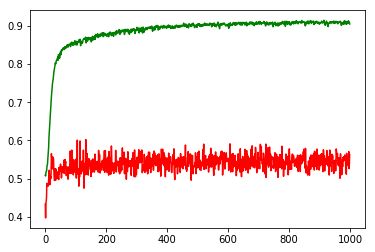

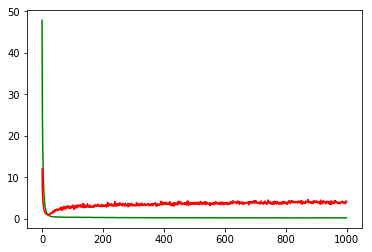

working on d,u and l,le 0.5 64 0.01 0.0001


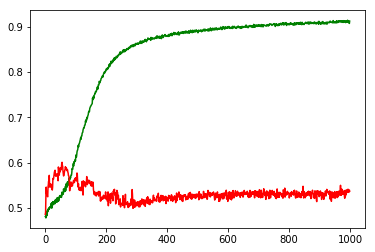

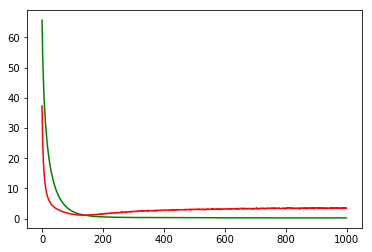

working on d,u and l,le 0.5 64 0.01 1e-05


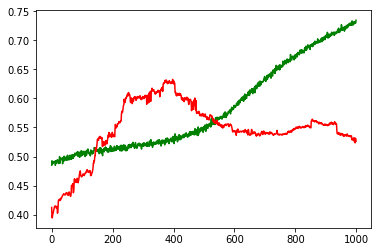

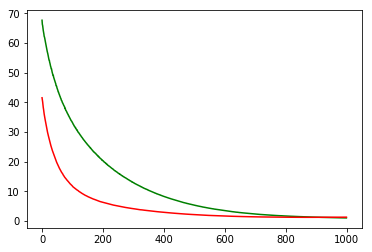

working on d,u and l,le 0.5 64 0.05 0.001


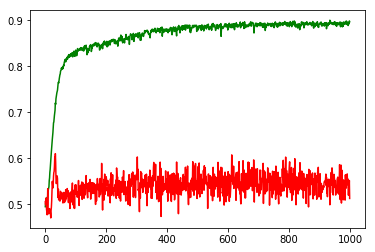

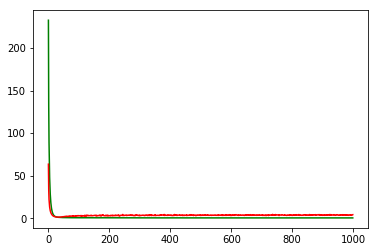

working on d,u and l,le 0.5 64 0.05 0.0001


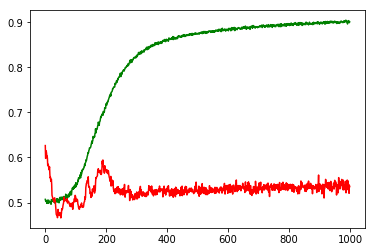

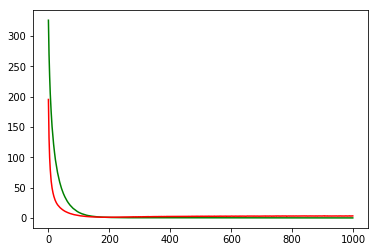

working on d,u and l,le 0.5 64 0.05 1e-05


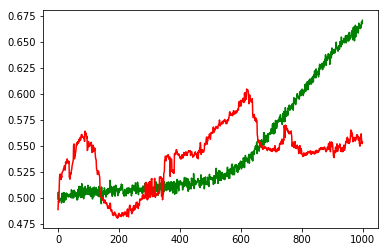

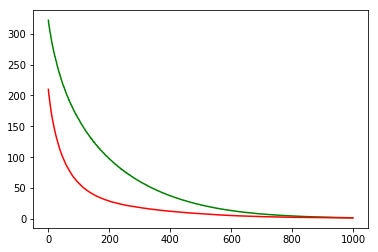

working on d,u and l,le 0.5 128 0.01 0.001


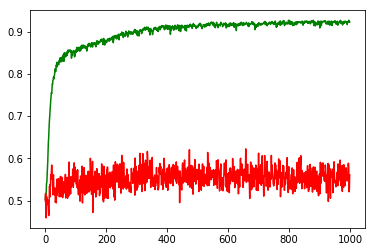

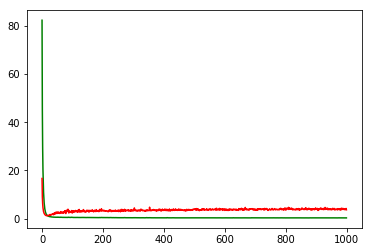

working on d,u and l,le 0.5 128 0.01 0.0001


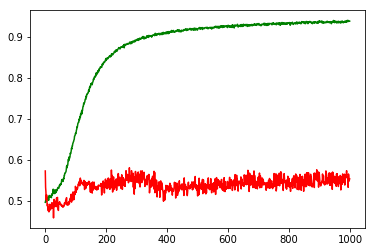

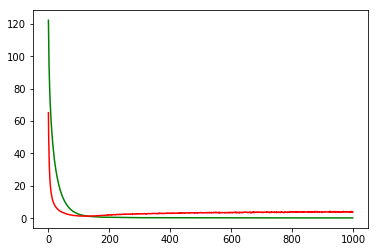

working on d,u and l,le 0.5 128 0.01 1e-05


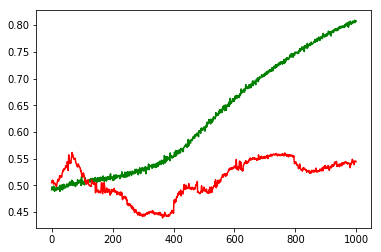

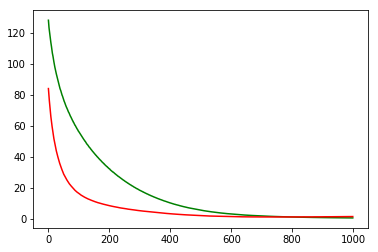

working on d,u and l,le 0.5 128 0.05 0.001


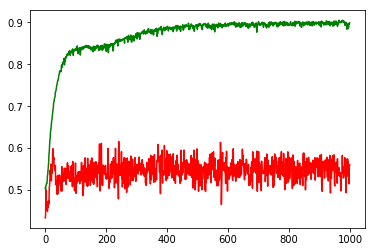

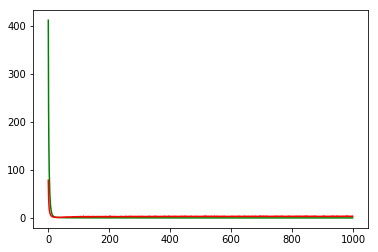

working on d,u and l,le 0.5 128 0.05 0.0001


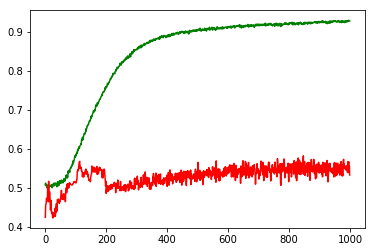

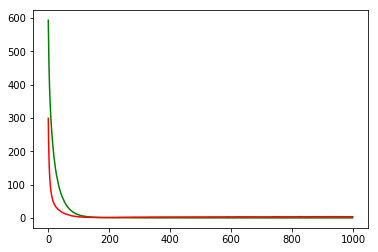

working on d,u and l,le 0.5 128 0.05 1e-05


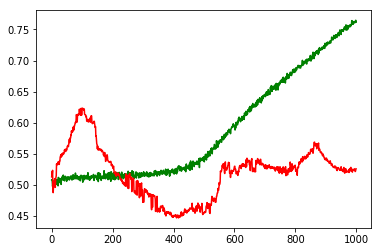

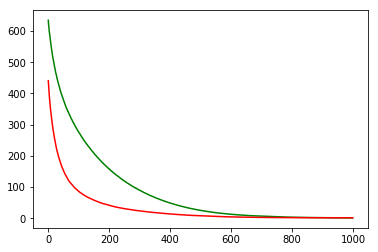

working on d,u and l,le 0.5 256 0.01 0.001


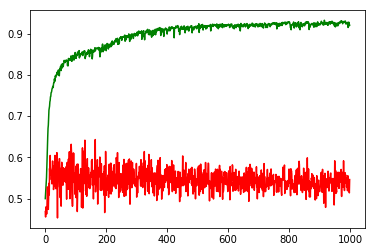

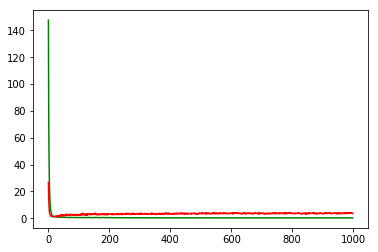

working on d,u and l,le 0.5 256 0.01 0.0001


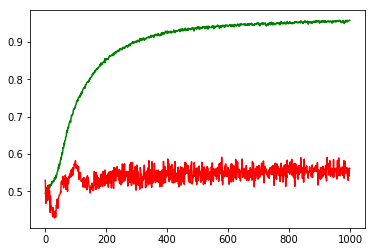

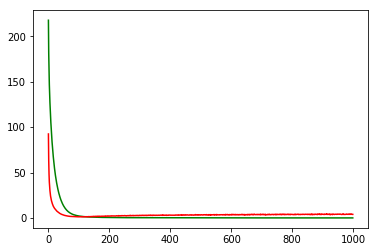

working on d,u and l,le 0.5 256 0.01 1e-05


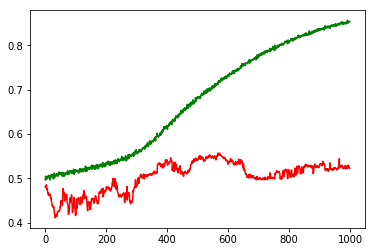

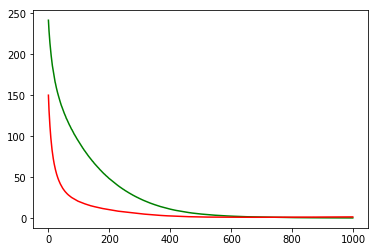

working on d,u and l,le 0.5 256 0.05 0.001


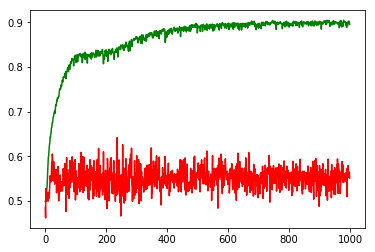

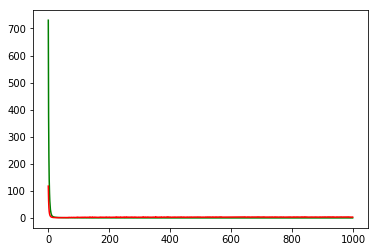

working on d,u and l,le 0.5 256 0.05 0.0001


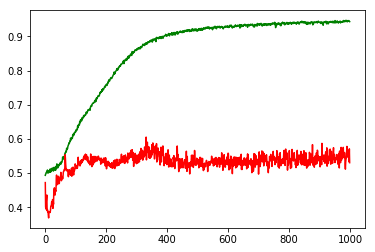

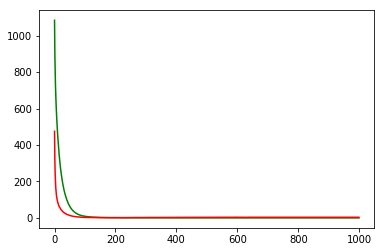

working on d,u and l,le 0.5 256 0.05 1e-05


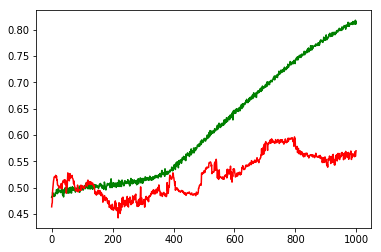

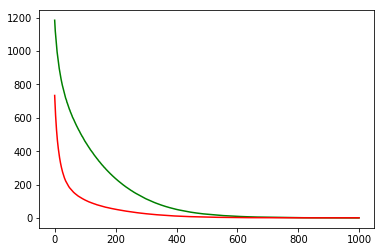

maxd,maxu,maxl,maxle: 0.5 256 0.05 1e-05
Chart for BEST MODEL FOR: TXN


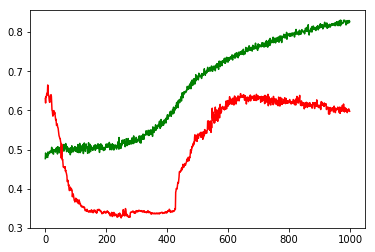

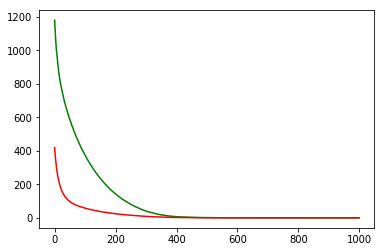

F1,score 0.6976744186046512
G-score: 0.5313515441797397
Accuracy 0.597701149214484
Window: 140
[[151 217]
 [238 525]]
Vol pos 2.626845458530922
Vol neg 2.301214006580883
Real Percentage of gain: 58.31285885313595
Percentage of gain: 0.6442928001526095
Total gain: 728.6951569726014
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 73 135]
 [ 63 184]]
455/455 [==============================] - 0s 29us/step
[1.2750703911204915, 0.5648351649334142]
Percentile:  1
[[ 76  53]
 [ 76 129]]
334/334 [==============================] - 0s 31us/step
[1.3287205010830998, 0.6137724550898204]
Percentile:  2
[[ 2 12]
 [79 99]]
192/192 [==============================] - 0s 31us/step
[0.9784745251139005, 0.5260416666666666]
Percentile:  3
[[ 0 10]
 [20 92]]
122/122 [==============================] - 0s 36us/step
[0.6319509686016646, 0.754098361632863]
Percentile:  4
[[ 0  7]
 [ 0 19]]
26/26 [==============================] - 0s 44us/step
[0.9452022314071655, 0.7307692170143127]
000000000

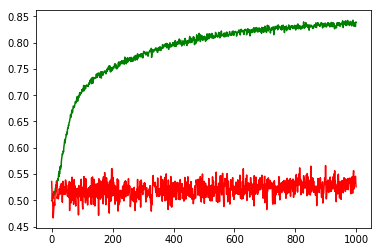

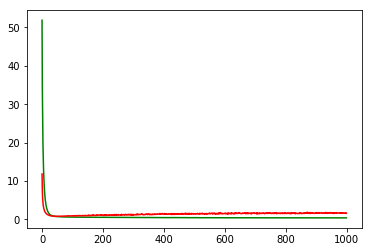

working on d,u and l,le 0.5 64 0.01 0.0001


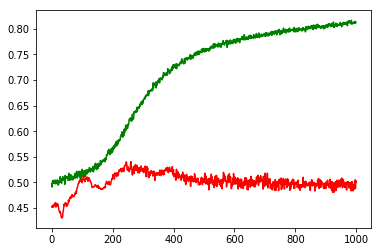

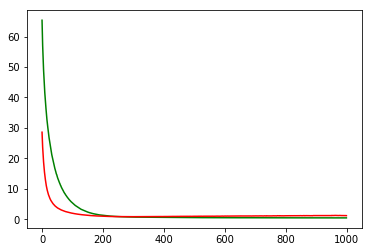

working on d,u and l,le 0.5 64 0.01 1e-05


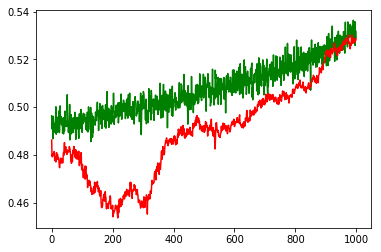

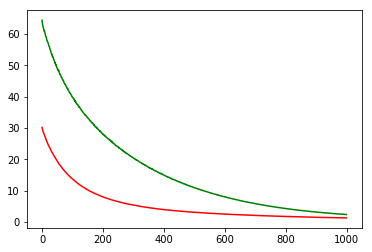

working on d,u and l,le 0.5 64 0.05 0.001


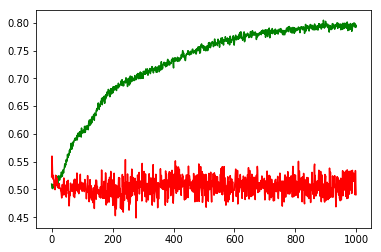

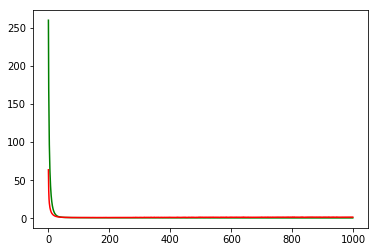

working on d,u and l,le 0.5 64 0.05 0.0001


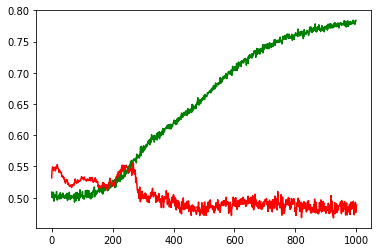

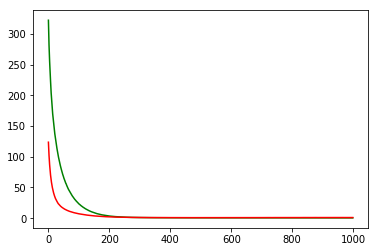

working on d,u and l,le 0.5 64 0.05 1e-05


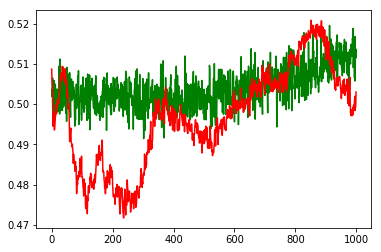

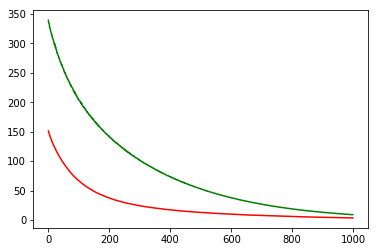

working on d,u and l,le 0.5 128 0.01 0.001


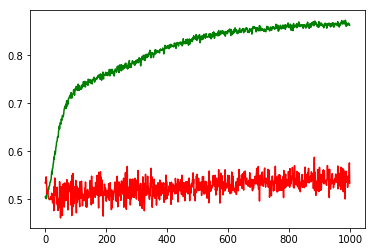

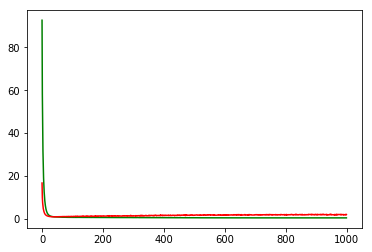

working on d,u and l,le 0.5 128 0.01 0.0001


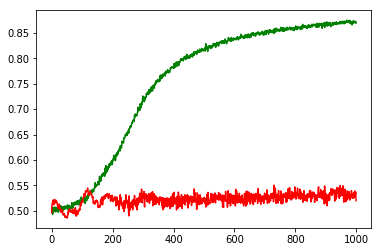

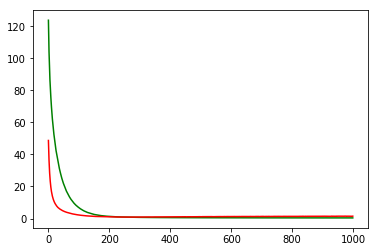

working on d,u and l,le 0.5 128 0.01 1e-05


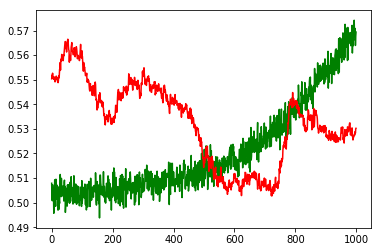

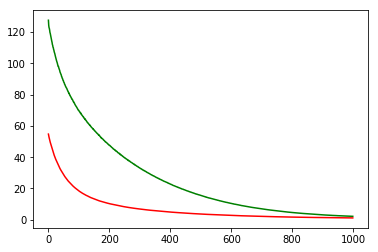

working on d,u and l,le 0.5 128 0.05 0.001


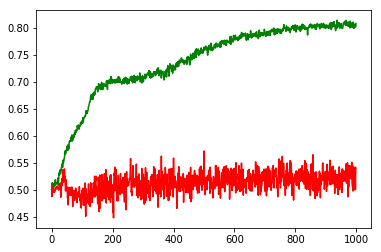

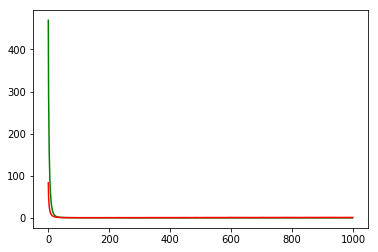

working on d,u and l,le 0.5 128 0.05 0.0001


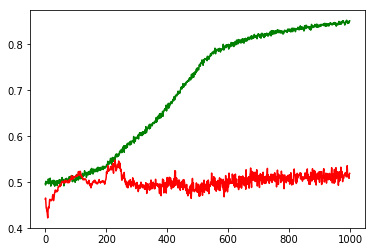

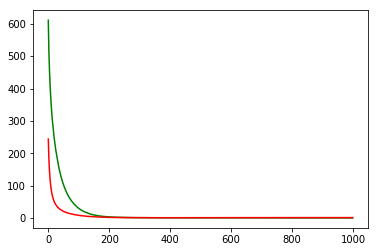

working on d,u and l,le 0.5 128 0.05 1e-05


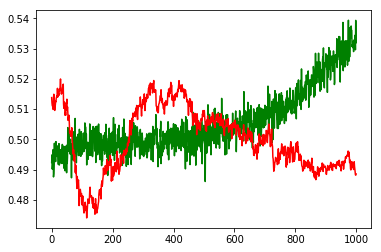

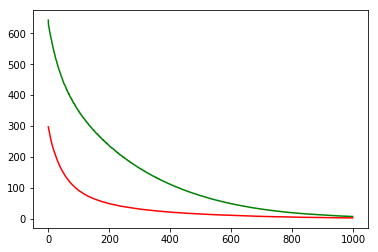

working on d,u and l,le 0.5 256 0.01 0.001


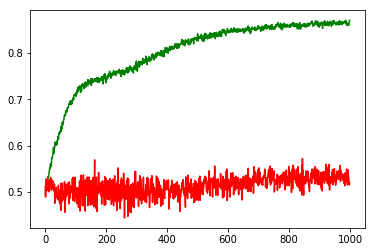

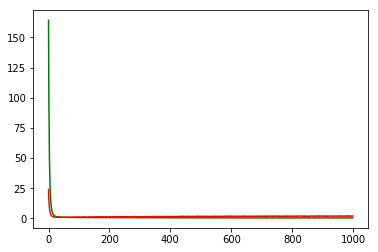

working on d,u and l,le 0.5 256 0.01 0.0001


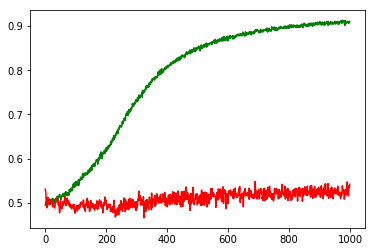

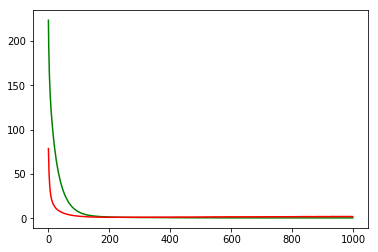

working on d,u and l,le 0.5 256 0.01 1e-05


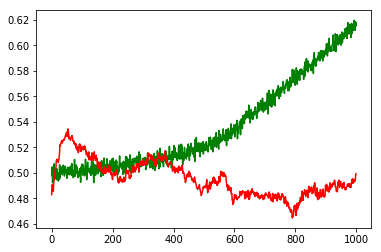

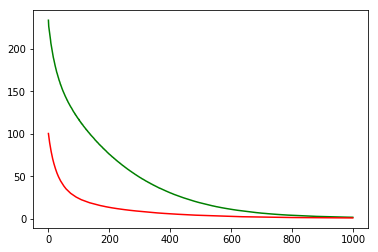

working on d,u and l,le 0.5 256 0.05 0.001


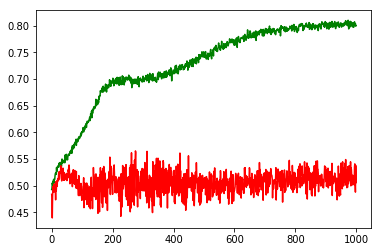

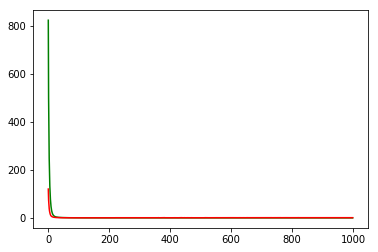

working on d,u and l,le 0.5 256 0.05 0.0001


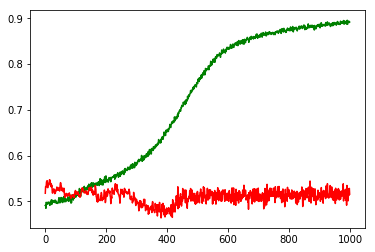

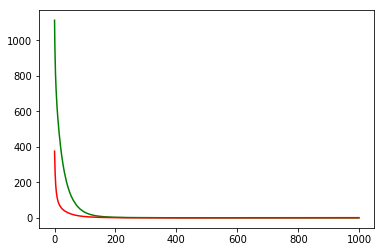

working on d,u and l,le 0.5 256 0.05 1e-05


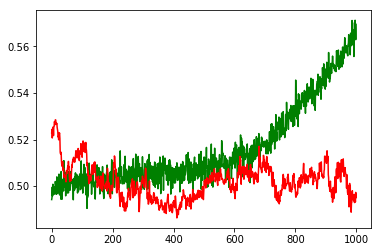

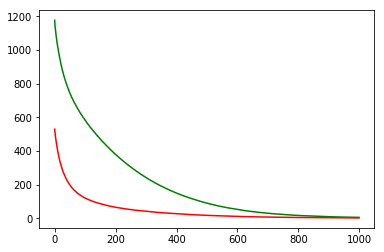

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: AVGO


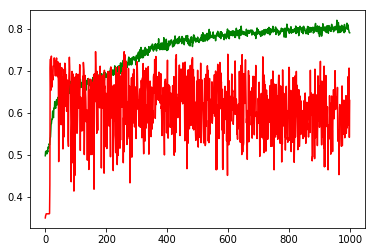

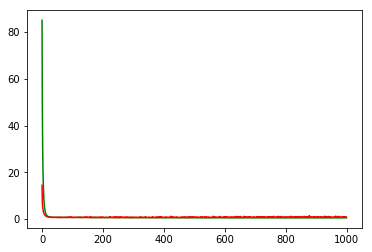

F1,score 0.6703557312252963
G-score: 0.6436285432930708
Accuracy 0.6299911274144157
Window: 140
[[286 120]
 [297 424]]
Vol pos 3.7659937315465823
Vol neg 2.241528998191088
Real Percentage of gain: 38.85181018202276
Percentage of gain: 1.543157016106823
Total gain: 1739.1379571523896
000000000000000000000000000000000000000000000000
Percentile:  0
[[114  87]
 [159 115]]
475/475 [==============================] - 0s 29us/step
[0.992752569474672, 0.4821052617775766]
Percentile:  1
[[74 30]
 [54 96]]
254/254 [==============================] - 0s 30us/step
[0.7140154923041035, 0.6692913376440214]
Percentile:  2
[[ 37   1]
 [ 79 143]]
260/260 [==============================] - 0s 30us/step
[0.6074956609652593, 0.6923076923076923]
Percentile:  3
[[23  2]
 [ 5 58]]
88/88 [==============================] - 0s 38us/step
[0.3050638030875813, 0.9204545454545454]
Percentile:  4
[[37  0]
 [ 0 11]]
48/48 [==============================] - 0s 52us/step
[0.15360591312249502, 1.0]
00000000000000000000000

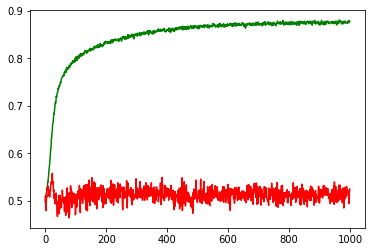

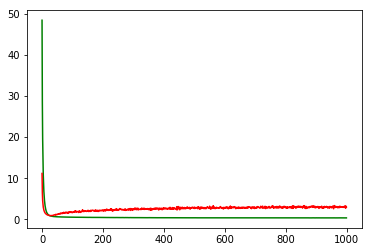

working on d,u and l,le 0.5 64 0.01 0.0001


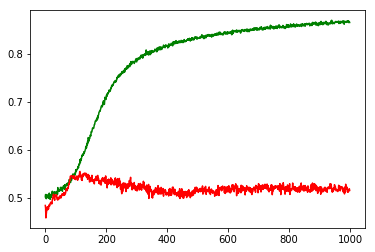

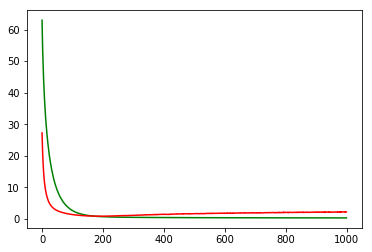

working on d,u and l,le 0.5 64 0.01 1e-05


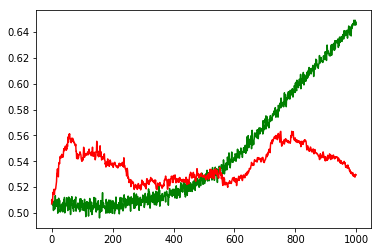

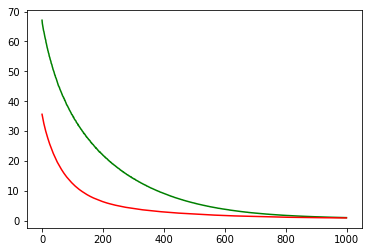

working on d,u and l,le 0.5 64 0.05 0.001


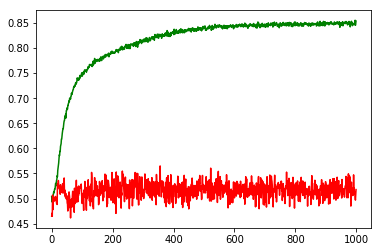

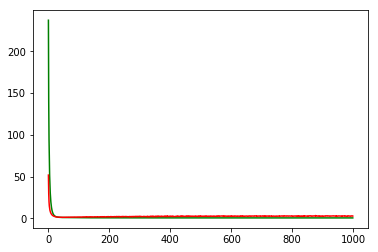

working on d,u and l,le 0.5 64 0.05 0.0001


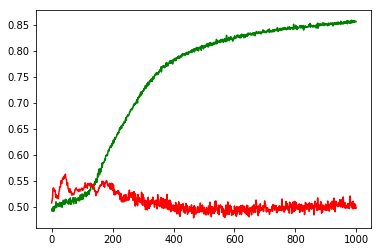

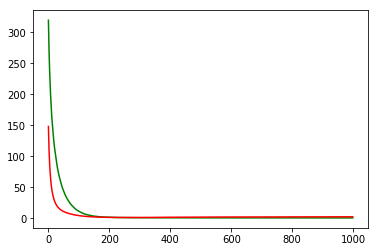

working on d,u and l,le 0.5 64 0.05 1e-05


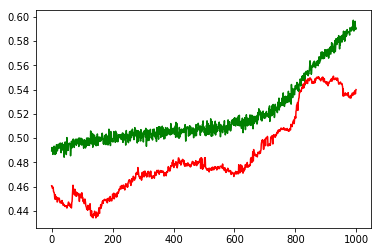

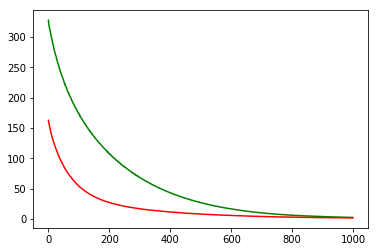

working on d,u and l,le 0.5 128 0.01 0.001


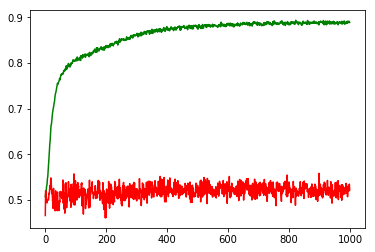

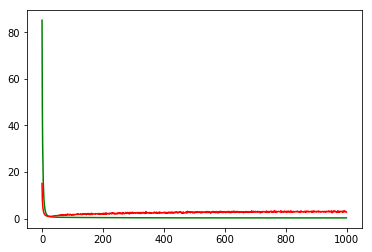

working on d,u and l,le 0.5 128 0.01 0.0001


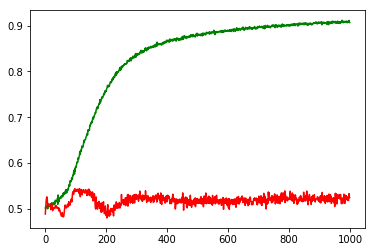

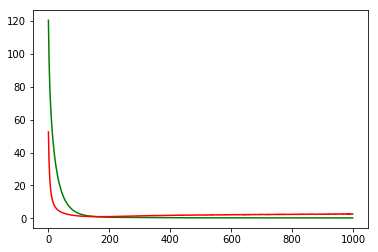

working on d,u and l,le 0.5 128 0.01 1e-05


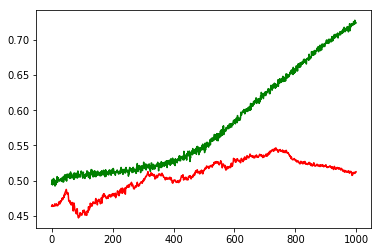

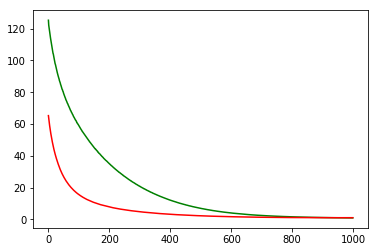

working on d,u and l,le 0.5 128 0.05 0.001


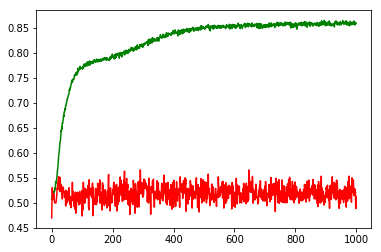

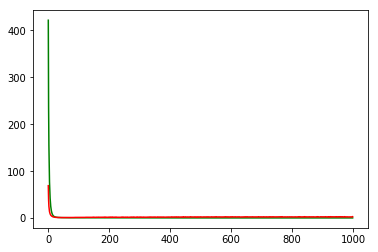

working on d,u and l,le 0.5 128 0.05 0.0001


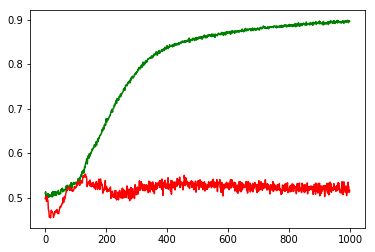

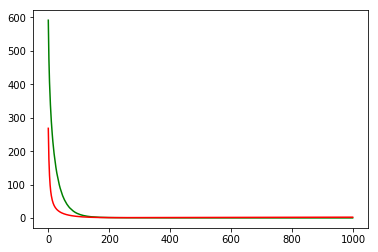

working on d,u and l,le 0.5 128 0.05 1e-05


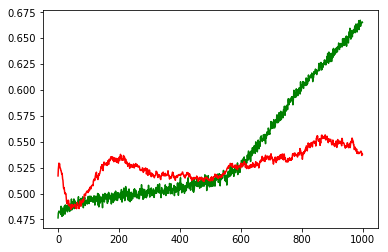

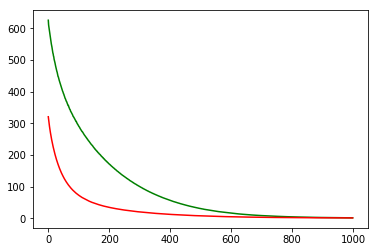

working on d,u and l,le 0.5 256 0.01 0.001


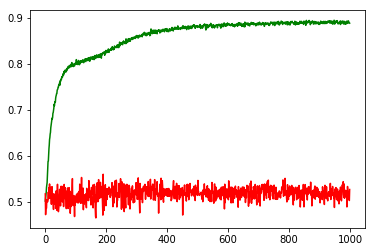

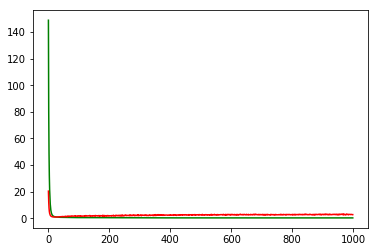

working on d,u and l,le 0.5 256 0.01 0.0001


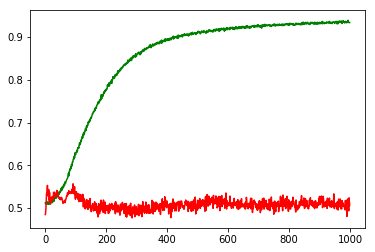

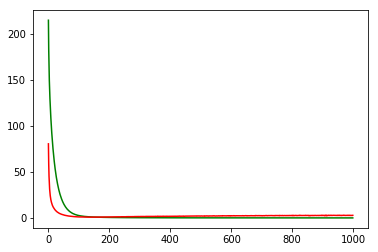

working on d,u and l,le 0.5 256 0.01 1e-05


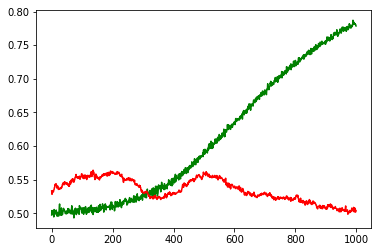

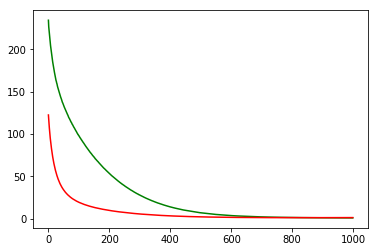

working on d,u and l,le 0.5 256 0.05 0.001


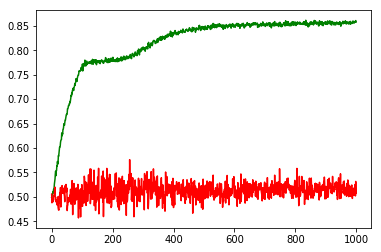

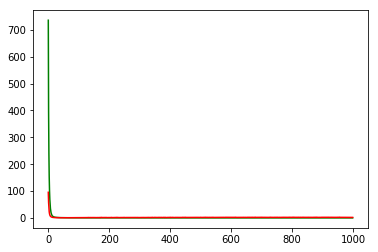

working on d,u and l,le 0.5 256 0.05 0.0001


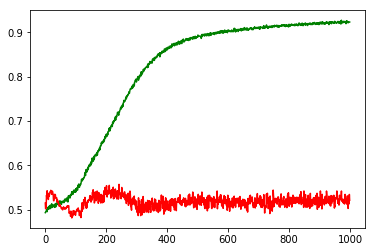

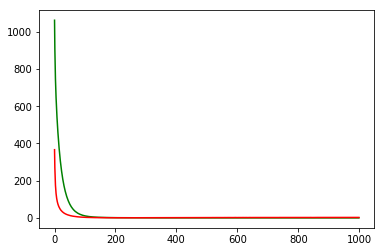

working on d,u and l,le 0.5 256 0.05 1e-05


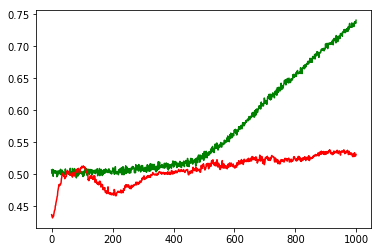

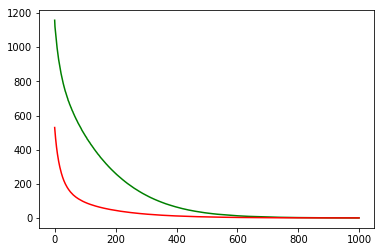

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.001
Chart for BEST MODEL FOR: PYPL


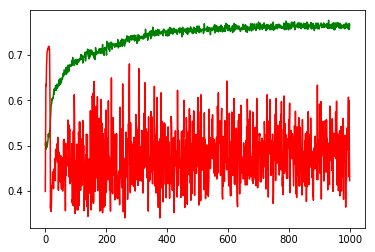

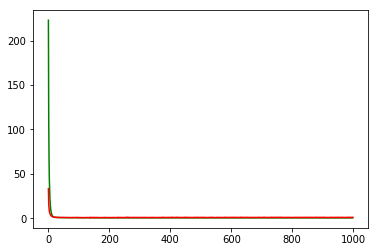

F1,score 0.45393634840871017
G-score: 0.46525844894535684
Accuracy 0.422497787129256
Window: 140
[[206 112]
 [540 271]]
Vol pos 2.750606016994409
Vol neg 3.0264257688355536
Real Percentage of gain: -59.27108969100344
Percentage of gain: -0.585642631686845
Total gain: -661.1905311744481
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 89  45]
 [261 184]]
579/579 [==============================] - 0s 24us/step
[1.0675392731483737, 0.47150259077651924]
Percentile:  1
[[ 28  23]
 [196  61]]
308/308 [==============================] - 0s 27us/step
[1.3764003782303302, 0.28896104050921156]
Percentile:  2
[[80 40]
 [49 15]]
184/184 [==============================] - 0s 25us/step
[1.1004471830699756, 0.5163043465303339]
Percentile:  3
[[ 9  4]
 [26  4]]
43/43 [==============================] - 0s 47us/step
[1.235993465711904, 0.3023255813953488]
Percentile:  4
[[0 0]
 [7 5]]
12/12 [==============================] - 0s 47us/step
[0.7989733219146729, 0.4166666567325592]
00000000

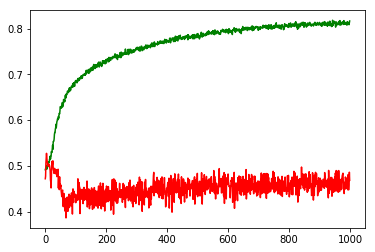

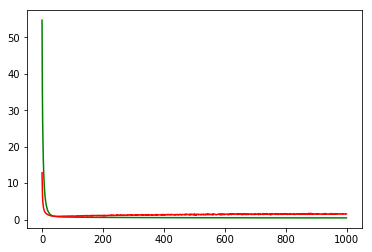

working on d,u and l,le 0.5 64 0.01 0.0001


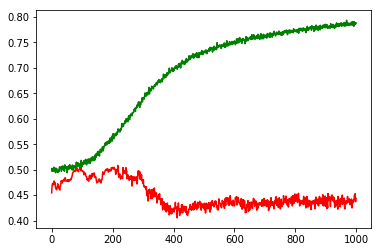

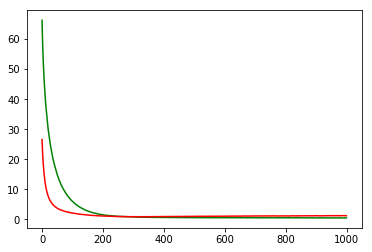

working on d,u and l,le 0.5 64 0.01 1e-05


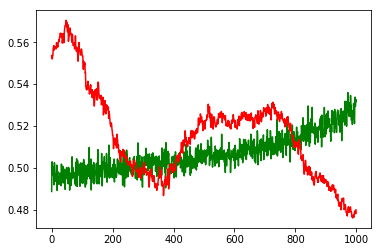

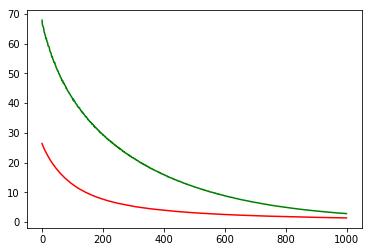

working on d,u and l,le 0.5 64 0.05 0.001


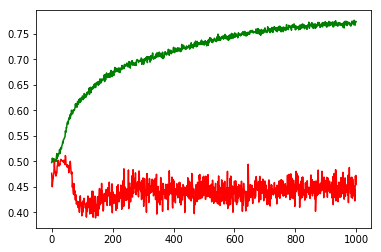

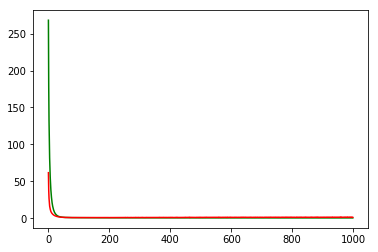

working on d,u and l,le 0.5 64 0.05 0.0001


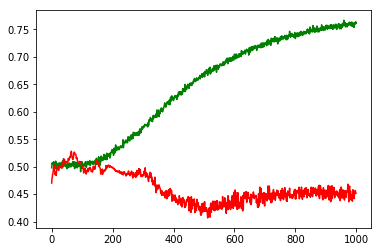

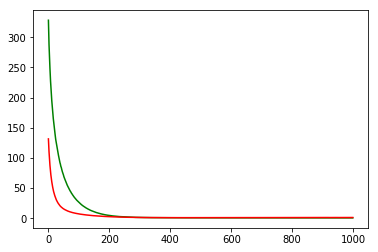

working on d,u and l,le 0.5 64 0.05 1e-05


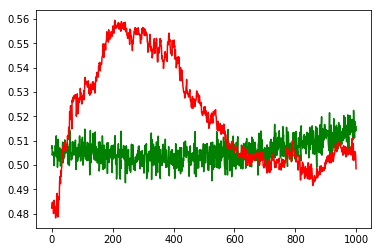

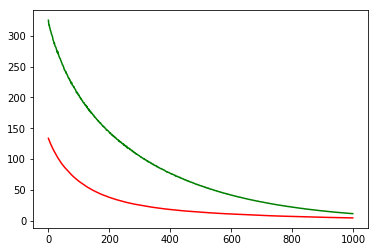

working on d,u and l,le 0.5 128 0.01 0.001


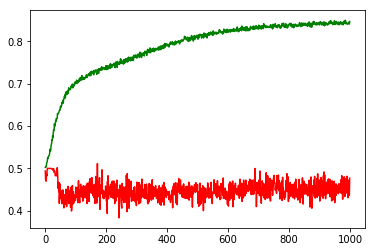

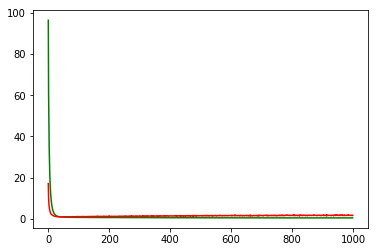

working on d,u and l,le 0.5 128 0.01 0.0001


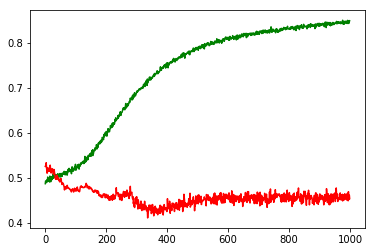

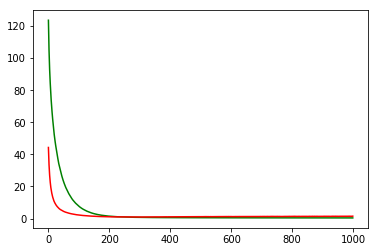

working on d,u and l,le 0.5 128 0.01 1e-05


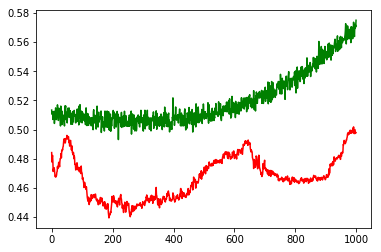

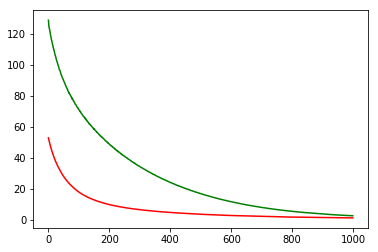

working on d,u and l,le 0.5 128 0.05 0.001


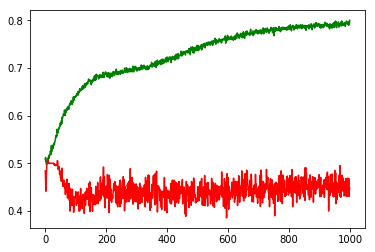

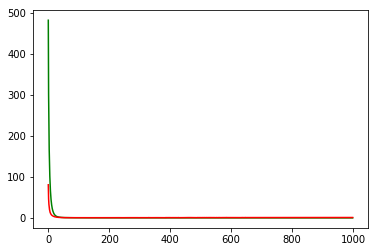

working on d,u and l,le 0.5 128 0.05 0.0001


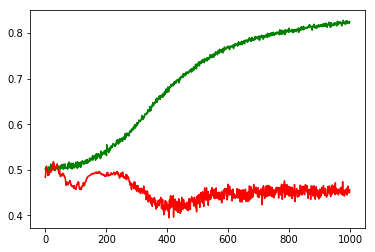

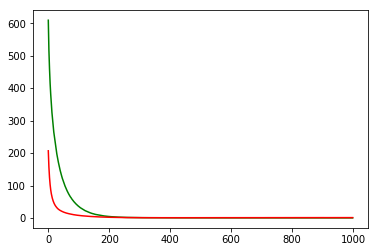

working on d,u and l,le 0.5 128 0.05 1e-05


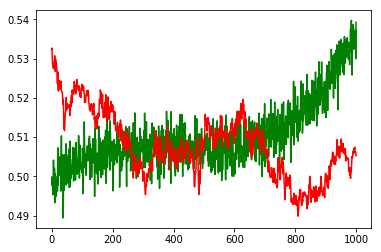

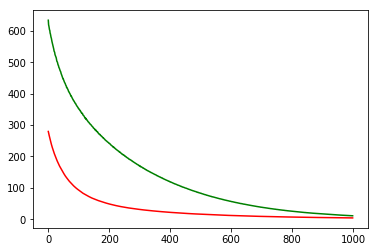

working on d,u and l,le 0.5 256 0.01 0.001


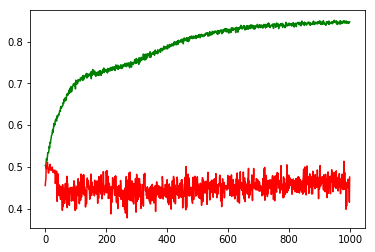

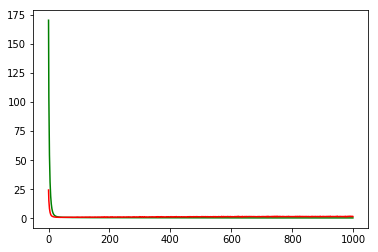

working on d,u and l,le 0.5 256 0.01 0.0001


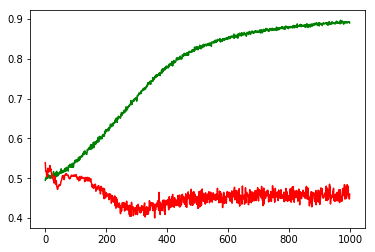

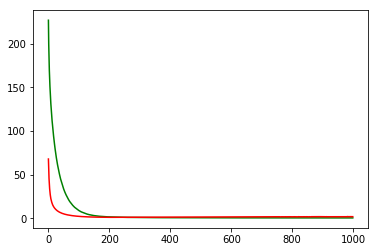

working on d,u and l,le 0.5 256 0.01 1e-05


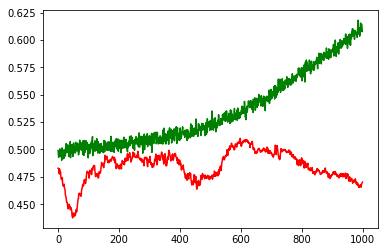

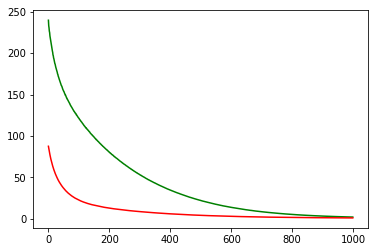

working on d,u and l,le 0.5 256 0.05 0.001


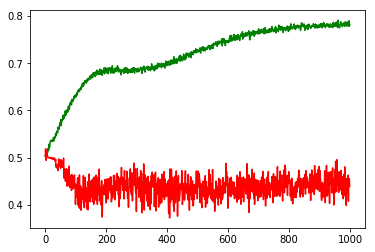

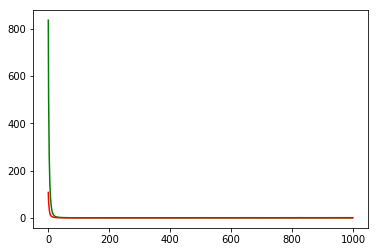

working on d,u and l,le 0.5 256 0.05 0.0001


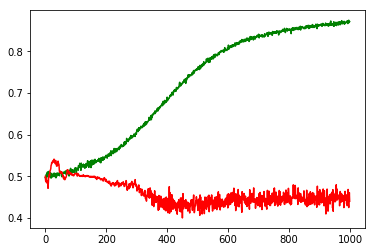

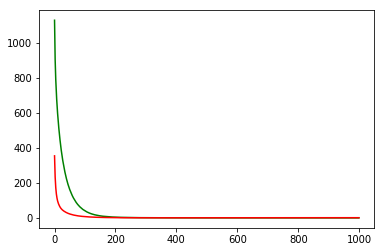

working on d,u and l,le 0.5 256 0.05 1e-05


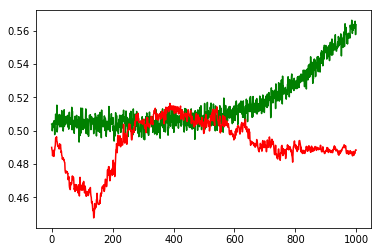

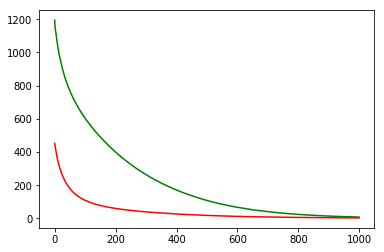

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.001
Chart for BEST MODEL FOR: GILD


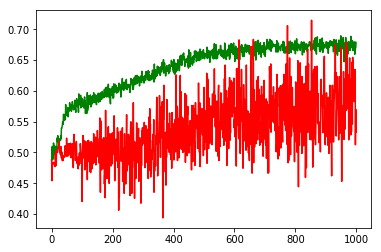

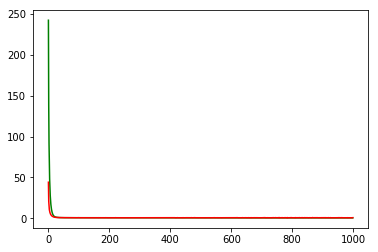

F1,score 0.2963951935914553
G-score: 0.41371542715447446
Accuracy 0.5328014180169883
Window: 140
[[490  92]
 [435 111]]
Vol pos 3.576122226182974
Vol neg 2.854268757650843
Real Percentage of gain: 187.11173383884116
Percentage of gain: 0.5718526796577773
Total gain: 645.0498226539728
000000000000000000000000000000000000000000000000
Percentile:  0
[[284  55]
 [204  65]]
608/608 [==============================] - 0s 29us/step
[0.7320431361072942, 0.5740131578947368]
Percentile:  1
[[ 82  21]
 [175  29]]
307/307 [==============================] - 0s 32us/step
[1.3026199492258823, 0.36156351830361333]
Percentile:  2
[[12  0]
 [54 16]]
82/82 [==============================] - 0s 33us/step
[0.9350994890782891, 0.3414634117266027]
Percentile:  3
[[31 10]
 [ 0  0]]
41/41 [==============================] - 0s 69us/step
[0.5798358103124107, 0.7560975609756098]
Percentile:  4
[[80  6]
 [ 0  0]]
86/86 [==============================] - 0s 36us/step
[0.35788233890089877, 0.9302325609118439]
0000000

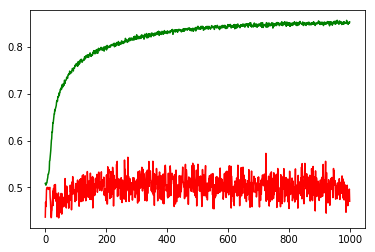

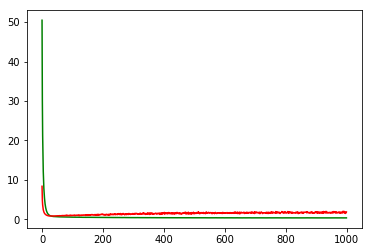

working on d,u and l,le 0.5 64 0.01 0.0001


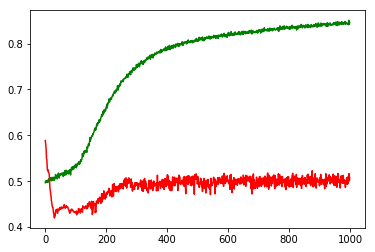

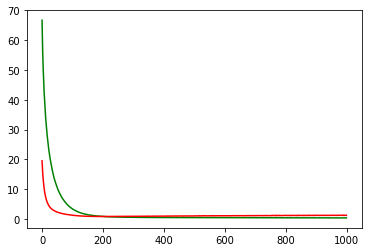

working on d,u and l,le 0.5 64 0.01 1e-05


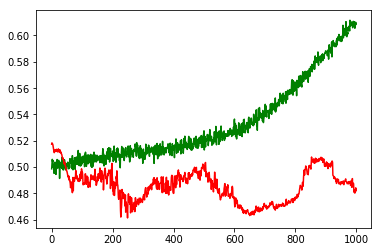

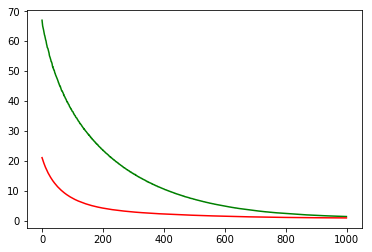

working on d,u and l,le 0.5 64 0.05 0.001


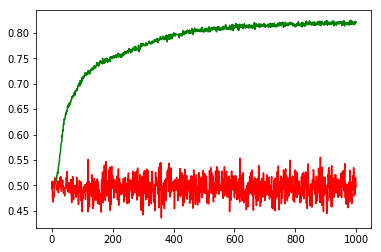

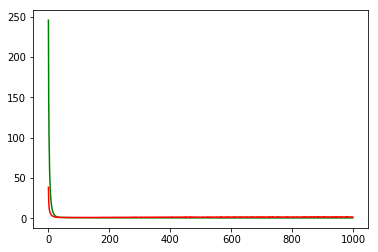

working on d,u and l,le 0.5 64 0.05 0.0001


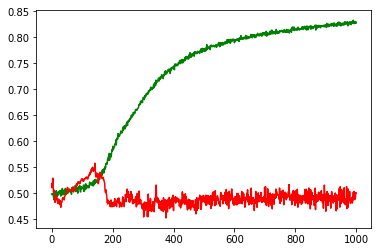

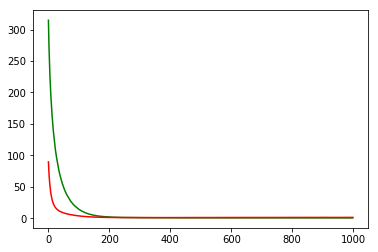

working on d,u and l,le 0.5 64 0.05 1e-05


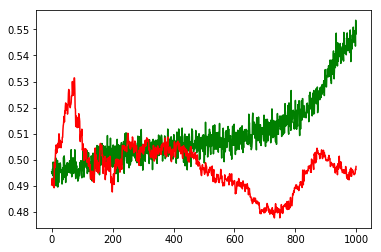

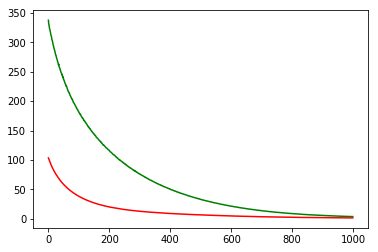

working on d,u and l,le 0.5 128 0.01 0.001


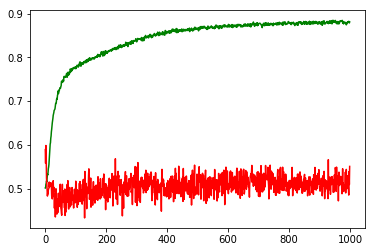

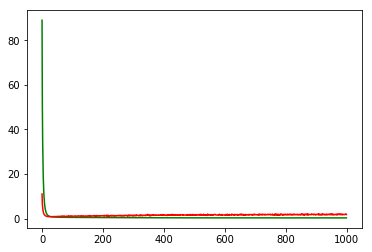

working on d,u and l,le 0.5 128 0.01 0.0001


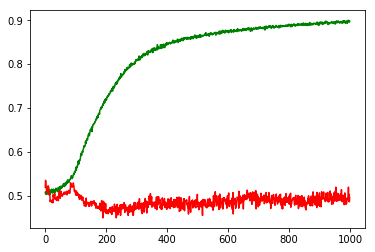

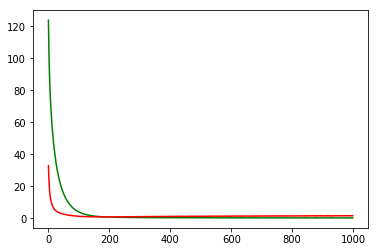

working on d,u and l,le 0.5 128 0.01 1e-05


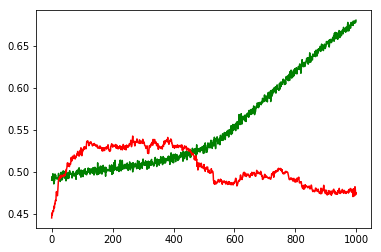

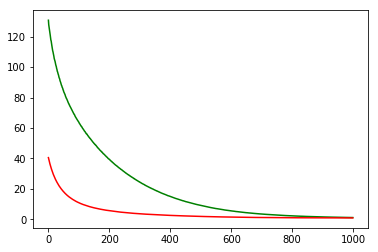

working on d,u and l,le 0.5 128 0.05 0.001


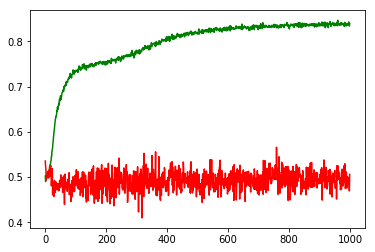

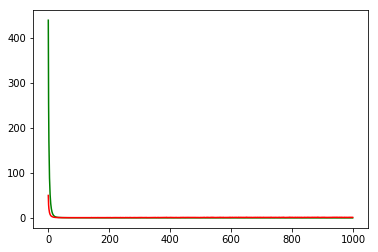

working on d,u and l,le 0.5 128 0.05 0.0001


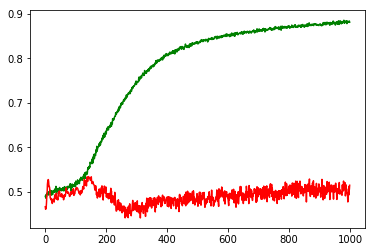

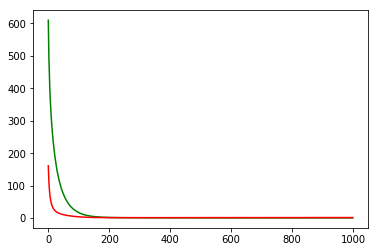

working on d,u and l,le 0.5 128 0.05 1e-05


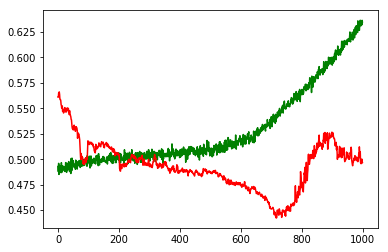

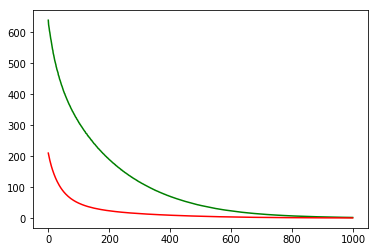

working on d,u and l,le 0.5 256 0.01 0.001


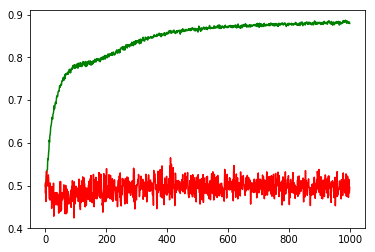

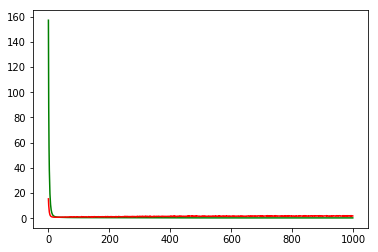

working on d,u and l,le 0.5 256 0.01 0.0001


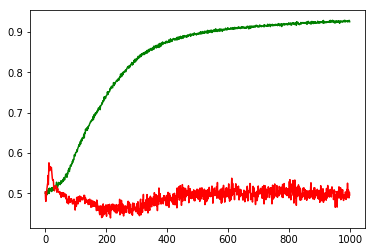

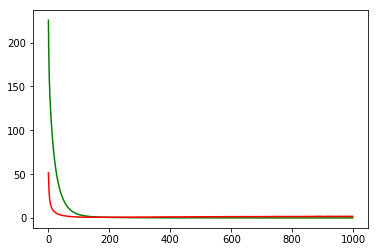

working on d,u and l,le 0.5 256 0.01 1e-05


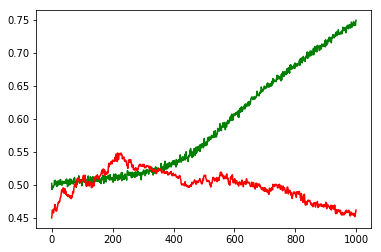

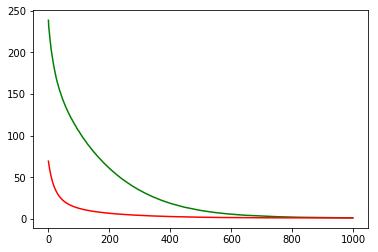

working on d,u and l,le 0.5 256 0.05 0.001


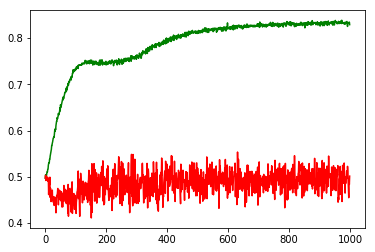

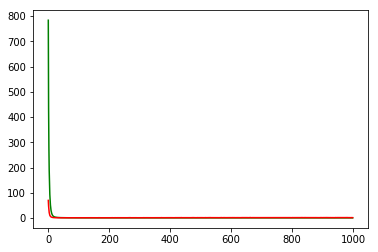

working on d,u and l,le 0.5 256 0.05 0.0001


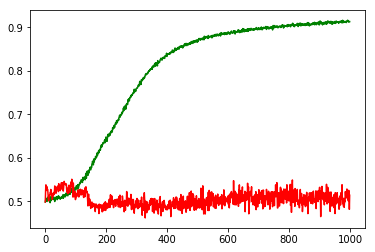

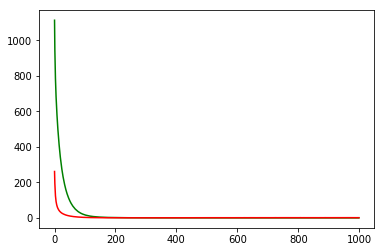

working on d,u and l,le 0.5 256 0.05 1e-05


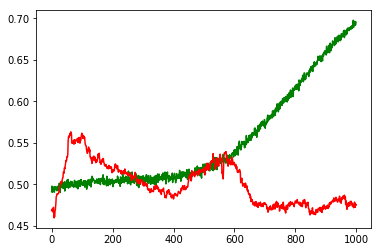

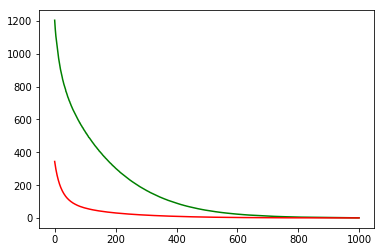

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: COST


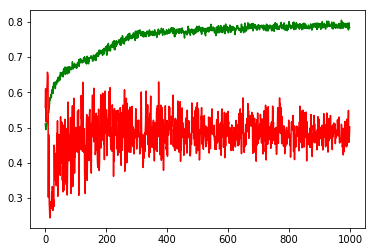

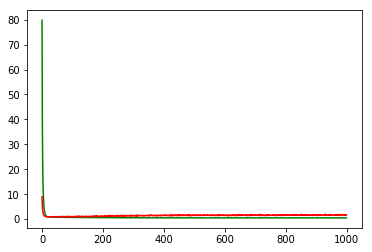

F1,score 0.5755287009063444
G-score: 0.4953806993775433
Accuracy 0.5013309661117188
Window: 140
[[184 201]
 [361 381]]
Vol pos 1.3705255243036296
Vol neg 1.4050156549539363
Real Percentage of gain: 35.162297604965744
Percentage of gain: -0.013550911138031491
Total gain: -15.271876852561489
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 82 118]
 [ 88  99]]
387/387 [==============================] - 0s 29us/step
[1.8471509902629741, 0.46770025839793283]
Percentile:  1
[[ 54  50]
 [ 89 117]]
310/310 [==============================] - 0s 30us/step
[1.637679316920619, 0.5516129028412604]
Percentile:  2
[[ 38  30]
 [ 99 106]]
273/273 [==============================] - 0s 36us/step
[1.532228865466275, 0.5274725275816935]
Percentile:  3
[[ 9  3]
 [36 44]]
92/92 [==============================] - 0s 50us/step
[1.1111577023630557, 0.5760869565217391]
Percentile:  4
[[ 0  0]
 [48 15]]
63/63 [==============================] - 0s 33us/step
[1.5931538986781286, 0.2380952380952380

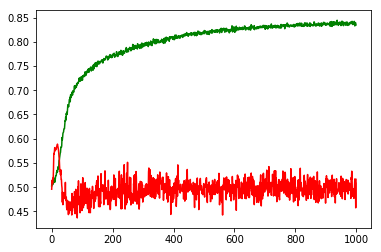

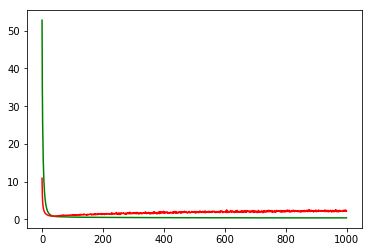

working on d,u and l,le 0.5 64 0.01 0.0001


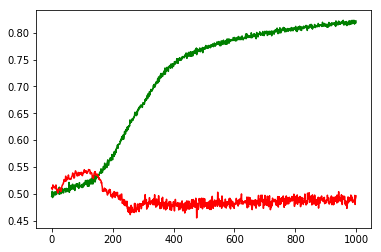

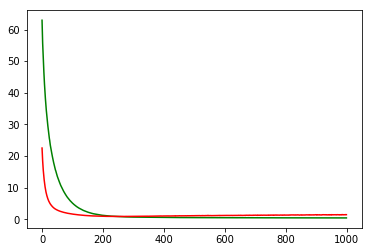

working on d,u and l,le 0.5 64 0.01 1e-05


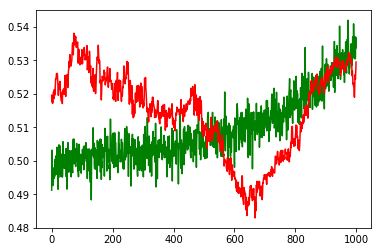

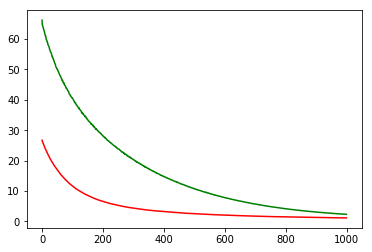

working on d,u and l,le 0.5 64 0.05 0.001


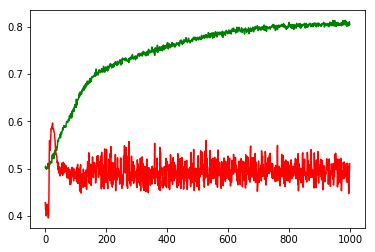

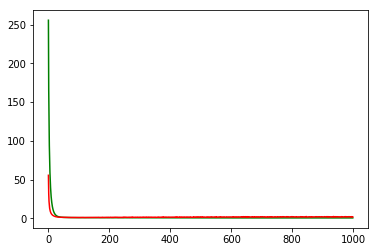

working on d,u and l,le 0.5 64 0.05 0.0001


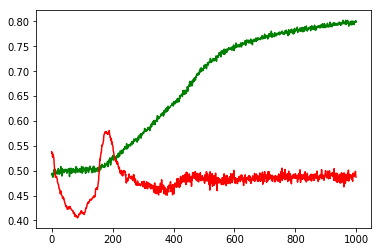

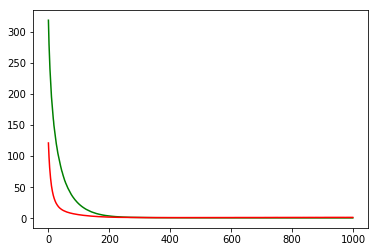

working on d,u and l,le 0.5 64 0.05 1e-05


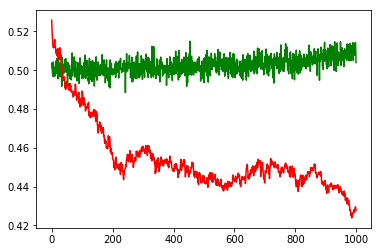

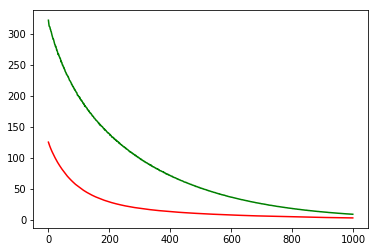

working on d,u and l,le 0.5 128 0.01 0.001


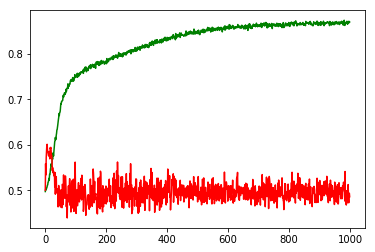

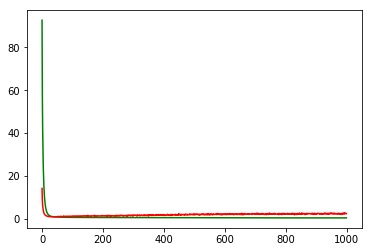

working on d,u and l,le 0.5 128 0.01 0.0001


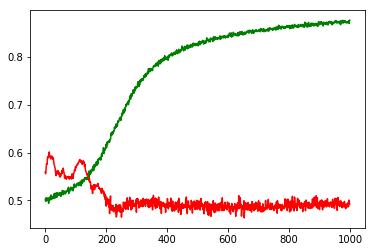

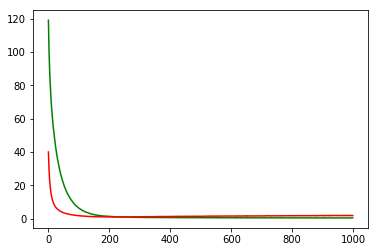

working on d,u and l,le 0.5 128 0.01 1e-05


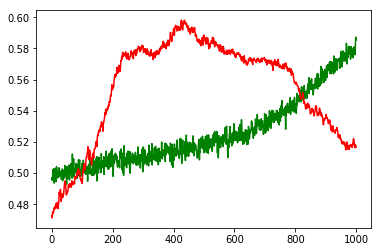

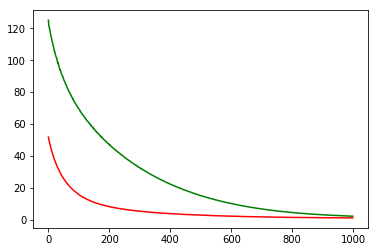

working on d,u and l,le 0.5 128 0.05 0.001


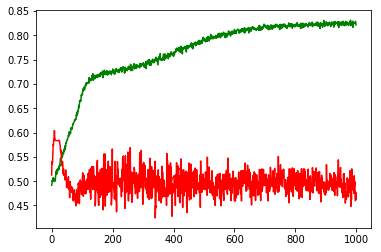

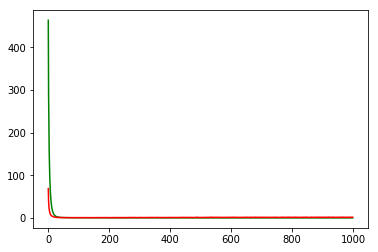

working on d,u and l,le 0.5 128 0.05 0.0001


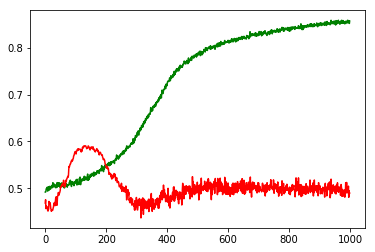

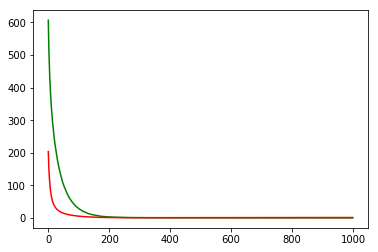

working on d,u and l,le 0.5 128 0.05 1e-05


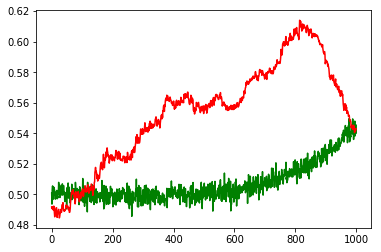

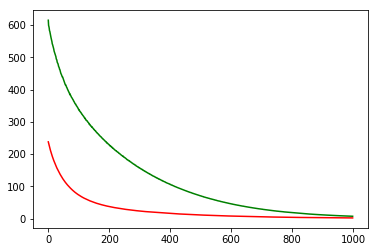

working on d,u and l,le 0.5 256 0.01 0.001


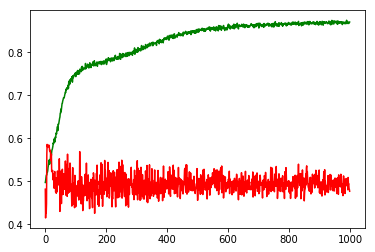

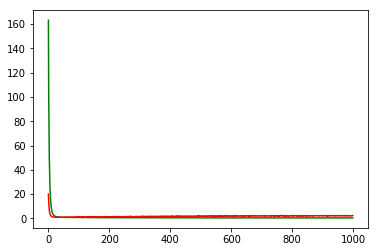

working on d,u and l,le 0.5 256 0.01 0.0001


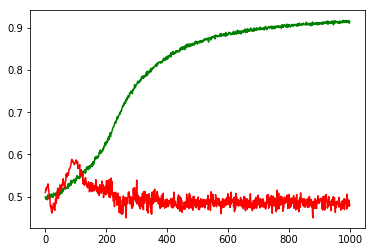

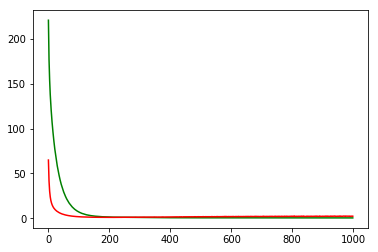

working on d,u and l,le 0.5 256 0.01 1e-05


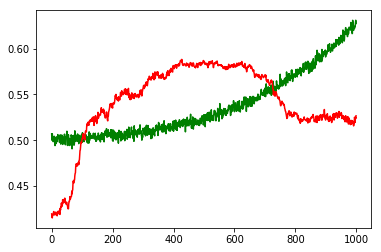

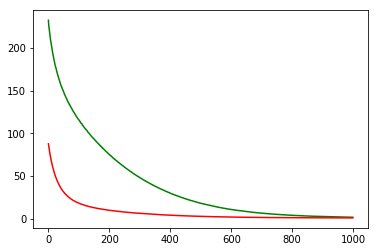

working on d,u and l,le 0.5 256 0.05 0.001


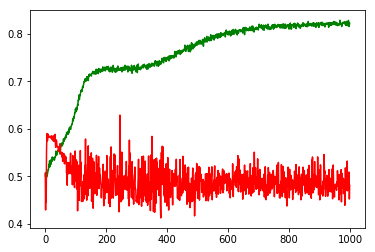

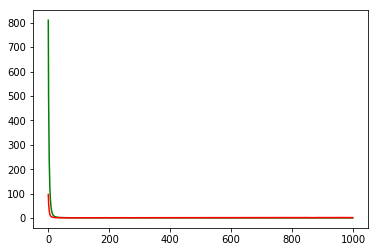

working on d,u and l,le 0.5 256 0.05 0.0001


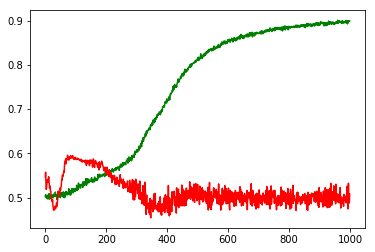

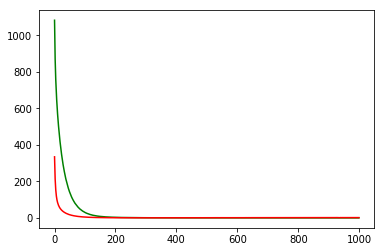

working on d,u and l,le 0.5 256 0.05 1e-05


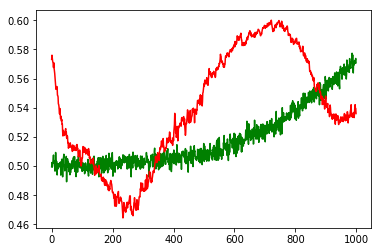

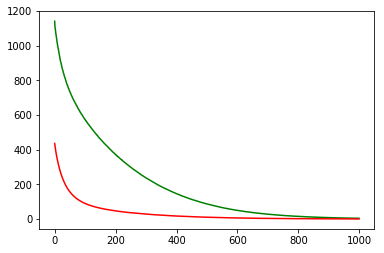

maxd,maxu,maxl,maxle: 0.5 64 0.01 0.001
Chart for BEST MODEL FOR: QCOM


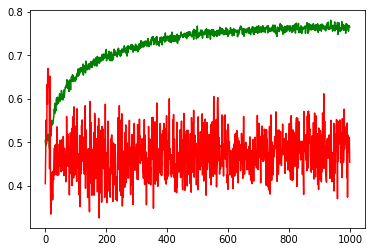

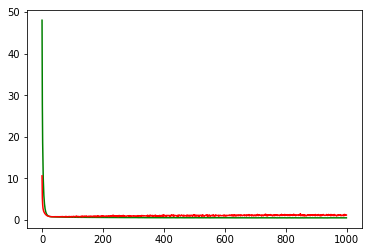

F1,score 0.4648742411101474
G-score: 0.48920390312781353
Accuracy 0.45446507399531194
Window: 140
[[246 109]
 [508 268]]
Vol pos 3.662469019052126
Vol neg 3.0929501619291533
Real Percentage of gain: 9.996465102286393
Percentage of gain: -0.02284807614278959
Total gain: -25.84117411749503
000000000000000000000000000000000000000000000000
Percentile:  0
[[151  79]
 [198 101]]
529/529 [==============================] - 0s 24us/step
[1.1504791787982211, 0.47637051042514394]
Percentile:  1
[[ 31  17]
 [218  78]]
344/344 [==============================] - 0s 29us/step
[1.4790873971096306, 0.31686046580935634]
Percentile:  2
[[18  0]
 [46 44]]
108/108 [==============================] - 0s 35us/step
[0.8879614913905108, 0.5740740740740741]
Percentile:  3
[[12  0]
 [38 30]]
80/80 [==============================] - 0s 38us/step
[0.6824057102203369, 0.525]
Percentile:  4
[[33 13]
 [ 7 15]]
68/68 [==============================] - 0s 68us/step
[0.6182998839546653, 0.7058823529411765]
00000000000000

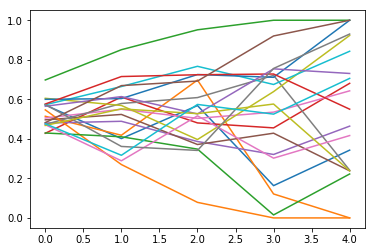

Ecco la matrice generale:
[[4117. 3359.]
 [6543. 7362.]]
Ecco le matrici per percentile
Percentile : 0
[[2295. 1987.]
 [2596. 2693.]]
Percentile : 1
[[ 869.  743.]
 [2225. 2433.]]
Percentile : 2
[[ 463.  362.]
 [1086. 1392.]]
Percentile : 3
[[272. 177.]
 [444. 590.]]
Percentile : 4
[[209.  88.]
 [178. 236.]]


In [4]:
import warnings
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
warnings.filterwarnings('ignore')
o=0
accstocksresults=[]
f1stocksresults=[]
f1scoreresults=[]
aucresults=[]
chartlist=[]
gainlist=[]
pricegainlist=[]
totalconfusion=np.zeros((2,2))
confusionlist=[]
for con in range(0,5):
    confusionlist.append(np.zeros((2,2)))

for price in prices:
    #print('New price[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]')
    
   
    print('Working on...',files[o])
    
    senttemp=sentiment[o]
    senttemp=np.nan_to_num(np.asarray(senttemp, dtype=float))
    
    xtemp=price
    o+=1
    xtemp=np.nan_to_num(np.asarray(xtemp, dtype=float))
    
    #print(xtemp)
    accintime=[]
    trendwindowtime=[140]
    f1total=[]
    acctotal=[]
    auctotal=[]
    percfinal=[]
    f1scoretotal=[]
    percpostotal=[]
    percnegtotal=[]
    for t in trendwindowtime:
        #1
    #label because of the maket and append values without data
    #simo theroy past trend
        
        x=[]
        y=[]
        percentage=[]
        
        yvolatility=[]
        yprice=[]
        #print('============================================================')
        #print('Working on window:',t)
        #print(len(xtemp))
        ##QUI C E L'UNICO APPUNTO GUARDA SE CON +1 CAMBIA
        
        for i in range(0,len(price)-t-1):
            s=np.sign(price.iloc[i+t+1]['close']-price.iloc[i+1]['open'])
            percentage.append((100*(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open']) 
            if(s==-1):
                y.append(0)
            else:
                y.append(1)
            yvolatility.append((100*abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open'])
            yprice.append(abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))
            x.append(senttemp[i])
        
        y=np.array(y)
        x=np.array(x)
        
        scaler = MinMaxScaler() 
        scaler.fit(x)
        MinMaxScaler(copy=True, feature_range=(0, 1))
        x=scaler.transform(x)
        yvolatility=np.array(yvolatility)
       
        permindex=range(0,len(x))
        #permindex=np.random.permutation(permindex)
        train=0.8
        nt=math.ceil(len(x)*train)
        trainvalindex=permindex[0:nt]
        testindex=permindex[nt:]
        x_tv=[]
        y_tv=[]
        x_test=[]
        y_test=[]
        x_tv=x[trainvalindex]
        y_tv=y[trainvalindex]
        x_test=x[testindex]
        y_test=y[testindex]
        yvolatilitytest=yvolatility[testindex]
        #create structure for percentile valuation
        distribution=[]
        print(max(yvolatilitytest))
        print(min(yvolatilitytest))
        step=(max(yvolatilitytest)-min(yvolatilitytest))/5
        for v in range(0,5):
            pindexes=[]
            for r in range(0,len(y_test)):
                if(yvolatilitytest[r]<min(yvolatilitytest)+step+step*v and yvolatilitytest[r]>min(yvolatilitytest)+step*v):
                    pindexes.append(r)
            distribution.append(pindexes)
    

            
        lspace=[0.01,0.05]
        dropspace=[0.5]
        uspace=[64,128,256]
        learnspace=[0.001,0.0001,0.00001]
        
        
        bestsvm=None
        bestca=[]
        bestcl=[]
        maxacc=0
        cvacc=0
        maxu=0
        maxl=0
        maxd=0
        maxle=0
        #print('Model Selection...')
        #model selection
        cvacc=0
        totu=0
        for d in dropspace:
            for u in uspace:
                #print()
                for l in lspace:
                    for le in learnspace:
                    
                   
                        print('=========================================================')
                        print('working on d,u and l,le',d,u,l,le)

                        cvacclist=[]
                        #faccio cross validation
                        #start with 40% as train and 10% for validation and then i move in percentege
                        # 0-40 40-50
                        # 0-50 50-60
                        # 0-60 60-70 
                        #etc test set is completely external i do in some way error extimation changin the ticker
                        trainpoint=math.floor(len(x_tv)*0.40)
                        dimval=math.floor(trainpoint*0.25)
                        endval=trainpoint+dimval
                        
                        for i in range(0,6):
                            model=buildModel(l,u,d,le)
                            #print('-----')
                            x_train=x_tv[0:trainpoint]
                            y_train=y_tv[0:trainpoint]
                            x_val=x_tv[trainpoint:endval]
                            y_val=y_tv[trainpoint:endval]

                            trainpoint=trainpoint+dimval
                            endval=endval+dimval

                            x_train,y_train=smote(x_train,y_train)
                            if(sum(y_val)+6<len(x_val) and sum(y_val)>6):
                                x_val,y_val=smote(x_val,y_val)
                            else:
                                totu=totu+1

                            history=model.fit(x_train, y_train, epochs = 1000,batch_size =128, verbose=0, validation_data=(x_val, y_val),
                                              shuffle=True)
                            prediction=model.predict(x_val, batch_size=128, verbose=0)
                            for el in range(0,len(prediction)):
                                if(prediction[el]>0.5):
                                    prediction[el]=1
                                else:
                                    prediction[el]=0



                            if(i==0):
                                meanhvl=np.asarray(history.history['val_loss'])
                                meanhva=np.asarray(history.history['val_acc'])
                                meanhl=np.asarray(history.history['loss'])
                                meanha=np.asarray(history.history['acc'])

                            else:
                                meanhvl=np.add(meanhvl,history.history['val_loss'])
                                meanhva=np.add(meanhva,history.history['val_acc'])
                                meanha=np.add(meanha,history.history['acc'])
                                meanhl=np.add(meanhl,history.history['loss'])
                           
                            #i take the last one
                            #maxAcc=history.history['val_acc'][len(history.history['val_acc'])-1]
                            #USING G SCORE AS MODEL SELECTION METRIC
                            maxAcc=geometric_mean_score(y_val, prediction)
                            cvacclist.append(maxAcc)
                            model=None
                            history=None
                            
                            del model
                            del history
                            gc.collect()
                            tf.reset_default_graph() 
                            K.clear_session()

                        cvacc=sum(cvacclist)/len(cvacclist)
                        if(cvacc>maxacc):
                            maxacc=cvacc
                            maxu=u
                            maxl=l
                            maxle=le
                            maxd=d


                        meanhvl=meanhvl/6
                        meanhva=meanhva/6
                        meanhl=meanhl/6
                        meanha=meanha/6

                        plt.plot(meanha,'g')
                        plt.plot(meanhva,'r')
                        plt.show()
                        plt.plot(meanhl,'g')
                        plt.plot(meanhvl,'r')
                        plt.show()

                        print('=========================================================')
        model=buildModel(maxl,maxu,maxd,maxle)
        x_tv,y_tv=smote(x_tv,y_tv)
        history=model.fit(x_tv, y_tv, epochs =1000,batch_size =128, verbose=0, validation_data=(x_test, y_test),
                                          shuffle=True)
        prediction=model.predict(x_test, batch_size=128, verbose=0)
        predictionscsv = pd.DataFrame(data=prediction,columns=[files[o-1]])
        tempdate=np.array(dates[o-1])
        predictionscsv.index = tempdate[testindex]
        predictionscsv.to_csv('/home/andrea/Desktop/NLFF/technicalAnalysis/NN/Predictions/Newsetting/newwithadam/news/'+files[o-1]+'.csv')
        for el in range(0,len(prediction)):
            if(prediction[el]>0.5):
                prediction[el]=1
            else:
                prediction[el]=0
            
        
        
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('maxd,maxu,maxl,maxle:',maxd,maxu,maxl,maxle)
        print('Chart for BEST MODEL FOR:',files[o-1])
        plt.plot(history.history['acc'],'g')
        plt.plot(history.history['val_acc'],'r')
        plt.show()
        plt.plot(history.history['loss'],'g')
        plt.plot(history.history['val_loss'],'r')
        plt.show()
        acctotal.append(history.history['val_acc'][len(history.history['val_acc'])-1])
        confmatrix=confusion_matrix(y_test, prediction,labels=[0,1])
        totalconfusion=totalconfusion+confmatrix
        volr=[]
        voln=[]
        pricegain=0
        for j in range(0,len(x_test)):
            if(y_test[j]==prediction[j]):
                volr.append(yvolatilitytest[j])
                pricegain=pricegain+yprice[j]
            else:
                voln.append(yvolatilitytest[j])
                pricegain=pricegain-yprice[j]
        
        CM = f1_score(y_test, prediction)
        fpr, tpr, thresholds = metrics.roc_curve(y_test, prediction)
        auc=metrics.auc(fpr, tpr)
        valueacc=geometric_mean_score(y_test, prediction)
        
        print('F1,score',CM)
        print('G-score:',valueacc)
        realacc=history.history['val_acc'][len(history.history['val_acc'])-1]
        accstocksresults.append(realacc)
        print('Accuracy',realacc)
        print('Window:',t)
        print(confmatrix)
        print('Vol pos',sum(volr)/len(volr))
        print('Vol neg',sum(voln)/len(voln))
        percnegtotal.append(sum(volr)/len(volr))
        percpostotal.append(sum(voln)/len(voln))
        #build structure to plot distribution onver percentile
        chart=np.zeros(5)
        for r in range(0,len(y_test)):
            for v in range(0,5):
                if(yvolatilitytest[r]<min(yvolatility)+step+step*v and yvolatilitytest[r]>min(yvolatility)+step*v):
                    chart[v]+=1
        #plt.plot(chart)
        #plt.show()
        print('Real Percentage of gain:',(pricegain*100)/(sum(price.iloc[1:6]['open'])))
        pricegainlist.append((pricegain*100)/(sum(price.iloc[1:6]['open'])))
        print('Percentage of gain:',(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('Total gain:',len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        gainlist.append(len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('000000000000000000000000000000000000000000000000')
        #performances for each percentile
        chartscore=[]
        for g in range(0,len(distribution)):
            print('Percentile: ',g)
            tempscore=0
            if(len(distribution[g])>0):
                predictionp=model.predict(x_test[distribution[g]])
                for el in range(0,len(predictionp)):
                    if(predictionp[el]>0.5):
                        predictionp[el]=1
                    else:
                        predictionp[el]=0
                        #labels added later
                tempmatrix=confusion_matrix(y_test[distribution[g]], predictionp,labels=[0,1])
                confusionlist[g]=confusionlist[g]+tempmatrix
                print(tempmatrix)
                print(model.evaluate(x_test[distribution[g]],y_test[distribution[g]]))
                tempscore=model.evaluate(x_test[distribution[g]],y_test[distribution[g]], verbose=0)
            chartscore.append(tempscore[1])    
        chartlist.append(chartscore)
        print('000000000000000000000000000000000000000000000000')
print('Mean acc over portfolio:',sum(accstocksresults)/len(accstocksresults))
print('Mean gain over portfolio : ', sum(gainlist)/len(gainlist))
print('Real mean gain over portfolio',sum(pricegainlist)/len(pricegainlist))
#print all the accuracy varing the percentile
for st in range(0,len(chartlist)):
    plt.plot(chartlist[st])
plt.show()
print('Ecco la matrice generale:')
print(totalconfusion)
print('Ecco le matrici per percentile')
for i in range(0,len(confusionlist)):
    print('Percentile :',i)
    print(confusionlist[i])        
   

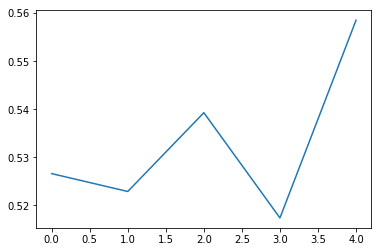

In [5]:
tot=np.zeros(5)
for st in range(0,len(chartlist)):
    tot=chartlist[st]+tot
    
tot=tot/len(chartlist)
plt.plot(tot)
plt.show()